In [1]:
# define libraries to use
import pandas as pd
import numpy as np
#from pathlib import Path
import requests,json
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import scipy as sp
%matplotlib inline
import pickle
import seaborn as sns
from tabulate import tabulate

pd.options.display.max_columns = None
pd.options.display.max_rows = 50

def millions(x,pos=0):
    if x==0:
        return '0'
    else:
        return '%1.1fM' % (float(x) * 1e-6)


In [2]:
nydmvModelIDCat = pd.read_pickle("tmp/nydmv-vindecode-modelid-dict.pkl")

In [3]:
nydmvVinDecodeDf = pd.read_pickle("tmp/nydmv-vindecodedf.pkl")
nydmvVinDecodeDf.set_index("entry",inplace=True)
nydmvDf = pd.read_pickle("tmp/nydmvdf.pkl")
nydmvVinDecodeDf = pd.merge(nydmvDf,nydmvVinDecodeDf,left_index=True, right_index=True)
nydmvDf = None
nydmvVinDecodeDf.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11180719 entries, 33 to 12586465
Data columns (total 55 columns):
 #   Column                            Non-Null Count     Dtype         
---  ------                            --------------     -----         
 0   VIN                               11180719 non-null  object        
 1   Registration Class                11180719 non-null  category      
 2   City                              11180719 non-null  object        
 3   State                             11180719 non-null  category      
 4   Zip                               11180719 non-null  category      
 5   County                            11180719 non-null  object        
 6   Model Year                        11180719 non-null  Int64         
 7   Make                              11180719 non-null  category      
 8   Body Type                         11180719 non-null  category      
 9   Fuel Type                         11180719 non-null  category      
 10  Unl

In [4]:
farsVehVpicMergeDf = pd.read_pickle("tmp/fars-vehvpicmergedf.pkl")
farsAccidentDf = pd.read_pickle("tmp/fars-accidentdf.pkl")
# add STATE to farsVehVpicMergeDf
farsVehVpicMergeDf = pd.merge(farsVehVpicMergeDf,farsAccidentDf[["ST_CASE","STATE"]],on="ST_CASE")
farsVehVpicMergeDf.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51435 entries, 0 to 51434
Data columns (total 77 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   ST_CASE                           51435 non-null  int64  
 1   VEH_NO                            51435 non-null  int64  
 2   NUMOCCS                           51435 non-null  int64  
 3   MAKE                              51435 non-null  int64  
 4   MAK_MOD                           51435 non-null  int64  
 5   BODY_TYP                          51435 non-null  int64  
 6   MOD_YEAR                          51435 non-null  int64  
 7   VIN                               51435 non-null  object 
 8   TOW_VEH                           51435 non-null  int64  
 9   TRAV_SP                           51435 non-null  int64  
 10  ROLLOVER                          51435 non-null  int64  
 11  IMPACT1                           51435 non-null  int64  
 12  M_HA

In [5]:
farsPersonDf = pd.read_pickle("tmp/fars-persondf.pkl")
# keep drivers only
#farsPersonDf.info(show_counts=True)
farsPersonDf = farsPersonDf[farsPersonDf["PER_NO"]==1][["ST_CASE","VEH_NO","SEX","AGE"]]
farsPersonDf["SEX"] = farsPersonDf["SEX"].astype("int64")
farsPersonDf["AGE"] = farsPersonDf["AGE"].astype("int64")
farsPersonDf.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 61911 entries, 0 to 85883
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   ST_CASE  61911 non-null  int64
 1   VEH_NO   61911 non-null  int64
 2   SEX      61911 non-null  int64
 3   AGE      61911 non-null  int64
dtypes: int64(4)
memory usage: 2.4 MB


In [6]:
# top 20 vehicle models involved in crashes
farsTopModels = pd.read_pickle("tmp/fars-topmodels.pkl")
farsTopModels.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   ModelId  20 non-null     int64
dtypes: int64(1)
memory usage: 288.0 bytes


In [7]:
f = open("tmp/fars-categories.pkl","rb")
farsCategories = pickle.load(f)
f.close()

In [8]:
farsCategories.keys()

dict_keys(['STATE', 'MONTH', 'DAY_WEEK', 'ROUTE', 'RUR_URB', 'FUNC_SYS', 'HARM_EV', 'MAN_COLL', 'LGT_COND', 'WEATHER', 'NUMOCCS', 'MAKE', 'MAK_MOD', 'BODY_TYP', 'TOW_VEH', 'TRAV_SP', 'ROLLOVER', 'IMPACT1', 'M_HARM', 'DR_PRES', 'L_STATUS', 'L_TYPE', 'SPEEDREL', 'VSURCOND', 'P_CRASH2', 'ACC_TYPE', 'DR_DRINK', 'VPICMAKE', 'VPICMODEL', 'VPICBODYCLASS', 'GVWR_FROM', 'GVWR_TO', 'SEX', 'PER_TYP', 'INJ_SEV', 'SEAT_POS', 'REST_USE', 'AIR_BAG', 'EJECTION', 'LOCATION', 'PNUMOCCS', 'PTYPE', 'PMAKE', 'PMAK_MOD', 'PTRAILER', 'PM_HARM', 'PBPTYPE', 'PBAGE', 'PBSEX', 'AOI1', 'AOI2', 'CRASHRF', 'DRIVERRF', 'DRDISTRACT', 'DRIMPAIR', 'VEHICLECC', 'VISION', 'NMCC', 'VehicleTypeId', 'ManufacturerFullNameId', 'MakeId', 'ModelId', 'BodyClassId', 'GrossVehicleWeightRatingFromId', 'GrossVehicleWeightRatingToId', 'ForwardCollisionWarningId', 'DynamicBrakeSupportId', 'CrashImminentBrakingID', 'PedestrianAutoEmergencyBrakingId', 'BlindSpotWarningId', 'BlindSpotInterventionId', 'LaneDepartureWarningId', 'LaneKeepin

In [9]:
farsCategories["GVWR_FROM"]

{11: 'Class 1: 6,000 lbs. or less (2,722 kg or less)',
 12: 'Class 2: 6,001 - 10,000 lbs. (2,722 - 4,536 kg)',
 18: 'Class 8: 33,001 lbs. and above (14,969 kg and above)',
 15: 'Class 5: 16,001 - 19,500 lbs. (7,258 - 8,845 kg)',
 17: 'Class 7: 26,001 - 33,000 lbs. (11,794 - 14,969 kg)',
 13: 'Class 3: 10,001 - 14,000 lbs. (4,536 - 6,350 kg)',
 99: 'Reported as Unknown',
 16: 'Class 6: 19,501 - 26,000 lbs. (8,845 - 11,794 kg)',
 14: 'Class 4: 14,001 - 16,000 lbs. (6,350 - 7,258 kg)',
 98: 'Not Reported'}

In [10]:
farsCategories["GrossVehicleWeightRatingFromId"]

{nan: nan,
 14.0: 'Class 2E: 6,001 - 7,000 lb (2,722 - 3,175 kg)',
 9.0: 'Class 8: 33,001 lb and above (14,969 kg and above)',
 15.0: 'Class 2F: 7,001 - 8,000 lb (3,175 - 3,629 kg)',
 13.0: 'Class 1D: 5,001 - 6,000 lb (2,268 - 2,722 kg)',
 11.0: 'Class 1B: 3,001 - 4,000 lb (1,360 - 1,814 kg)',
 6.0: 'Class 5: 16,001 - 19,500 lb (7,258 - 8,845 kg)',
 17.0: 'Class 2H: 9,001 - 10,000 lb (4,082 - 4,536 kg)',
 12.0: 'Class 1C: 4,001 - 5,000 lb (1,814 - 2,268 kg)',
 8.0: 'Class 7: 26,001 - 33,000 lb (11,794 - 14,969 kg)',
 16.0: 'Class 2G: 8,001 - 9,000 lb (3,629 - 4,082 kg)',
 10.0: 'Class 1A: 3,000 lb or less (1,360 kg or less)',
 4.0: 'Class 3: 10,001 - 14,000 lb (4,536 - 6,350 kg)',
 1.0: 'Class 1: 6,000 lb or less (2,722 kg or less)',
 7.0: 'Class 6: 19,501 - 26,000 lb (8,845 - 11,794 kg)',
 2.0: 'Class 2: 6,001 - 10,000 lb (2,722 - 4,536 kg)',
 5.0: 'Class 4: 14,001 - 16,000 lb (6,350 - 7,258 kg)'}

## Eliminate Motorcycles, Buses, Off-Road Vehicles, Low-Speed Vehicles, Others

In [11]:
vpicBodyToRemove = [
    16, 68, 73, # Buses
    6, 12, 80, 81, 82, 83, 85, 87, 90, 94, 98, 100, 103, 104, 109, 110, 114, 125, 996, # Motorcycles
    69, 84, 86, 88, 97, 105, 113, 124, 126, 127, # off-road vehicles
    4, # low-speed vehiches
    108, 117, # Other
    61, # Trailers
    62, 63, 64, 65, 67, 70, 71, 72, 74, 75, 76, 77, 78, 107, 112, # Incomplete Body class (unfinished)
]

In [12]:
farsVehVpicMergeDf = farsVehVpicMergeDf[~farsVehVpicMergeDf["VPICBODYCLASS"].isin(vpicBodyToRemove)]
farsVehVpicMergeDf.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44922 entries, 0 to 51434
Data columns (total 77 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   ST_CASE                           44922 non-null  int64  
 1   VEH_NO                            44922 non-null  int64  
 2   NUMOCCS                           44922 non-null  int64  
 3   MAKE                              44922 non-null  int64  
 4   MAK_MOD                           44922 non-null  int64  
 5   BODY_TYP                          44922 non-null  int64  
 6   MOD_YEAR                          44922 non-null  int64  
 7   VIN                               44922 non-null  object 
 8   TOW_VEH                           44922 non-null  int64  
 9   TRAV_SP                           44922 non-null  int64  
 10  ROLLOVER                          44922 non-null  int64  
 11  IMPACT1                           44922 non-null  int64  
 12  M_HA

In [13]:
nydmvVinDecodeDf
nydmvVinDecodeDf = nydmvVinDecodeDf[~nydmvVinDecodeDf["BodyClassId"].isin(vpicBodyToRemove)]
nydmvVinDecodeDf.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10533510 entries, 33 to 12586465
Data columns (total 55 columns):
 #   Column                            Non-Null Count     Dtype         
---  ------                            --------------     -----         
 0   VIN                               10533510 non-null  object        
 1   Registration Class                10533510 non-null  category      
 2   City                              10533510 non-null  object        
 3   State                             10533510 non-null  category      
 4   Zip                               10533510 non-null  category      
 5   County                            10533510 non-null  object        
 6   Model Year                        10533510 non-null  Int64         
 7   Make                              10533510 non-null  category      
 8   Body Type                         10533510 non-null  category      
 9   Fuel Type                         10533510 non-null  category      
 10  Unl

Next steps:
1) FARS vpicdecode, see if GVWR_FROM can be infered from Model/Year/Trim/Series... from NYSDMV values
2) get vehicle grouping finalized

## FARS vpicdecode, see if GVWR_FROM can be infered from Model/Year/Trim/Series... from NYSDMV values

In [14]:
# check if model numbers are unique across makes
tmp1 = nydmvVinDecodeDf[["MakeID","ModelID"]].dropna().drop_duplicates()
if (tmp1["ModelID"].value_counts() > 1).sum() == 0:
    print("VPIC ModelIDs are Unique Across Manufacturers")
else:
    print("***************************************************************************")
    print("VPIC ModelIDs are NOT Unique Across Manufacturers!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print("***************************************************************************")


VPIC ModelIDs are Unique Across Manufacturers


In [15]:
# check how many vehicles have missing GVWR_FROM in all states
farsVehNATMissingGVWRCnt = farsVehVpicMergeDf["GrossVehicleWeightRatingFromId"].isna().sum()
farsVehNYSMissingGVWRCnt = (farsVehVpicMergeDf["GrossVehicleWeightRatingFromId"].isna() & (farsVehVpicMergeDf["STATE"] == 36)).sum()
print("FARS Vehicles missing GVWR (NAT): ", farsVehNATMissingGVWRCnt)
print("FARS Vehicles missing GVWR (NYS): ", farsVehNYSMissingGVWRCnt)
print("FARS Cases with Vehicles missing GVWR (NAT): ", farsVehVpicMergeDf[farsVehVpicMergeDf["GrossVehicleWeightRatingFromId"].isna()][["ST_CASE"]].drop_duplicates().count().values[0])

FARS Vehicles missing GVWR (NAT):  15987
FARS Vehicles missing GVWR (NYS):  398
FARS Cases with Vehicles missing GVWR (NAT):  14123


In [16]:
# check how many vehicles have missing GVWR_FROM in NY state
print("FARS NYS Vehicles missing GVWR:",farsVehVpicMergeDf[farsVehVpicMergeDf["GrossVehicleWeightRatingFromId"].isna() & (farsVehVpicMergeDf["STATE"] == 36)][["STATE"]].value_counts().values[0])
print("FARS NYS Cases with Vehicles missing GVWR: ",farsVehVpicMergeDf[farsVehVpicMergeDf["GrossVehicleWeightRatingFromId"].isna() & (farsVehVpicMergeDf["STATE"] == 36)][["ST_CASE"]].drop_duplicates().count().values[0])

FARS NYS Vehicles missing GVWR: 398
FARS NYS Cases with Vehicles missing GVWR:  353


In [17]:
print("FARS Models missing GVWR\n",farsVehVpicMergeDf[farsVehVpicMergeDf["GrossVehicleWeightRatingFromId"].isna()][["VPICMODEL"]].value_counts().sort_values(ascending=False))
print("FARS Total Models missing GVWR = ",farsVehVpicMergeDf[farsVehVpicMergeDf["GrossVehicleWeightRatingFromId"].isna()][["VPICMODEL"]].drop_duplicates().count().values[0])

FARS Models missing GVWR
 VPICMODEL
2469         1013
2208          734
1904          697
1833          575
1834          548
             ... 
14216           1
14185           1
23521           1
20813           1
28077           1
Length: 459, dtype: int64
FARS Total Models missing GVWR =  459


In [18]:
print("NYSDMV Model IDs found:\n",nydmvVinDecodeDf[~nydmvVinDecodeDf["GrossVehicleWeightRatingFromId"].isna()][["ModelID"]].value_counts().sort_values(ascending=False))

NYSDMV Model IDs found:
 ModelID
1865.0     317149
1850.0     267285
2217.0     254554
1861.0     249782
1863.0     221255
            ...  
9737.0          1
29235.0         1
9736.0          1
16043.0         1
2637.0          1
Length: 1317, dtype: int64


In [19]:
# fars Vehicles with no weight
#farsModelsNoWeight = farsVehVpicMergeDf[farsVehVpicMergeDf["GrossVehicleWeightRatingFromId"].isna()][["VPICMODEL","VPICBODYCLASS"]].drop_duplicates().dropna()
farsModelsNoWeight = farsVehVpicMergeDf[farsVehVpicMergeDf["GrossVehicleWeightRatingFromId"].isna()][["VPICMODEL","Trim"]].drop_duplicates().dropna()
farsModelsNoWeight

,VPICMODEL,Trim
0,2475,300
124,1895,Police
137,2735,SE Base
166,2208,L/LE/SE/XLE/XSE
188,2053,200C
...,...,...
50249,6093,L
50400,2232,Premium + M/R + CWP
50449,6495,H Series
50468,14553,Royale Brougham


In [20]:
# nydmv models that have 1:1 mapping to GVWRF
# NOTE: after trial/error trim/series do not help in comin up with 1:1 mappings 
#
#tmp1 = nydmvVinDecodeDf[~nydmvVinDecodeDf["GrossVehicleWeightRatingFromId"].isna()][["ModelID","Trim","GrossVehicleWeightRatingFromId"]].drop_duplicates()[["ModelID","Trim"]].value_counts()
#tmp1 = nydmvVinDecodeDf[~nydmvVinDecodeDf["GrossVehicleWeightRatingFromId"].isna()][["MakeID","ModelID","BodyClassId","GrossVehicleWeightRatingFromId"]].drop_duplicates()
tmp1 = nydmvVinDecodeDf[~nydmvVinDecodeDf["GrossVehicleWeightRatingFromId"].isna()][["MakeID","ModelID","BodyClassId","GrossVehicleWeightRatingFromId"]].drop_duplicates().dropna()[["ModelID","BodyClassId","GrossVehicleWeightRatingFromId"]]
tmp1["ModelID"] = tmp1["ModelID"].astype("int64")
tmp1["BodyClassId"] = tmp1["BodyClassId"].astype("int64")
tmp1["GrossVehicleWeightRatingFromId"] = tmp1["GrossVehicleWeightRatingFromId"].astype("int64")
tmp2 = tmp1[["ModelID","BodyClassId"]].value_counts()
#tmp1["Trim"] = tmp1["Trim"].fillna("")
#print(tmp1[tmp1["ModelID"]==1938])
#tmp1[["MakeID","ModelID","BodyClassId","Trim"]].value_counts()
#tmp1[["MakeID","ModelID","BodyClassId"]].value_counts()
#tmp1.index[tmp1 == 1].astype("int64")
tmp3 = tmp1.set_index(["ModelID","BodyClassId"])
nydmvModelWeight = tmp3.loc[tmp2.index[tmp2 == 1]]
nydmvModelWeight

GrossVehicleWeightRatingFromId
ModelID BodyClassId                                
16075   11                                        9
28967   60                                       13
12955   7                                        11
16098   66                                        8
28983   7                                        13
...                                             ...
5264    95                                       13
        2                                        13
5258    2                                        13
5195    13                                       12
30718   66                                        9

[978 rows x 1 columns]

In [21]:
#farsVehVpicMergeDf["set_VPICMODEL_GVWR"] = farsVehVpicMergeDf[["VPICMODEL","GrossVehicleWeightRatingFromId"]].apply(tuple,axis=1)
farsVehVpicMergeDf["set_VPICMODEL_BODYCLASS"] = farsVehVpicMergeDf[["VPICMODEL","VPICBODYCLASS"]].apply(lambda row: (np.int64(row["VPICMODEL"]) if ~np.isnan(row["VPICMODEL"]) else np.nan, np.int64(row["VPICBODYCLASS"]) if ~np.isnan(row["VPICBODYCLASS"]) else np.nan),axis=1)
farsVehNATCanBefixedIdx = farsVehVpicMergeDf[farsVehVpicMergeDf["set_VPICMODEL_BODYCLASS"].isin(set(nydmvModelWeight.index)) & farsVehVpicMergeDf["GrossVehicleWeightRatingFromId"].isna()].index
farsVehNYSCanBefixedIdx = farsVehVpicMergeDf[farsVehVpicMergeDf["set_VPICMODEL_BODYCLASS"].isin(set(nydmvModelWeight.index)) & farsVehVpicMergeDf["GrossVehicleWeightRatingFromId"].isna() & (farsVehVpicMergeDf["STATE"]==36)].index
farsVehNATCanBefixedCnt = len(farsVehNATCanBefixedIdx)
farsVehNYSCanBefixedCnt = len(farsVehNYSCanBefixedIdx)

print("NAT: GVWR Can be inputed for",farsVehNATCanBefixedCnt,"vehicles our of",farsVehNATMissingGVWRCnt,"(",farsVehNATCanBefixedCnt/farsVehNATMissingGVWRCnt*100,"%)")
print("NYS: GVWR Can be inputed for",farsVehNYSCanBefixedCnt,"vehicles our of",farsVehNYSMissingGVWRCnt,"(",farsVehNYSCanBefixedCnt/farsVehNYSMissingGVWRCnt*100,"%)")


NAT: GVWR Can be inputed for 1782 vehicles our of 15987 ( 11.14655657721899 %)
NYS: GVWR Can be inputed for 33 vehicles our of 398 ( 8.291457286432161 %)


In [22]:
farsVehVpicMergeDf.drop(columns=["set_VPICMODEL_BODYCLASS"],inplace=True)

So only about <b>10%</b> vehicles can have the more granular GrossVehicleWeightRatingFromId inputed in FARS it <b>won't</b> be done, the less granular GVWR metric will be used instead

## Vehicle Weight Ratings Mapings (VPIC to FARS/CRSS groups

GrossVehicleWeightRatingFromId/ToId (VPIC) --> GVWR_FROM/TO (FARS/CRSS)

In [23]:
nydmvNumVehicles = len(nydmvVinDecodeDf)
farsNumVehicles = len(farsVehVpicMergeDf)

In [24]:
farsCategories["GVWR_FROM"]

{11: 'Class 1: 6,000 lbs. or less (2,722 kg or less)',
 12: 'Class 2: 6,001 - 10,000 lbs. (2,722 - 4,536 kg)',
 18: 'Class 8: 33,001 lbs. and above (14,969 kg and above)',
 15: 'Class 5: 16,001 - 19,500 lbs. (7,258 - 8,845 kg)',
 17: 'Class 7: 26,001 - 33,000 lbs. (11,794 - 14,969 kg)',
 13: 'Class 3: 10,001 - 14,000 lbs. (4,536 - 6,350 kg)',
 99: 'Reported as Unknown',
 16: 'Class 6: 19,501 - 26,000 lbs. (8,845 - 11,794 kg)',
 14: 'Class 4: 14,001 - 16,000 lbs. (6,350 - 7,258 kg)',
 98: 'Not Reported'}

In [25]:
vpicDecodeCat = {}
vpicDecodeCat["GrossVehicleWeightRatingFromId"] = {
    1: 'Class 1: 6,000 lb or less (2,722 kg or less)',
    10: 'Class 1A: 3,000 lb or less (1,360 kg or less)',
    11: 'Class 1B: 3,001 - 4,000 lb (1,360 - 1,814 kg)',
    12: 'Class 1C: 4,001 - 5,000 lb (1,814 - 2,268 kg)',
    13: 'Class 1D: 5,001 - 6,000 lb (2,268 - 2,722 kg)',
    2: 'Class 2: 6,001 - 10,000 lb (2,722 - 4,536 kg)',
    14: 'Class 2E: 6,001 - 7,000 lb (2,722 - 3,175 kg)',
    15: 'Class 2F: 7,001 - 8,000 lb (3,175 - 3,629 kg)',
    16: 'Class 2G: 8,001 - 9,000 lb (3,629 - 4,082 kg)',
    17: 'Class 2H: 9,001 - 10,000 lb (4,082 - 4,536 kg)',
    4: 'Class 3: 10,001 - 14,000 lb (4,536 - 6,350 kg)',
    5: 'Class 4: 14,001 - 16,000 lb (6,350 - 7,258 kg)',
    6: 'Class 5: 16,001 - 19,500 lb (7,258 - 8,845 kg)',
    7: 'Class 6: 19,501 - 26,000 lb (8,845 - 11,794 kg)',
    8: 'Class 7: 26,001 - 33,000 lb (11,794 - 14,969 kg)',
    9: 'Class 8: 33,001 lb and above (14,969 kg and above)',
}
vpicDecodeCat["GrossVehicleWeightRatingToId"] = vpicDecodeCat["GrossVehicleWeightRatingFromId"]

vpicGVWR2farsGVWR = {
    1  : 11,
    10 : 11,
    11 : 11,
    12 : 11,
    13 : 11,
    2  : 12,
    14 : 12,
    15 : 12,
    16 : 12,
    17 : 12,
    4  : 13,
    5  : 14,
    6  : 15,
    7  : 16,
    8  : 17,
    9  : 18,
}

vehicleGroupCat = {
    1 : "Passenger Car",
    2 : "Light Trucks",
    3 : "Light Utility Vehicles",
    4 : "Light Pickups/Trucks",
    5 : "Light Vans",
    6 : "Large Trucks",
    7 : "Medium-Duty Trucks",
    8 : "Heavy-Duty Trucks",
    99 : "Unknown",
}

vehicleGroupLabels = lambda x: [vehicleGroupCat[i] for i in x]


In [26]:
nydmvVinDecodeDf["GVWR_FROM"] = nydmvVinDecodeDf["GrossVehicleWeightRatingFromId"].map(vpicGVWR2farsGVWR)
nydmvVinDecodeDf["GVWR_TO"] = nydmvVinDecodeDf["GrossVehicleWeightRatingToId"].map(vpicGVWR2farsGVWR)

In [27]:
nydmvVinDecodeDf[["GrossVehicleWeightRatingFromId","GrossVehicleWeightRatingToId","GVWR_FROM","GVWR_TO"]].dropna(subset=["GrossVehicleWeightRatingFromId"]).count()

GrossVehicleWeightRatingFromId    7628547
GrossVehicleWeightRatingToId         3384
GVWR_FROM                         7628547
GVWR_TO                              3384
dtype: int64

## Vehicle Groupings

In [28]:
# return:
#   1 - Passenger Car
#   2 - Light Trucks
#   3 - Light Utility Vehicles
#   4 - Light Pickups/Trucks
#   5 - Light Vans
#   6 - Large Trucks
#   7 - Meidum-Duty Trucks
#   8 - Heavy-Duty Trucks

def vehicleGroupMapping(vpicBodyClass, vpicGvwr, vpicGvwrTo): 
    if np.isnan(vpicGvwrTo):
        vpicGvwrTo = vpicGvwr
    
    #if np.isnan(vpicGvwr):
    #    vpicGvwr = 11
    #    vpicGvwrTo = 11
    
    if vpicBodyClass in [1, 3, 5, 10, 13, 15]:
        return 1 #   1 - Passenger Car
    elif vpicBodyClass in [2, 7, 8, 9, 11, 60, 95, 111, 119] and vpicGvwr in [11,12] and vpicGvwrTo in [11,12]:
        return 2 #   2 - Light Trucks
    elif vpicBodyClass in [7,8] and vpicGvwr in [11,12] and vpicGvwrTo in [11,12]:
        return 3 #   3 - Light Utility Vehicles
    elif vpicBodyClass in [11, 60, 119] and vpicGvwr in [11,12] and vpicGvwrTo in [11,12]:
        return 4 #   4 - Light Pickups/Trucks
    elif vpicBodyClass in [2, 9, 95, 111] and vpicGvwr in [11,12] and vpicGvwrTo in [11,12]:
        return 5 #   5 - Light Vans
    elif vpicBodyClass in [7, 8, 9, 11, 60, 66, 95, 111, 119] and vpicGvwr in [13,14,15,16] and vpicGvwrTo in [13,14,15,16]:
        return 7 #   7 - Medium-Duty Trucks
    elif vpicBodyClass in [7, 8, 9, 11, 60, 66, 95, 111, 119] and vpicGvwr in [17,18] and vpicGvwrTo in [17,18]:
        return 8 #   8 - Heavy-Duty Trucks
    elif vpicBodyClass in [7, 8, 9, 11, 60, 66, 95, 111, 119] and vpicGvwr in [13,14,15,16,16,17,18]  and vpicGvwrTo in [13,14,15,16,16,17,18,98,99]:
        return 6 #   6 - Large Trucks

    
    return 99 # Unknown


In [29]:
farsVehVpicMergeDf["VehicleGroup"] = farsVehVpicMergeDf.apply(lambda row: vehicleGroupMapping(row["BodyClassId"],row["GVWR_FROM"],row["GVWR_TO"]),axis=1)
nydmvVinDecodeDf["VehicleGroup"] = nydmvVinDecodeDf.apply(lambda row: vehicleGroupMapping(row["BodyClassId"],row["GVWR_FROM"],row["GVWR_TO"]),axis=1)

Light Trucks          21990
Passenger Car         18800
Heavy-Duty Trucks      3342
Medium-Duty Trucks      790
Name: VehicleGroup, dtype: int64

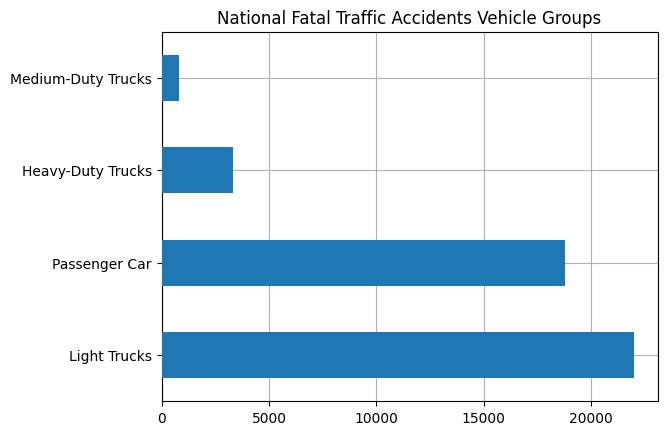

In [30]:
ax = farsVehVpicMergeDf["VehicleGroup"].value_counts().rename(vehicleGroupCat).plot.barh(title="National Fatal Traffic Accidents Vehicle Groups",zorder=3)
ax.grid(zorder=0)
farsVehVpicMergeDf["VehicleGroup"].value_counts().rename(vehicleGroupCat)

Light Trucks          529
Passenger Car         489
Heavy-Duty Trucks      80
Medium-Duty Trucks     17
Name: VehicleGroup, dtype: int64

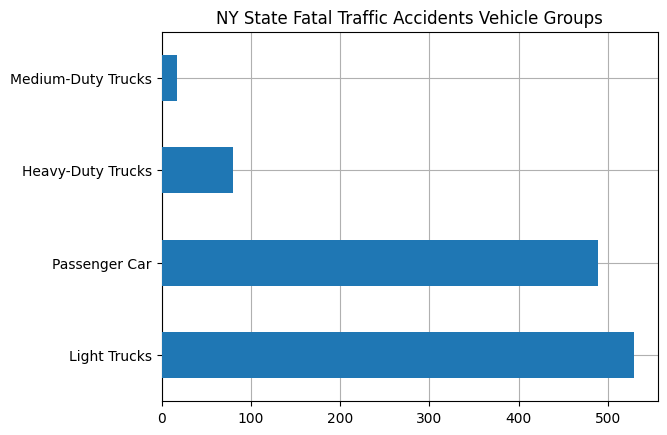

In [31]:
ax = farsVehVpicMergeDf[farsVehVpicMergeDf["STATE"]==36]["VehicleGroup"].value_counts().rename(vehicleGroupCat).plot.barh(title="NY State Fatal Traffic Accidents Vehicle Groups",zorder=3)
ax.grid(zorder=0)
farsVehVpicMergeDf[farsVehVpicMergeDf["STATE"]==36]["VehicleGroup"].value_counts().rename(vehicleGroupCat)

Light Trucks          6641135
Passenger Car         3576399
Medium-Duty Trucks     133028
Heavy-Duty Trucks      126918
Unknown                 56028
Large Trucks                2
Name: VehicleGroup, dtype: int64

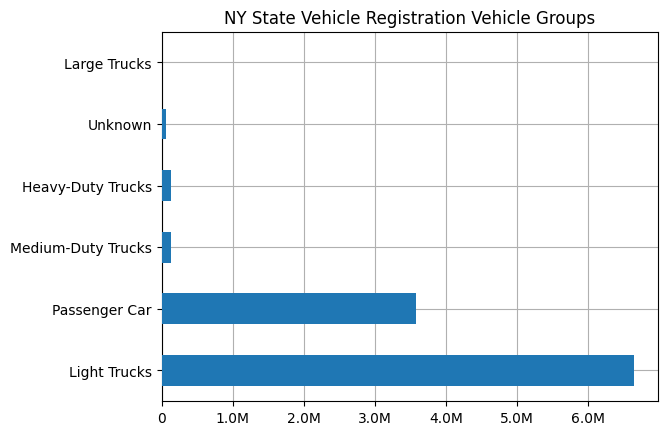

In [32]:
ax = nydmvVinDecodeDf["VehicleGroup"].value_counts().rename(vehicleGroupCat).plot.barh(title="NY State Vehicle Registration Vehicle Groups",zorder=3)
ax.xaxis.set_major_formatter(ticker.FuncFormatter(millions))
ax.grid(zorder=0)
nydmvVinDecodeDf["VehicleGroup"].value_counts().rename(vehicleGroupCat)

In [33]:
unknownGroupQty = (nydmvVinDecodeDf["VehicleGroup"]==99).sum()
print("NYSDMV vehicles witthout grouping = ",unknownGroupQty,"(",unknownGroupQty/nydmvNumVehicles*100,"%)")

NYSDMV vehicles witthout grouping =  56028 ( 0.5319024712560201 %)


In [34]:
print("Body Types for Vehicles with Unknown Groups")
print(nydmvVinDecodeDf[nydmvVinDecodeDf["VehicleGroup"]==99]["Body Type"].value_counts())
print()

Body Types for Vehicles with Unknown Groups
ATV     11183
P/SH     9032
MCY      5607
TRLR     5286
RBM      3363
        ...  
POLE        0
AMBU        0
DCOM        0
RPLC        0
LOCO        0
Name: Body Type, Length: 57, dtype: int64



Vehicles in Unknown Group Type failed VIN API query (invalid VIN)

Remove some unknown types

Body Code | Body Style Description
--- | ---
MCY | MOTORCYCLE
ATV | ALL TERRAIN VEHICLE
P/SH | POWER SHOVEL
TRLR | TRAILER
RBM | ROAD BUILDING MACHINE
LTRL | LIGHT TRAILER
TRAC | TRACTOR
RD/S | ROAD SWEEPER
H/WH | HOUSE ON WHEELS
BUS | BUS(OMNIBUS)
MOPD | MOPED
T/CR | TRACTOR CRANE
FIRE | FIRE TRUCK
EMVR | EARTH MOVER
S/SP | SAND OR AGRICULTRAL SPREADER/SPRAYER
LSV | LOW SPEED VEHICLE
W/DR | WELL DRILLER
LSVT | LOW SPEED VEHICLE - TRUCK
W/SR | WELL SERVICING RIG
H/TR | HOUSE TRAILER
REFG | REFRIGERATOR TRAILER
FPM | FEED PROCESSING MACHINE
MCC | MOBILE CAR CRUSHER


In [35]:
# remove some of the non-applicable unknown types

nydmvIndRemoveIdx = nydmvVinDecodeDf[(nydmvVinDecodeDf["VehicleGroup"]==99) & 
    nydmvVinDecodeDf["Body Type"].isin(["MCY","ATV","P/SH","TRLR","RBM","LTRL","TRAC","RD/S","H/WH","BUS","MOPD","T/CR","FIRE","EMVR","S/SP","LSV","W/DR","LSVT","W/SR","H/TR","REFG","FPM","MCC"]
        )].index

print("Total to remove: ",len(nydmvIndRemoveIdx))


Total to remove:  42214


In [36]:
# remove selected body tyopes
nydmvVinDecodeDf.drop(index=nydmvIndRemoveIdx,inplace=True)

In [37]:
print("Body Types for Vehicles with Unknown Groups")
print(nydmvVinDecodeDf[nydmvVinDecodeDf["VehicleGroup"]==99]["Body Type"].value_counts())
print()
unknownGroupQty = (nydmvVinDecodeDf["VehicleGroup"]==99).sum()
print("NYSDMS vehicles witthout grouping = ",unknownGroupQty,"(",unknownGroupQty/nydmvNumVehicles*100,"%)")

Body Types for Vehicles with Unknown Groups
SUBN    3058
2DSD    2566
4DSD    1909
CONV    1318
SEMI     684
        ... 
MCC        0
MCY        0
P/SH       0
POLE       0
W/SR       0
Name: Body Type, Length: 57, dtype: int64

NYSDMS vehicles witthout grouping =  13814 ( 0.13114337006372995 %)


In [38]:
print("Body Types for Vehicles with Unknown Groups")
print(nydmvVinDecodeDf[nydmvVinDecodeDf["VehicleGroup"]==99]["Body Type"].value_counts())
print()

Body Types for Vehicles with Unknown Groups
SUBN    3058
2DSD    2566
4DSD    1909
CONV    1318
SEMI     684
        ... 
MCC        0
MCY        0
P/SH       0
POLE       0
W/SR       0
Name: Body Type, Length: 57, dtype: int64



In [39]:
unknownGroupQty = (nydmvVinDecodeDf["VehicleGroup"]==99).sum()
print("NYSDMS vehicles witthout grouping = ",unknownGroupQty,"(",unknownGroupQty/nydmvNumVehicles*100,"%)")
nydmvVinDecodeDf["VehicleGroup"].value_counts().rename(vehicleGroupCat)

NYSDMS vehicles witthout grouping =  13814 ( 0.13114337006372995 %)


Light Trucks          6641135
Passenger Car         3576399
Medium-Duty Trucks     133028
Heavy-Duty Trucks      126918
Unknown                 13814
Large Trucks                2
Name: VehicleGroup, dtype: int64

In [40]:
print("Unknown passenger veh          = ",len(nydmvVinDecodeDf[(nydmvVinDecodeDf["VehicleGroup"]==99) & nydmvVinDecodeDf["Body Type"].isin(["2DSD","4DSD","CONV","SEDN"])]))
print("Unknown passenger light trucks = ",len(nydmvVinDecodeDf[(nydmvVinDecodeDf["VehicleGroup"]==99) & nydmvVinDecodeDf["Body Type"].isin(["UTIL","SUBN","VAN"])]))

Unknown passenger veh          =  5846
Unknown passenger light trucks =  3952


Given that the unknown vehciles without VIN decode would fall under either Passenger Car or Large Truck, and they're < 0.13% of registrations they will be removed

In [41]:
# remove unknown vehicle groups and 
nydmvVinDecodeDf = nydmvVinDecodeDf[~nydmvVinDecodeDf["VehicleGroup"].isin([99,6])]

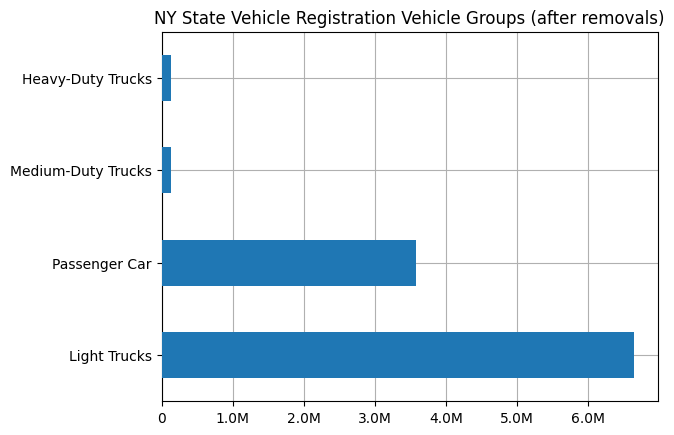

In [42]:
ax = nydmvVinDecodeDf["VehicleGroup"].value_counts().rename(vehicleGroupCat).plot.barh(title="NY State Vehicle Registration Vehicle Groups (after removals)",zorder=3)
ax.xaxis.set_major_formatter(ticker.FuncFormatter(millions))
ax.grid(zorder=0)

In [43]:
# remove NAs
print((nydmvVinDecodeDf["ModelID"].isna()).sum()/len(nydmvVinDecodeDf)*100,"% of records removed from NYSDMV registration due to missing ModelId")
nydmvVinDecodeDf.dropna(subset=["ModelID"],inplace=True)
nydmvVinDecodeDf["ModelID"] = nydmvVinDecodeDf["ModelID"].astype("int64")
print("Remaining records = ",len(nydmvVinDecodeDf))

0.009105242863742044 % of records removed from NYSDMV registration due to missing ModelId
Remaining records =  10476526


## Update Safety Feature Indicators

Present safety Features as Boolean Columns (True/False) as follows:

| Original Feature Name | Boolean Feature Name | True Mapping[^1] 
| --- | --- | --- |
AdaptiveCruiseControlId | AdaptiveCruiseControl | 1:'Standard'
AdaptiveDrivingBeamId | AdaptiveDrivingBeam | 1:'Standard'
AntilockBrakeSystemId | AntilockBrakeSystem | 1:'Standard'
AutoPedestrianAlertingSoundId | AutoPedestrianAlertingSound | 1:'Standard'
BackupCameraId | BackupCamera |  1:'Standard'
BlindSpotInterventionId | BlindSpotIntervention | 1:'Standard'
BlindSpotWarningId | BlindSpotWarning | 1:'Standard'
CrashImminentBrakingID | CrashImminentBraking | 1:'Standard'
DaytimeRunningLightId | DaytimeRunningLight | 1:'Standard'
DynamicBrakeSupportId | DynamicBrakeSupport | 1:'Standard'
ElectronicStabilityControlId | ElectronicStabilityControl | 1:'Standard'
ForwardCollisionWarningId | ForwardCollisionWarning | 1:'Standard'
LaneCenteringAssistanceId | LaneCenteringAssistance | 1:'Standard'
LaneDepartureWarningId | LaneDepartureWarning |  1:'Standard'
LaneKeepingAssistanceId | LaneKeepingAssistance | 1:'Standard'
ParkAssistId | ParkAssist |  1:'Standard'
PedestrianAutoEmergencyBrakingId | PedestrianAutoEmergencyBraking | 1:'Standard'
RearAutomaticEmergencyBrakingId | RearAutomaticEmergencyBraking |  1:'Standard'
RearCrossTrafficAlertId | RearCrossTrafficAlert |  1:'Standard'
SemiAutoHeadlampBeamSwitchingId | SemiAutoHeadlampBeamSwitching | 1:'Standard'
TPMSId | TPMS | 1:'Direct', 2:'Indirect'
TractionControlId | TractionControl |  1:'Standard'

[^1]: Features marked as optional are assumed not present, NA are taken to mean feature not present

In [44]:
safetyColMap = {
    'AntilockBrakeSystemId' : 'AntilockBrakeSystem',
    'AdaptiveCruiseControlId' : 'AdaptiveCruiseControl',
    'AdaptiveDrivingBeamId' : 'AdaptiveDrivingBeam',
    'AutoPedestrianAlertingSoundId' : 'AutoPedestrianAlertingSound',
    'BlindSpotInterventionId' : 'BlindSpotIntervention',
    'BlindSpotWarningId' : 'BlindSpotWarning',
    'CrashImminentBrakingID' : 'CrashImminentBraking',
    'DaytimeRunningLightId' : 'DaytimeRunningLight',
    'DynamicBrakeSupportId' : 'DynamicBrakeSupport',
    'ElectronicStabilityControlId' : 'ElectronicStabilityControl',
    'ForwardCollisionWarningId' : 'ForwardCollisionWarning',
    'LaneCenteringAssistanceId' : 'LaneCenteringAssistance',
    'LaneDepartureWarningId' : 'LaneDepartureWarning',
    'LaneKeepingAssistanceId' : 'LaneKeepingAssistance',
    'ParkAssistId' : 'ParkAssist',
    'PedestrianAutoEmergencyBrakingId' : 'PedestrianAutoEmergencyBraking',
    'RearAutomaticEmergencyBrakingId' : 'RearAutomaticEmergencyBraking',
    'RearCrossTrafficAlertId' : 'RearCrossTrafficAlert',
    'SemiAutoHeadlampBeamSwitchingId' : 'SemiAutoHeadlampBeamSwitching',
    'TPMSId' : 'TPMS',
    'TractionControlId' : 'TractionControl',
}

def mapSafetyMostToFlag(x):
    if x == 1:
        return True
    return False

def mapSafetyTPMSToFlag(x):
    if x==1 or x==2:
        return True
    return False


In [45]:
# update Safety Features for Fars
for col in safetyColMap.keys():
    # new column name
    newCol = safetyColMap[col]
    if col == "TPMSId":
        farsVehVpicMergeDf[newCol] = farsVehVpicMergeDf[col].map(mapSafetyTPMSToFlag)
    else:
        farsVehVpicMergeDf[newCol] = farsVehVpicMergeDf[col].map(mapSafetyMostToFlag)

farsVehVpicMergeDf.drop(columns=safetyColMap.keys(),inplace=True)

farsVehVpicMergeDf.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44922 entries, 0 to 51434
Data columns (total 78 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   ST_CASE                         44922 non-null  int64  
 1   VEH_NO                          44922 non-null  int64  
 2   NUMOCCS                         44922 non-null  int64  
 3   MAKE                            44922 non-null  int64  
 4   MAK_MOD                         44922 non-null  int64  
 5   BODY_TYP                        44922 non-null  int64  
 6   MOD_YEAR                        44922 non-null  int64  
 7   VIN                             44922 non-null  object 
 8   TOW_VEH                         44922 non-null  int64  
 9   TRAV_SP                         44922 non-null  int64  
 10  ROLLOVER                        44922 non-null  int64  
 11  IMPACT1                         44922 non-null  int64  
 12  M_HARM                          

In [46]:
farsVehVpicMergeDf[safetyColMap.values()].sum()

AntilockBrakeSystem                6399
AdaptiveCruiseControl              1061
AdaptiveDrivingBeam                1098
AutoPedestrianAlertingSound         179
BlindSpotIntervention                 0
BlindSpotWarning                   1154
CrashImminentBraking               1647
DaytimeRunningLight                4345
DynamicBrakeSupport                4858
ElectronicStabilityControl         5311
ForwardCollisionWarning            1699
LaneCenteringAssistance               5
LaneDepartureWarning               1420
LaneKeepingAssistance              1244
ParkAssist                          191
PedestrianAutoEmergencyBraking      968
RearAutomaticEmergencyBraking         0
RearCrossTrafficAlert               135
SemiAutoHeadlampBeamSwitching      4511
TPMS                              19521
TractionControl                    5096
dtype: int64

In [47]:
# update Safety Features for Fars
for col in safetyColMap.keys():
    # new column name
    newCol = safetyColMap[col]
    if col == "TPMSId":
        nydmvVinDecodeDf[newCol] = nydmvVinDecodeDf[col].map(mapSafetyTPMSToFlag)
    else:
        nydmvVinDecodeDf[newCol] = nydmvVinDecodeDf[col].map(mapSafetyMostToFlag)

nydmvVinDecodeDf.drop(columns=safetyColMap.keys(),inplace=True)

nydmvVinDecodeDf.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10476526 entries, 7306 to 12396967
Data columns (total 58 columns):
 #   Column                          Non-Null Count     Dtype         
---  ------                          --------------     -----         
 0   VIN                             10476526 non-null  object        
 1   Registration Class              10476526 non-null  category      
 2   City                            10476526 non-null  object        
 3   State                           10476526 non-null  category      
 4   Zip                             10476526 non-null  category      
 5   County                          10476526 non-null  object        
 6   Model Year                      10476526 non-null  Int64         
 7   Make                            10476526 non-null  category      
 8   Body Type                       10476526 non-null  category      
 9   Fuel Type                       10476526 non-null  category      
 10  Unladen Weight           

In [48]:
nydmvVinDecodeDf[safetyColMap.values()].sum()

AntilockBrakeSystem               3966836
AdaptiveCruiseControl             1372224
AdaptiveDrivingBeam                897612
AutoPedestrianAlertingSound        190366
BlindSpotIntervention              110699
BlindSpotWarning                  1581518
CrashImminentBraking              1742612
DaytimeRunningLight               3410742
DynamicBrakeSupport               3040208
ElectronicStabilityControl        3672551
ForwardCollisionWarning           2081613
LaneCenteringAssistance            337621
LaneDepartureWarning              1893497
LaneKeepingAssistance             1658239
ParkAssist                         317136
PedestrianAutoEmergencyBraking    1209819
RearAutomaticEmergencyBraking      122882
RearCrossTrafficAlert              733509
SemiAutoHeadlampBeamSwitching     3307500
TPMS                              7803073
TractionControl                   3544278
dtype: int64

## Merge FARS Vehicle and Accident Tables

In [49]:
# merge fars accident with fars vehicle

farsAccVehMerge = pd.merge(farsAccidentDf,farsVehVpicMergeDf.drop(columns="STATE"), on="ST_CASE", how="right",validate="one_to_many")
farsAccVehMerge = pd.merge(farsAccVehMerge,farsPersonDf,on=["ST_CASE","VEH_NO"],how="left")
farsAccVehMerge.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44922 entries, 0 to 44921
Columns: 102 entries, STATE to AGE
dtypes: bool(23), float64(11), int64(61), object(7)
memory usage: 28.4+ MB


In [50]:
# accidents that involve vehicles of interest are kept
print(len(farsAccidentDf),len(farsAccVehMerge["ST_CASE"].unique()), len(farsVehVpicMergeDf),len(farsAccVehMerge[["VEH_NO","ST_CASE"]].drop_duplicates()))

34119 31186 44922 44922


## Tag Vehicles in FARS as per induced exposure model

Following Induced Exposure Model Approach from [1]: *"...the set of comparison crashes was defined to be all multivehicle crashes where the focus vehicle was impacted from the rear or to either side. Risk was assessed to be the odds of all other crash types (frontal impact multivehicle crashes or single-vehicle crashes) compared to the comparison crashes."* and similarly in [2] "the vehicles/drivers involved in ... crashes can be split into striking group and struck group respectively. This analysis method is based on Quasi-induced exposure concept. Here, the striking vehicles/drivers can be considered as the at-fault ones and the struck vehicles/drivers are not-at-fault ones."

The IMPACT1 variable indicates where impact ocurred

![IMPACT1](FARS-AREAOFIMPACT.jpg)

Front = 1,11,12

[1] Michael D. Keall & Stuart Newstead (2016) Development of a method to rate the primary safety of vehicles using linked New Zealand crash and vehicle licensing data, Traffic Injury Prevention, 17:2, 151-158, DOI: 10.1080/15389588.2015.1045064

[2] Xuedong Yan & Essam Radwan (2006) Analyses of Rear-End Crashes Based on Classification Tree Models, Traffic Injury Prevention, 7:3, 276-282, DOI: 10.1080/15389580600660062

In [51]:
farsAccVehMerge["IMPACT1"].value_counts().sort_index().rename(farsCategories["IMPACT1"])

Non-Collision                             1910
1 Clock Point                             1784
2 Clock Point                              554
3 Clock Point                             1626
4 Clock Point                              309
5 Clock Point                              381
6 Clock Point                             2884
7 Clock Point                              459
8 Clock Point                              343
9 Clock Point                             1909
10 Clock Point                             636
11 Clock Point                            1949
12 Clock Point                           25203
Top                                        115
Undercarriage                              458
Cargo/Vehicle Parts Set-In-Motion           21
Other Objects or Person Set-In-Motion       15
Left                                       718
Left-Front Side                            581
Left-Back Side                             239
Right                                      566
Right-Front S

In [52]:
# Find comparison crashes (i.e. vehicle not at fault) 
print("Multivehicle Crashes                  =",(farsAccVehMerge["VE_TOTAL"] > 1).sum())
print("Vehicles impacted to the side or rear =",(~farsAccVehMerge["IMPACT1"].isin([1,12,11])).sum())
print("Comparison crashes                    =",((farsAccVehMerge["VE_TOTAL"] > 1) & ~farsAccVehMerge["IMPACT1"].isin([1,11,12])).sum())

Multivehicle Crashes                  = 29065
Vehicles impacted to the side or rear = 15986
Comparison crashes                    = 10803


In [53]:
# remove unknown and not reported
print("Removing ",farsAccVehMerge["IMPACT1"].isin([98,99]).sum()," records ")
farsAccVehMerge = farsAccVehMerge[~farsAccVehMerge["IMPACT1"].isin([98,99])]

Removing  1582  records 


In [54]:
# Find comparison crashes (i.e. vehicle not at fault) 
print("Multivehicle Crashes                  =",(farsAccVehMerge["VE_TOTAL"] > 1).sum())
print("Vehicles impacted to the side or rear =",(~farsAccVehMerge["IMPACT1"].isin([1,12,11])).sum())
print("Comparison crashes                    =",((farsAccVehMerge["VE_TOTAL"] > 1) & ~farsAccVehMerge["IMPACT1"].isin([1,11,12])).sum())

Multivehicle Crashes                  = 28585
Vehicles impacted to the side or rear = 14404
Comparison crashes                    = 10323


In [55]:
# Mark vehicles as Fault = False, for comparison crashes (exposure)
# Mark vehicles as Fault = True, for where vehicle is potentially the cause of the accident
farsAccVehMerge["Fault"] = ~((farsAccVehMerge["VE_TOTAL"] > 1) & ~farsAccVehMerge["IMPACT1"].isin([1,11,12]))
# check fault tag counts
farsAccVehMerge["Fault"].value_counts()

True     33017
False    10323
Name: Fault, dtype: int64

Text(0, 0.5, 'Number of Fatal Accidents')

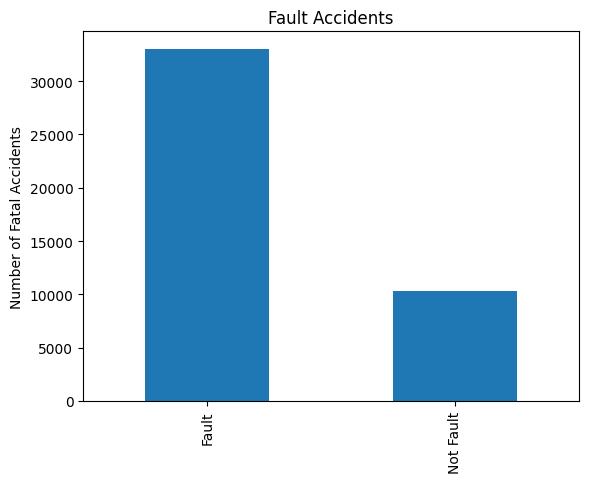

In [232]:
ax = farsAccVehMerge["Fault"].value_counts().rename(index={True:"Fault",False:"Not Fault"}).plot.bar(title="Fault Accidents")
ax.set_ylabel("Number of Fatal Accidents")

Note see below, not able to differentiate between the 2 vehicles in teh crash so Fault will be remain as is for muti-fault crashes as it indicates exposure for both vehicles wiht the availabel information

In [56]:
def combine_values_asstr(xval):
    s = ""
    for x in xval:
        s = s + str(x) + ","
    return s
# find number of accidents with double faults
farsFaultsPerAcc = farsAccVehMerge[["ST_CASE","Fault"]].groupby("ST_CASE").sum()
mutiFaultCases = farsFaultsPerAcc[farsFaultsPerAcc["Fault"] > 1].index.values
print("Accidents with mutilple Veh as Fault = ",len(mutiFaultCases))
farsAccVehMutilFault =  farsAccVehMerge[farsAccVehMerge["ST_CASE"].isin(mutiFaultCases)][["ST_CASE","M_HARM_SIMP"]].groupby("ST_CASE").agg(combine_values_asstr)
print(farsAccVehMutilFault.value_counts())

Accidents with mutilple Veh as Fault =  4845
M_HARM_SIMP   
5,5,              3273
5,5,5,             735
5,5,5,5,           171
12,12,              89
14,5,               50
                  ... 
5,5,3,5,5,5,5,       1
5,5,3,5,             1
14,6,6,              1
14,8,                1
9,9,                 1
Length: 126, dtype: int64


## Additional prep work on FARS Accident / FARS Vehicle / FARS VPICdecode

In [57]:
# check missing model id
farsAccVehMerge[farsAccVehMerge["ModelId"].isna()]

,STATE,ST_CASE,VE_TOTAL,VE_FORMS,PVH_INVL,PEDS,PERSONS,PERMVIT,PERNOTMVIT,DAY,MONTH,YEAR,DAY_WEEK,HOUR,MINUTE,ROUTE,RUR_URB,FUNC_SYS,HARM_EV,MAN_COLL,LGT_COND,WEATHER,FATALS,HARM_EV_SIMP,VEH_NO,NUMOCCS,MAKE,MAK_MOD,BODY_TYP,MOD_YEAR,VIN,TOW_VEH,TRAV_SP,ROLLOVER,IMPACT1,M_HARM,DR_PRES,L_STATUS,L_TYPE,PREV_ACC,PREV_DWI,PREV_SPD,PREV_OTH,SPEEDREL,VNUM_LAN,VSPD_LIM,VSURCOND,P_CRASH2,ACC_TYPE,DEATHS,DR_DRINK,VPICMAKE,VPICMODEL,VPICBODYCLASS,GVWR_FROM,GVWR_TO,M_HARM_SIMP,VehicleDescriptor,VINDecodeError,VehicleTypeId,ManufacturerFullNameId,MakeId,ModelId,ModelYear,Series,Trim,Series2,Trim2,BodyClassId,DoorsCount,GrossVehicleWeightRatingFromId,GrossVehicleWeightRatingToId,SeatsCount,EngineCylindersCount,BackupCameraId,HeadlampLightSourceId,AnySafetyFeature,GoodVPICDecode,VehicleGroup,AntilockBrakeSystem,AdaptiveCruiseControl,AdaptiveDrivingBeam,AutoPedestrianAlertingSound,BlindSpotIntervention,BlindSpotWarning,CrashImminentBraking,DaytimeRunningLight,DynamicBrakeSupport,ElectronicStabilityControl,ForwardCollisionWarning,LaneCenteringAssistance,LaneDepartureWarning,LaneKeepingAssistance,ParkAssist,PedestrianAutoEmergencyBraking,RearAutomaticEmergencyBraking,RearCrossTrafficAlert,SemiAutoHeadlampBeamSwitching,TPMS,TractionControl,SEX,AGE,Fault
15876,17,170857,2,2,0,0,3,3,0,25,9,2020,6,13,35,2,2,3,12,11,1,1,2,5,1,1,86,86898,63,1994,1M2AM32C7RM0,1,998,0,8,12,1,9,9,99,99,99,99,0,2,55,1,98,98,0,0,490,99999,11,18,18,5,1M2AM32C*RM******,0,10,1027,490,NaN,1994,NaN,RB688S,NaN,NaN,11.0,NaN,9.0,NaN,NaN,NaN,NaN,NaN,False,True,8,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,1.0,69.0,False


In [58]:
# fix the one :-)
farsAccVehMerge.at[15876,"ModelId"] = farsAccVehMerge[(farsAccVehMerge["MakeId"] == 490) & (farsAccVehMerge["VehicleGroup"] == 8)]["ModelId"].value_counts().index[0]
farsAccVehMerge["ModelId"] = farsAccVehMerge["ModelId"].astype("int64")

In [59]:
# Missing age record
(farsAccVehMerge["AGE"] >= 998).sum()/len(farsAccVehMerge["AGE"])*100

0.6206737425011537

In [60]:
farsAccVehMerge[farsAccVehMerge["AGE"] < 998]["AGE"].describe()

count    42829.000000
mean        42.484835
std         18.233661
min          2.000000
25%         27.000000
50%         39.000000
75%         56.000000
max        102.000000
Name: AGE, dtype: float64

In [61]:
farsAccVehMerge["AGE"].isna().sum()

242

In [62]:
# impute age as median for 998, 999 (unknown, unfiled)
ageMedian = farsAccVehMerge[farsAccVehMerge["AGE"] < 998]["AGE"].median()
farsAccVehMerge["AGE"] = farsAccVehMerge["AGE"].replace([998,999],ageMedian).fillna(ageMedian).astype("int64")

In [63]:
# check out suspicious driver ages... leave or keep? will keep for now since we'll be using age group instead of actual age
farsAccVehMerge[farsAccVehMerge["AGE"] < 10]

,STATE,ST_CASE,VE_TOTAL,VE_FORMS,PVH_INVL,PEDS,PERSONS,PERMVIT,PERNOTMVIT,DAY,MONTH,YEAR,DAY_WEEK,HOUR,MINUTE,ROUTE,RUR_URB,FUNC_SYS,HARM_EV,MAN_COLL,LGT_COND,WEATHER,FATALS,HARM_EV_SIMP,VEH_NO,NUMOCCS,MAKE,MAK_MOD,BODY_TYP,MOD_YEAR,VIN,TOW_VEH,TRAV_SP,ROLLOVER,IMPACT1,M_HARM,DR_PRES,L_STATUS,L_TYPE,PREV_ACC,PREV_DWI,PREV_SPD,PREV_OTH,SPEEDREL,VNUM_LAN,VSPD_LIM,VSURCOND,P_CRASH2,ACC_TYPE,DEATHS,DR_DRINK,VPICMAKE,VPICMODEL,VPICBODYCLASS,GVWR_FROM,GVWR_TO,M_HARM_SIMP,VehicleDescriptor,VINDecodeError,VehicleTypeId,ManufacturerFullNameId,MakeId,ModelId,ModelYear,Series,Trim,Series2,Trim2,BodyClassId,DoorsCount,GrossVehicleWeightRatingFromId,GrossVehicleWeightRatingToId,SeatsCount,EngineCylindersCount,BackupCameraId,HeadlampLightSourceId,AnySafetyFeature,GoodVPICDecode,VehicleGroup,AntilockBrakeSystem,AdaptiveCruiseControl,AdaptiveDrivingBeam,AutoPedestrianAlertingSound,BlindSpotIntervention,BlindSpotWarning,CrashImminentBraking,DaytimeRunningLight,DynamicBrakeSupport,ElectronicStabilityControl,ForwardCollisionWarning,LaneCenteringAssistance,LaneDepartureWarning,LaneKeepingAssistance,ParkAssist,PedestrianAutoEmergencyBraking,RearAutomaticEmergencyBraking,RearCrossTrafficAlert,SemiAutoHeadlampBeamSwitching,TPMS,TractionControl,SEX,AGE,Fault
5013,6,61664,2,2,0,2,4,4,2,16,10,2020,6,19,35,6,1,4,8,0,2,1,1,12,2,2,20,20423,15,2014,1GNKRGKD6EJ1,0,0,0,3,12,0,7,6,998,998,998,998,8,2,55,1,98,98,0,0,467,1853,7,12,12,5,1GNKRGKD*EJ******,0,7,984,467,1853,2014,1LT,NaN,NaN,NaN,7.0,4.0,14.0,NaN,NaN,6.0,NaN,NaN,True,True,2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,2.0,4,False
13476,13,130779,2,2,0,0,4,4,0,25,7,2020,7,12,0,3,2,7,12,6,1,1,2,5,1,3,41,41047,4,1998,JM1TA2215W14,0,998,0,3,12,1,6,1,0,0,0,0,0,4,40,1,17,87,2,0,473,5470,13,11,11,5,JM1TA221*W1******,0,2,1041,473,5470,1998,Sedan,NaN,NaN,NaN,13.0,4.0,NaN,NaN,NaN,6.0,NaN,NaN,False,True,1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,2.0,4,False
19295,22,220221,1,1,0,2,1,1,2,16,5,2020,7,20,25,3,1,5,10,0,3,2,1,13,1,1,20,20401,14,1997,1GNCS18W5VK1,0,0,0,2,10,0,7,6,998,998,998,998,8,2,25,2,98,98,0,0,467,11502,7,11,11,13,1GNCS18W*VK******,0,7,984,467,11502,1997,1500 (1/2 ton),NaN,NaN,NaN,7.0,2.0,12.0,NaN,NaN,6.0,NaN,NaN,False,True,2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,1.0,2,True
24228,29,290274,1,1,0,0,2,2,0,29,5,2020,6,16,20,4,1,5,58,0,1,1,2,10,1,2,18,18022,4,2007,2G4WC5821712,0,35,1,14,1,0,7,6,998,998,998,998,8,2,45,1,13,4,2,0,468,1821,13,11,11,14,2G4WC582*71******,0,2,984,468,1821,2007,CX,NaN,NaN,NaN,13.0,4.0,NaN,NaN,NaN,6.0,NaN,NaN,False,True,1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,1.0,7,True
27959,36,360771,2,2,0,1,3,3,1,8,11,2020,1,18,55,3,2,2,8,0,2,10,1,12,1,2,37,37441,20,2012,5FNRL5H61CB0,0,0,0,11,12,0,7,6,998,998,998,998,8,2,55,1,53,98,0,0,474,1869,2,12,12,5,5FNRL5H6*CB******,0,7,988,474,1869,2012,EXL/EXL-NAVI/EXL-RES,NaN,Wagon body style,NaN,2.0,5.0,14.0,NaN,NaN,6.0,NaN,NaN,True,True,2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,2.0,9,True
38260,48,480896,5,4,1,3,4,4,3,10,4,2020,6,1,36,1,2,1,12,6,3,10,2,5,4,2,13,13421,15,1998,5LMPU28L3WLJ,0,0,0,6,12,0,7,6,998,998,998,998,8,6,65,1,60,98,0,0,464,1814,7,12,12,5,5LMPU28L*WL******,0,7,976,464,1814,1998,Base,NaN,NaN,NaN,7.0,4.0,15.0,NaN,NaN,8.0,NaN,NaN,False,True,2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,2.0,3,False
38611,48,481178,2,2,0,0,3,3,0,24,5,2020,1,4,58,1,2,1,12,1,2,10,2,5,1,2,24,24010,6,2008,5GZER23768J1,0,0,0,6,12,0,7,6,998,998,998,998,8,2,75,1,98,32,2,0,1056,4596,7,12,12,5,5GZER237*8J******,0,7,984,1056,4596,2008,1/2 ton,XR,NaN,NaN,7.0,4

In [64]:
# create age group ranges, and add a numeric variable representing this age to simplify correlation calculations
farsAccVehMerge["AGE_GRPNAME"] = pd.cut(farsAccVehMerge["AGE"],[0,14,24,34,44,54,64,200],labels=["<15","15-24","25-34","35-44","45-54","55-64",">65"])
farsAccVehMerge["AGE_GRP"] = pd.factorize(farsAccVehMerge["AGE_GRPNAME"])[0]
# create speed limit ranges, and add a numeric variable representing this age to simplify correlation calculations
print(farsAccVehMerge["AGE_GRPNAME"].value_counts(dropna=False)/len(farsAccVehMerge))
farsCategories["AGE_GRP"] = dict(np.array(farsAccVehMerge[["AGE_GRP","AGE_GRPNAME"]].drop_duplicates()))
farsAccVehMerge.drop(columns="AGE_GRPNAME",inplace=True)

25-34    0.223004
15-24    0.184610
35-44    0.180018
45-54    0.141924
>65      0.136940
55-64    0.132464
<15      0.001038
Name: AGE_GRPNAME, dtype: float64


In [65]:
# inpute SEX to 9 -> Female, Nan and 8 -> Male to maintain 70:30 proportion
farsAccVehMerge["SEX"] = farsAccVehMerge["SEX"].replace(9,2).replace(8,1).fillna(1).astype("int64")

In [66]:
farsAccVehMerge["SEX"].value_counts(dropna=False)/len(farsAccVehMerge)

1    0.716728
2    0.283272
Name: SEX, dtype: float64

In [67]:
# add column indicating if the accident impacted pedestrians
farsAccVehMerge["Pedestrian"] = farsAccVehMerge["PEDS"] > 0
# add column indicating is the vehicle had any safey feature
farsAccVehMerge["AnySafetyFeature"] = farsAccVehMerge[safetyColMap.values()].apply(lambda row: sum(row) > 0,axis=1)

In [68]:
# set speed limit for cases missing it (speed limit = 98 and 99 means missing values)
print(farsAccVehMerge["VSPD_LIM"].value_counts(dropna=False).sort_index()/len(farsAccVehMerge))
wAvgSpd = farsAccVehMerge[farsAccVehMerge["VSPD_LIM"]<98]["VSPD_LIM"].sum()/(farsAccVehMerge["VSPD_LIM"]<98).sum()
print("Median speed limit = ",farsAccVehMerge[farsAccVehMerge["VSPD_LIM"]<98]["VSPD_LIM"].median())
farsAccVehMerge["VSPD_LIM"] = farsAccVehMerge["VSPD_LIM"].replace([98,99],round(wAvgSpd/5)*5)
print(farsAccVehMerge["VSPD_LIM"].value_counts(dropna=False).sort_index()/len(farsAccVehMerge))


0     0.008976
5     0.000300
10    0.000554
15    0.001477
20    0.002238
25    0.040863
30    0.044209
35    0.101292
40    0.070235
45    0.158006
50    0.046262
55    0.256461
60    0.039986
65    0.094762
70    0.072473
75    0.021551
80    0.002884
85    0.000046
98    0.033272
99    0.004153
Name: VSPD_LIM, dtype: float64
Median speed limit =  55.0
0     0.008976
5     0.000300
10    0.000554
15    0.001477
20    0.002238
25    0.040863
30    0.044209
35    0.101292
40    0.070235
45    0.158006
50    0.083687
55    0.256461
60    0.039986
65    0.094762
70    0.072473
75    0.021551
80    0.002884
85    0.000046
Name: VSPD_LIM, dtype: float64


Reduce number of Speed Limit classes, but creating 4 groups
* < 20 Km/h
* 20-40
* 40-60
* 60-80
* \> 80 


In [69]:
# create speed limit ranges, and add a numeric variable representing this age to simplify correlation calculations
farsAccVehMerge["VSPD_LIM_GRPNAME"] = pd.cut(farsAccVehMerge["VSPD_LIM"],[0,20,40,60,80,200],labels=["<20","20-40","40-60","60-80",">80"],right=False)
farsAccVehMerge["VSPD_LIM_GRP"] = pd.factorize(farsAccVehMerge["VSPD_LIM_GRPNAME"])[0]
print(farsAccVehMerge["VSPD_LIM_GRPNAME"].value_counts(dropna=False).sort_index()/len(farsAccVehMerge))
farsCategories["VSPD_LIM_GRP"] = dict(np.array(farsAccVehMerge[["VSPD_LIM_GRP","VSPD_LIM_GRPNAME"]].drop_duplicates()))
farsAccVehMerge.drop(columns="VSPD_LIM_GRPNAME",inplace=True)

<20      0.011306
20-40    0.188602
40-60    0.568389
60-80    0.228772
>80      0.002930
Name: VSPD_LIM_GRPNAME, dtype: float64


In [70]:
# Check VNUM_LAN not reported or unknown
farsAccVehMerge["VNUM_LAN"].value_counts(dropna=False).sort_index()

0      350
1      586
2    26833
3     5762
4     4658
5     3553
6      803
7      496
8      290
9        9
Name: VNUM_LAN, dtype: int64

In [71]:
# drop unknown/unreported number of lanes (dropped only if in use)
#farsAccVehMerge = farsAccVehMerge[farsAccVehMerge["VNUM_LAN"]<8]

In [72]:
# Check FUNC_SYS not reported or unknown
farsAccVehMerge["FUNC_SYS"].value_counts(dropna=False).sort_index()

1      6221
2      1917
3     13811
4      9591
5      5904
6      1147
7      3890
96       48
98      771
99       40
Name: FUNC_SYS, dtype: int64

In [73]:
# no need to eliminate here, will be dropped on demand
#farsAccVehMerge = farsAccVehMerge[farsAccVehMerge["FUNC_SYS"]<96]

In [74]:
farsAccVehMerge.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43340 entries, 0 to 44921
Columns: 106 entries, STATE to VSPD_LIM_GRP
dtypes: bool(25), float64(8), int64(66), object(7)
memory usage: 29.2+ MB


In [75]:
# Check any safety features that may be removed form the checks
farsTotSafetyFeat = farsAccVehMerge[safetyColMap.values()].sum()
farsTotSafetyFeat

AntilockBrakeSystem                6213
AdaptiveCruiseControl              1030
AdaptiveDrivingBeam                1061
AutoPedestrianAlertingSound         173
BlindSpotIntervention                 0
BlindSpotWarning                   1116
CrashImminentBraking               1598
DaytimeRunningLight                4218
DynamicBrakeSupport                4718
ElectronicStabilityControl         5154
ForwardCollisionWarning            1649
LaneCenteringAssistance               4
LaneDepartureWarning               1376
LaneKeepingAssistance              1204
ParkAssist                          182
PedestrianAutoEmergencyBraking      940
RearAutomaticEmergencyBraking         0
RearCrossTrafficAlert               132
SemiAutoHeadlampBeamSwitching      4380
TPMS                              18862
TractionControl                    4949
dtype: int64

In [76]:
# remove features present in less than 100 vehicles
# RearCrossTrafficAlert and ParkAssist features removed due to the way Fault is being defined
safetFeatureList = list(farsTotSafetyFeat[farsTotSafetyFeat >= 100].drop(["RearCrossTrafficAlert","ParkAssist"]).index.values)
safetFeatureList

['AntilockBrakeSystem',
 'AdaptiveCruiseControl',
 'AdaptiveDrivingBeam',
 'AutoPedestrianAlertingSound',
 'BlindSpotWarning',
 'CrashImminentBraking',
 'DaytimeRunningLight',
 'DynamicBrakeSupport',
 'ElectronicStabilityControl',
 'ForwardCollisionWarning',
 'LaneDepartureWarning',
 'LaneKeepingAssistance',
 'PedestrianAutoEmergencyBraking',
 'SemiAutoHeadlampBeamSwitching',
 'TPMS',
 'TractionControl']

In [77]:
# Redefine AnySafetyFeature to only includ features above
def AnyStdSafetyFeature(Row):
	"""Returns true if any of the safety features are marked standard for the vehicle checked 
	(vpicdecode columnnames are used)attribute value = 1 means standard
	"""
	
	stdFeatureFlag = False
	for feat in safetFeatureList:
		stdFeatureFlag = stdFeatureFlag | (Row[feat] == 1)
	return stdFeatureFlag

farsAccVehMerge["AnySafetyFeature"] = farsAccVehMerge.apply(lambda row: AnyStdSafetyFeature(row),axis=1)

In [78]:
# check quantity of unknown license records as well as previous accidents/infractions
print("Total FARS records up to this point = ", len(farsAccVehMerge))
# Change license validy to 3 levels - Valid, Expired, Revoked/Suspected
print("Unknown lic status = ",(farsAccVehMerge["L_STATUS"] == 9).sum()) #/len(farsAccVehMerge)*100,"%")
print("Unknown lic type   = ",(farsAccVehMerge["L_TYPE"] == 9).sum()) # /len(farsAccVehMerge)*100,"%")
print("Unknown PREV_ACC   = ",(farsAccVehMerge["PREV_ACC"].isin([98,99])).sum()) # /len(farsAccVehMerge)*100,"%")
print("Unknown PREV_DWI   = ",(farsAccVehMerge["PREV_DWI"].isin([98,99])).sum()) # /len(farsAccVehMerge)*100,"%")
print("Unknown PREV_SPD   = ",(farsAccVehMerge["PREV_SPD"].isin([98,99])).sum()) # /len(farsAccVehMerge)*100,"%")
print("Unknown PREV_OTH   = ",(farsAccVehMerge["PREV_OTH"].isin([98,99])).sum()) # /len(farsAccVehMerge)*100,"%")

print("Combined lic Unknowns   = ",((farsAccVehMerge["L_STATUS"] == 9) | (farsAccVehMerge["L_TYPE"] == 9)).sum()) # /len(farsAccVehMerge)*100,"%")
print("Combined prev Unknowns  = ",(farsAccVehMerge["PREV_ACC"].isin([98,99]) | 
farsAccVehMerge["PREV_DWI"].isin([98,99]) | farsAccVehMerge["PREV_SPD"].isin([98,99]) | farsAccVehMerge["PREV_OTH"].isin([98,99])).sum()) # /len(farsAccVehMerge)*100,"%")
print("Combined Unknowns       = ",((farsAccVehMerge["L_STATUS"] == 9) | (farsAccVehMerge["L_TYPE"] == 9) | farsAccVehMerge["PREV_ACC"].isin([98,99]) | 
farsAccVehMerge["PREV_DWI"].isin([98,99]) | farsAccVehMerge["PREV_SPD"].isin([98,99]) | farsAccVehMerge["PREV_OTH"].isin([98,99])).sum()) # /len(farsAccVehMerge)*100,"%")

Total FARS records up to this point =  43340
Unknown lic status =  1281
Unknown lic type   =  1265
Unknown PREV_ACC   =  3653
Unknown PREV_DWI   =  1677
Unknown PREV_SPD   =  1675
Unknown PREV_OTH   =  1675
Combined lic Unknowns   =  1302
Combined prev Unknowns  =  3656
Combined Unknowns       =  3677


Will only remove records with unknownn license types as applicable but will leave in the overall record

In [79]:
print(farsAccVehMerge["PREV_ACC"].isin([98,99]).sum())
#print(farsAccVehMerge[farsAccVehMerge["PREV_OTH"].isin([98,99])][["PREV_ACC","PREV_DWI","PREV_SPD"]].value_counts())
print(farsAccVehMerge[farsAccVehMerge["PREV_ACC"].isin([98,99])][["PREV_DWI","PREV_SPD","PREV_OTH"]].value_counts())


3653
PREV_DWI  PREV_SPD  PREV_OTH
99        99        99          1674
0         0         0           1468
          1         0            186
          0         1             79
          2         0             36
1         0         0             35
0         1         1             30
          0         2             27
          3         0             22
          1         2             11
1         1         0             10
          0         1              7
0         2         1              6
          4         0              5
          2         2              4
2         0         0              4
0         1         3              4
          2         3              3
          0         3              3
1         1         3              3
0         3         2              3
          1         5              2
          4         1              2
          1         4              2
                    6              2
          0         4              2
    

In [174]:
# add attribute PREV_ACC_OR_INF - previous accident or infraction
def AddPrevAccOrInf(row):
    if max(row["PREV_ACC"],row["PREV_DWI"]) >= 98 or max(row["PREV_SPD"],row["PREV_OTH"]) >= 98:
        return 99
    else:
        return min(1,row["PREV_ACC"] + row["PREV_DWI"] + row["PREV_SPD"] + row["PREV_OTH"])

farsAccVehMerge["PREV_ACC_OR_INF"] = farsAccVehMerge.apply(lambda row: AddPrevAccOrInf(row),axis=1)

In [81]:
# recode model id creating new mapping to compress data for ML algorithms

print("Num values =",len(farsAccVehMerge["ModelId"].unique()),"min =",farsAccVehMerge["ModelId"].min(),"max=",farsAccVehMerge["ModelId"].max())
# create dict for mapping
modelIdRevMapping = {} # from mapped to original
modelIdFwdMapping = {} # from original to mapped
idx = 0
for modelId in np.sort(farsAccVehMerge["ModelId"].unique()):
    modelIdRevMapping[idx]=modelId
    modelIdFwdMapping[modelId]=idx
    idx = idx + 1
farsAccVehMerge["ModelIdMapped"] = farsAccVehMerge["ModelId"].map(modelIdFwdMapping)
farsTopModels["ModelIdMapped"] = farsTopModels["ModelId"].map(modelIdFwdMapping)
print("Mapped Num values =",len(farsAccVehMerge["ModelIdMapped"].unique()),"min =",farsAccVehMerge["ModelIdMapped"].min(),"max=",farsAccVehMerge["ModelIdMapped"].max())


Num values = 1030 min = 1684 max= 29124
Mapped Num values = 1030 min = 0 max= 1029


In [82]:
# map model year for training
print("Num values =",len(farsAccVehMerge["ModelYear"].unique()),"min =",farsAccVehMerge["ModelYear"].min(),"max=",farsAccVehMerge["ModelYear"].max())
farsAccVehMerge["ModelYearMapped"] = farsAccVehMerge["ModelYear"] - 1981
print("Num values =",len(farsAccVehMerge["ModelYearMapped"].unique()),"min =",farsAccVehMerge["ModelYearMapped"].min(),"max=",farsAccVehMerge["ModelYearMapped"].max())

Num values = 41 min = 1981 max= 2021
Num values = 41 min = 0 max= 40


## Features to Train Models

In [83]:
# Additional columns to keep for modeling 
columns2Keep = ['STATE', 'ST_CASE', 'VEH_NO', 'RUR_URB', 'FUNC_SYS', 'VNUM_LAN', 'LGT_COND', 'WEATHER', 
       'VSURCOND',  'DR_DRINK', # 'ACC_TYPE', 'IMPACT1', 'MAN_COLL', 'M_HARM_SIMP', 
       'L_STATUS', 'L_TYPE', 'PREV_ACC_OR_INF', 'PREV_ACC', 'PREV_DWI', 'PREV_SPD', 'PREV_OTH', 
       'VSPD_LIM_GRP', 'ModelId', 'ModelIdMapped', 'ModelYear', 'ModelYearMapped', #'Pedestrian',
       'VehicleGroup', 'AnySafetyFeature','SEX', 'AGE_GRP', 'Fault'] + safetFeatureList

In [175]:
farsAccVehMergeLight = farsAccVehMerge[columns2Keep].copy()
farsAccVehMergeLight.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43340 entries, 0 to 44921
Data columns (total 43 columns):
 #   Column                          Non-Null Count  Dtype
---  ------                          --------------  -----
 0   STATE                           43340 non-null  int64
 1   ST_CASE                         43340 non-null  int64
 2   VEH_NO                          43340 non-null  int64
 3   RUR_URB                         43340 non-null  int64
 4   FUNC_SYS                        43340 non-null  int64
 5   VNUM_LAN                        43340 non-null  int64
 6   LGT_COND                        43340 non-null  int64
 7   WEATHER                         43340 non-null  int64
 8   VSURCOND                        43340 non-null  int64
 9   DR_DRINK                        43340 non-null  int64
 10  L_STATUS                        43340 non-null  int64
 11  L_TYPE                          43340 non-null  int64
 12  PREV_ACC_OR_INF                 43340 non-null  int64
 13  P

In [176]:
# use this for most of the calculations
#farsAccVehMergeLighter = farsAccVehMergeLight.drop(columns=["STATE","ST_CASE","VEH_NO","HOUR","ModelId","ModelYear","AGE_GRP"]+list(safetyColMap.values()))
farsAccVehMergeLighter = farsAccVehMergeLight.drop(columns=["STATE","ST_CASE","VEH_NO"]+safetFeatureList)
corr1 = farsAccVehMergeLight.drop(columns=["STATE","ST_CASE","VEH_NO","ModelYear","ModelId"]+safetFeatureList).corr(method = "spearman")
corr1

,RUR_URB,FUNC_SYS,VNUM_LAN,LGT_COND,WEATHER,VSURCOND,DR_DRINK,L_STATUS,L_TYPE,PREV_ACC_OR_INF,PREV_ACC,PREV_DWI,PREV_SPD,PREV_OTH,VSPD_LIM_GRP,ModelIdMapped,ModelYearMapped,VehicleGroup,AnySafetyFeature,SEX,AGE_GRP,Fault
RUR_URB,1.000000,-0.148440,0.397130,0.182210,-0.056220,-0.053659,-0.043692,-0.000146,0.000175,-0.000165,0.012467,0.024270,0.004617,0.038305,0.013210,-0.005648,0.088260,-0.132917,0.140862,0.032210,-0.040229,-0.079426
FUNC_SYS,-0.148440,1.000000,-0.270948,-0.076101,-0.007878,-0.002901,0.087111,-0.053805,-0.015059,-0.033819,-0.023684,-0.000826,-0.034219,-0.022128,-0.342015,-0.045228,-0.113615,-0.053419,-0.032202,0.011664,-0.017136,0.131746
VNUM_LAN,0.397130,-0.270948,1.000000,0.139611,-0.035779,0.006201,-0.069328,0.003329,-0.006484,-0.006178,-0.002516,0.000109,-0.001298,0.006224,-0.018177,0.000570,0.088605,-0.058276,0.096608,0.019027,-0.024441,-0.074126
LGT_COND,0.182210,-0.076101,0.139611,1.000000,-0.008692,0.036651,0.169070,-0.055920,-0.020083,0.050529,0.026107,0.051015,0.052770,0.054125,0.034108,-0.008008,0.006525,-0.102323,0.047261,-0.043062,-0.111916,0.084195
WEATHER,-0.056220,-0.007878,-0.035779,-0.008692,1.000000,0.386457,-0.004825,0.006731,-0.002774,-0.022946,-0.037620,-0.016172,-0.003592,-0.004584,0.016924,0.010476,-0.013711,0.013638,-0.019646,-0.005999,0.009980,0.019906
VSURCOND,-0.053659,-0.002901,0.006201,0.036651,0.386457,1.000000,-0.003100,0.014139,0.009191,0.004577,-0.003686,0.002222,0.016352,0.011046,-0.048254,0.000901,-0.013264,0.007314,-0.025528,-0.019403,-0.008792,0.027484
DR_DRINK,-0.043692,0.087111,-0.069328,0.169070,-0.004825,-0.003100,1.000000,-0.148019,-0.071939,0.052106,0.002879,0.077246,0.032838,0.035557,-0.020220,-0.028785,-0.100741,-0.092666,-0.037183,-0.066698,-0.081666,0.143551
L_STATUS,-0.000146,-0.053805,0.003329,-0.055920,0.006731,0.014139,-0.148019,1.000000,0.675931,0.129179,0.182820,0.210745,0.201666,0.128964,0.000296,0.035858,0.134682,0.093360,0.055357,0.042824,0.083468,-0.070435
L_TYPE,0.000175,-0.015059,-0.006484,-0.020083,-0.002774,0.009191,-0.071939,0.675931,1.000000,0.199098,0.230274,0.345974,0.257758,0.228632,-0.004842,0.019722,0.045497,0.027112,0.019009,0.021614,-0.023414,-0.035008
PREV_ACC_OR_INF,-0.000165,-0.033819,-0.006178,0.050529,-0.022946,0.004577,0.052106,0.129179,0.199098,1.000000,0.727483,0.414192,0.591258,0.585081,0.029557,0.006912,-0.021894,-0.000698,-0.037156,-0.056900,-0.096439,0.040676


Text(0.5, 0, 'Correlation absolute value')

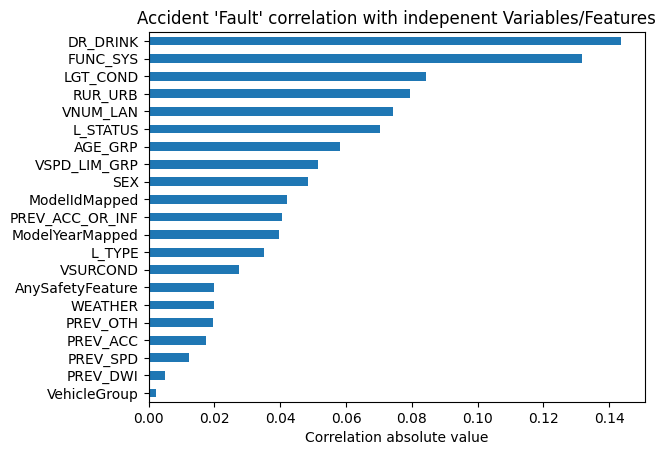

In [198]:
ax = corr1["Fault"].abs().sort_values(ascending=True).drop(index=["Fault"]).plot.barh()
ax.set_title("Accident 'Fault' correlation with indepenent Variables/Features")
ax.set_xlabel("Correlation absolute value")

Text(0.5, 1.0, 'FARS Attribute Correlation Matrix (AnySafetyFeture only)')

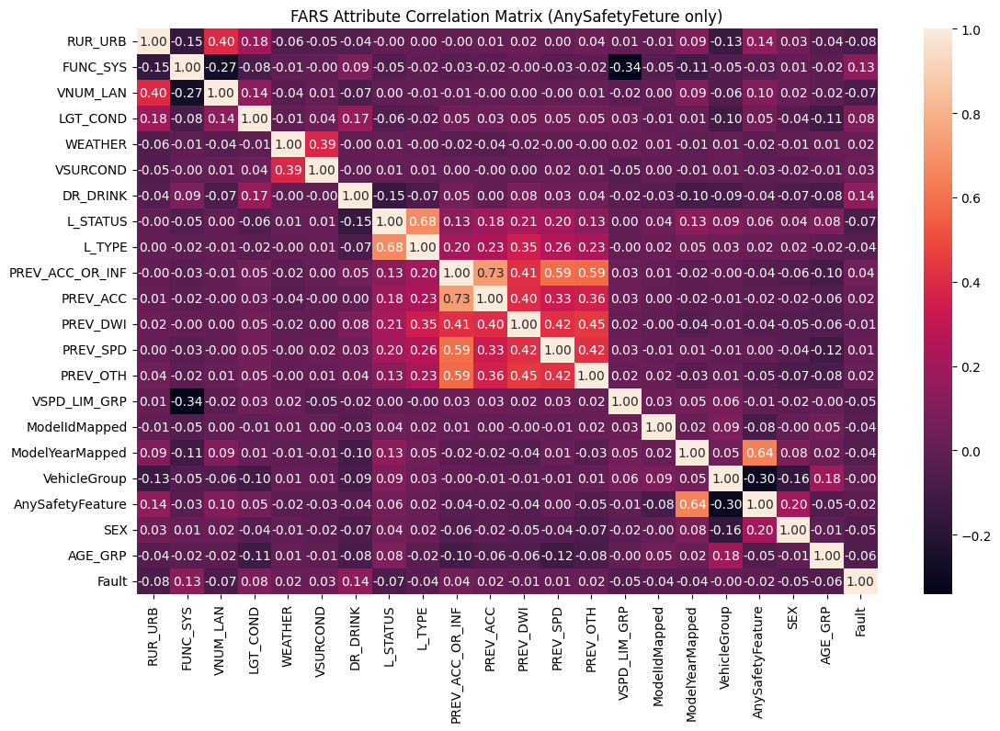

In [177]:
f, ax = plt.subplots(figsize=(13, 8))
sns.heatmap(corr1, annot=True, fmt=".2f", ax=ax )
ax.set_title("FARS Attribute Correlation Matrix (AnySafetyFeture only)")

Text(0.5, 1.0, 'FARS Attribute Correlation Matrix (ALL SafeyFeatures)')

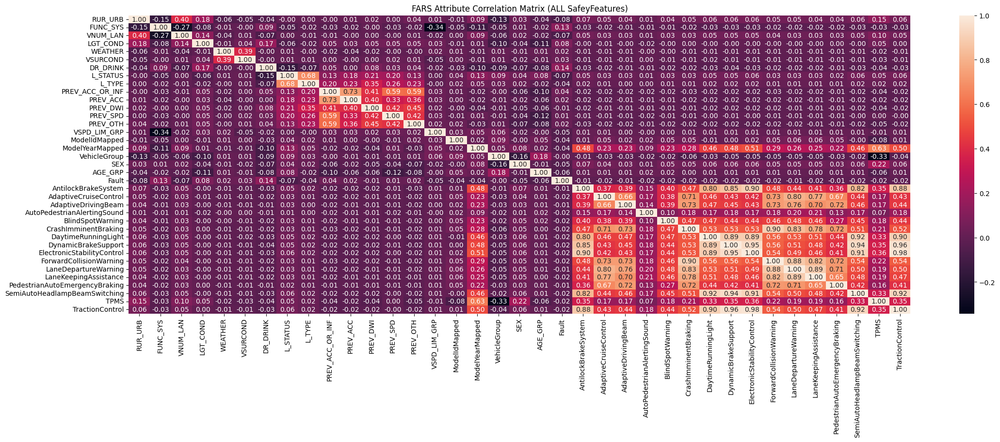

In [178]:
#farsAccVehMergeLighter = farsAccVehMergeLight.drop(columns=["STATE","ST_CASE","VEH_NO"]+safetFeatureList)
corr2 = farsAccVehMergeLight.drop(columns=["STATE","ST_CASE","VEH_NO","ModelYear","ModelId","AnySafetyFeature"]).corr(method = "spearman")
f, ax = plt.subplots(figsize=(26, 8))
sns.heatmap(corr2, annot=True, fmt=".2f", ax=ax)
ax.set_title("FARS Attribute Correlation Matrix (ALL SafeyFeatures)")

Text(0.5, 1.0, 'FARS Safety Feature Correlation Matrix and Model Year (ALL SafeyFeatures)')

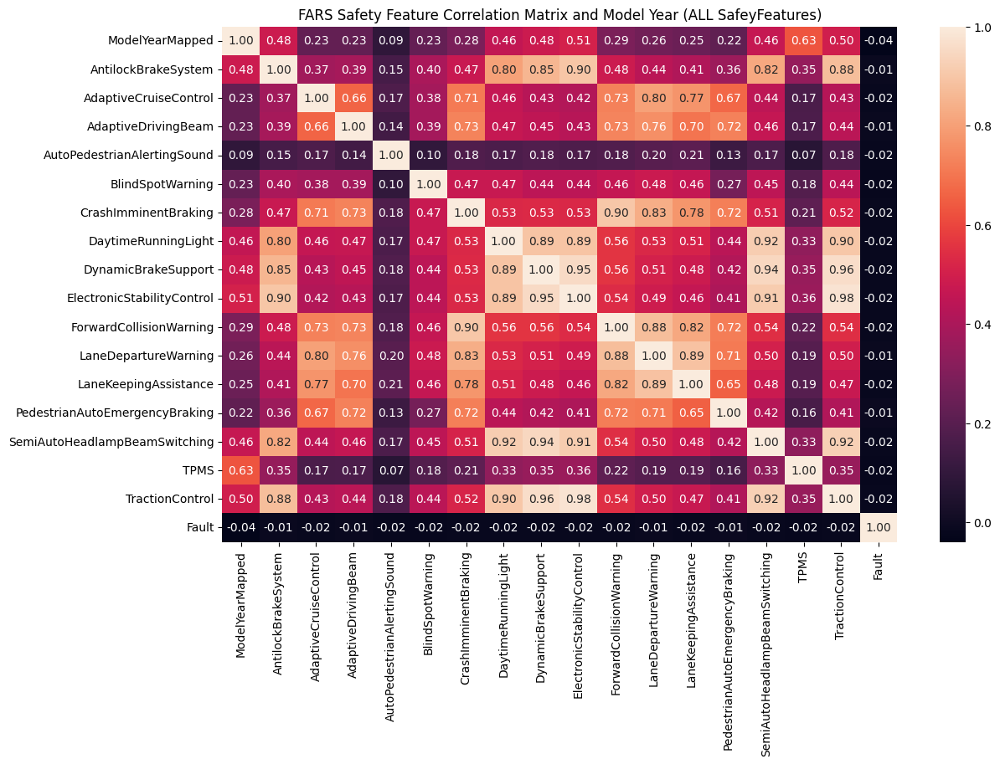

In [179]:
#farsAccVehMergeLighter = farsAccVehMergeLight.drop(columns=["STATE","ST_CASE","VEH_NO"]+safetFeatureList)
f, ax = plt.subplots(figsize=(13, 8))
sns.heatmap(farsAccVehMergeLight[["ModelYearMapped"] + safetFeatureList + ["Fault"]].corr(method = "spearman"), annot=True, fmt=".2f", ax=ax)
ax.set_title("FARS Safety Feature Correlation Matrix and Model Year (ALL SafeyFeatures)")

Text(0.5, 1.0, 'FARS Previous Driver Incident Correlation Matrix')

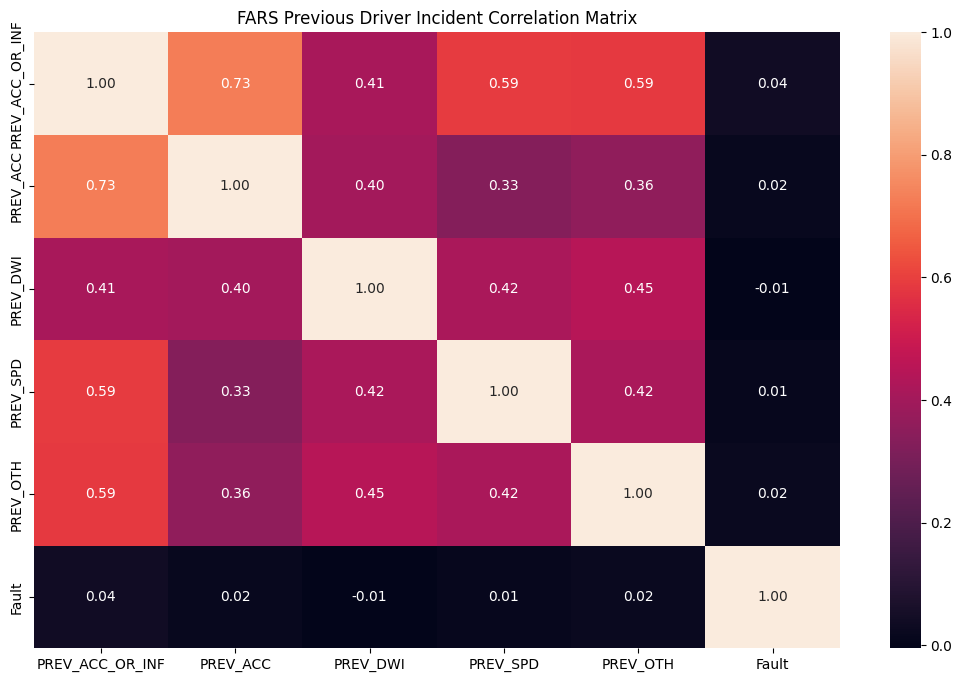

In [180]:
f, ax = plt.subplots(figsize=(13, 8))
sns.heatmap(farsAccVehMergeLight[["PREV_ACC_OR_INF","PREV_ACC", "PREV_DWI","PREV_SPD", "PREV_OTH"] + ["Fault"]].corr(method = "spearman"), annot=True, fmt=".2f", ax=ax)
ax.set_title("FARS Previous Driver Incident Correlation Matrix")

In [199]:
def getHighlyCorrelatedFeatures(corrMatrix, featuresToCheck, threshold ,printit = False):

    hihglyCorrelated = set()
    # only check half the features (symmetry)
    if (len(featuresToCheck) % 2) == 0:
        num_ = len(featuresToCheck) // 2
    else:
        num_ = len(featuresToCheck) // 2 + 1

    for feat_n_ in range(0,num_):
        highCorrSer_ = corrMatrix.loc[featuresToCheck[feat_n_],featuresToCheck][(corrMatrix.loc[featuresToCheck[feat_n_],featuresToCheck] > threshold) & (corrMatrix.loc[featuresToCheck[feat_n_],featuresToCheck] < 1)]
        if printit:
            print(highCorrSer_)
            print(set(list(highCorrSer_.index.values)))
            print()
        hihglyCorrelated = hihglyCorrelated.union(set(list(highCorrSer_.index.values)))
        
    
    return list(hihglyCorrelated)

highlyCorrelatedSeafety = getHighlyCorrelatedFeatures(corr2, safetFeatureList, 0.6)
highlyCorrelatedSeafety




['PedestrianAutoEmergencyBraking',
 'ForwardCollisionWarning',
 'LaneDepartureWarning',
 'DynamicBrakeSupport',
 'SemiAutoHeadlampBeamSwitching',
 'TractionControl',
 'ElectronicStabilityControl',
 'AdaptiveDrivingBeam',
 'LaneKeepingAssistance',
 'AdaptiveCruiseControl',
 'CrashImminentBraking',
 'AntilockBrakeSystem',
 'DaytimeRunningLight']

## Prepare DataFrame with top 20 vehicle models only

In [200]:
farsAccVehMergeLightTopMod = farsAccVehMergeLight[farsAccVehMergeLight["ModelIdMapped"].isin(farsTopModels["ModelIdMapped"].values)]
farsAccVehMergeLightTopMod.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14690 entries, 2 to 44921
Data columns (total 43 columns):
 #   Column                          Non-Null Count  Dtype
---  ------                          --------------  -----
 0   STATE                           14690 non-null  int64
 1   ST_CASE                         14690 non-null  int64
 2   VEH_NO                          14690 non-null  int64
 3   RUR_URB                         14690 non-null  int64
 4   FUNC_SYS                        14690 non-null  int64
 5   VNUM_LAN                        14690 non-null  int64
 6   LGT_COND                        14690 non-null  int64
 7   WEATHER                         14690 non-null  int64
 8   VSURCOND                        14690 non-null  int64
 9   DR_DRINK                        14690 non-null  int64
 10  L_STATUS                        14690 non-null  int64
 11  L_TYPE                          14690 non-null  int64
 12  PREV_ACC_OR_INF                 14690 non-null  int64
 13  P

In [201]:
farsAccVehMerge["PREV_ACC_OR_INF"].value_counts()

0     23416
1     15977
99     3947
Name: PREV_ACC_OR_INF, dtype: int64

## Prepare data selection for Model training

In [205]:
from sklearn.model_selection import train_test_split

featuresToTrain = [
    # all features
    [
        'ModelIdMapped', 'ModelYearMapped', 'VehicleGroup', 
        'SEX', 'AGE_GRP', 'DR_DRINK',
        'RUR_URB', 'FUNC_SYS', 'VNUM_LAN', 
        'LGT_COND', 'VSURCOND', 'WEATHER',  
        'VSPD_LIM_GRP', #'Pedestrian',  
        'L_STATUS', 'L_TYPE', 
        'PREV_ACC_OR_INF', 'PREV_ACC', 'PREV_DWI', 'PREV_SPD', 'PREV_OTH', 
        #'AnySafetyFeature',
    ] + safetFeatureList,
    # removing vehicle model
    [
        #'ModelYear', 
        'ModelIdMapped', #'VehicleGroup', 
        'SEX', 'AGE_GRP', 'DR_DRINK',
        'RUR_URB', 'FUNC_SYS', #'VNUM_LAN', 
        'LGT_COND', 'VSURCOND', #'WEATHER', 
        'VSPD_LIM_GRP', #'Pedestrian',  
        'L_STATUS', #'L_TYPE', 
        'PREV_ACC_OR_INF', #'PREV_ACC', 'PREV_DWI', 'PREV_SPD', 'PREV_OTH', 
        #'AnySafetyFeature',
    ] + safetFeatureList,
    # removing highly correlated features
    [
        #'ModelYearMapped', 
        'ModelIdMapped', #'VehicleGroup', 
        'SEX', 'AGE_GRP', 'DR_DRINK',
        'RUR_URB', 'FUNC_SYS', #'VNUM_LAN', 
        'LGT_COND', 'VSURCOND', #'WEATHER',  
        'VSPD_LIM_GRP', #'Pedestrian',  
        'L_STATUS', #'L_TYPE', 
        'PREV_ACC_OR_INF',#'PREV_ACC', 'PREV_DWI', 'PREV_SPD', 'PREV_OTH', 
        #'AnySafetyFeature',
    ] + [s for s in safetFeatureList if s not in highlyCorrelatedSeafety],
    [
        #'ModelYearMapped', 
        'ModelIdMapped', #'VehicleGroup', 
        'SEX', 'AGE_GRP', 'DR_DRINK',
        'RUR_URB', 'FUNC_SYS', #'VNUM_LAN', 
        'LGT_COND', 'VSURCOND', #'WEATHER',  
        'VSPD_LIM_GRP', #'Pedestrian',  
        'L_STATUS', #'L_TYPE', 
        'PREV_ACC_OR_INF',#'PREV_ACC', 'PREV_DWI', 'PREV_SPD', 'PREV_OTH', 
        #'AnySafetyFeature',
        'AntilockBrakeSystem'
    ],    
    # Any safety feature
    [
        #'ModelYearMapped', 
        'ModelIdMapped', #'VehicleGroup', 
        'SEX', 'AGE_GRP', 'DR_DRINK',
        'RUR_URB', 'FUNC_SYS', #'VNUM_LAN', 
        'LGT_COND', 'VSURCOND', #'WEATHER', 
        'VSPD_LIM_GRP', #'Pedestrian',  
        'L_STATUS', #'L_TYPE', 
        'PREV_ACC_OR_INF',#'PREV_ACC', 'PREV_DWI', 'PREV_SPD', 'PREV_OTH', 
        'AnySafetyFeature',
    ],
 ]

# Boolean index that selects rows with valid values for the features in question
def GetDFBoolIndexForFeatures(featureList, df=farsAccVehMergeLight):
    # set index to all false
    _to_delete_neg = df["STATE"].isna()
    if "RUR_URB" in featureList:
        _to_delete_neg = _to_delete_neg | df["RUR_URB"].isin([6,9,8])
    if "FUNC_SYS" in featureList:
        _to_delete_neg = _to_delete_neg | df["FUNC_SYS"].isin([96,98,99])
    if "VNUM_LAN" in featureList:
        _to_delete_neg = _to_delete_neg | (df["VNUM_LAN"] > 7)
    if "LGT_COND" in featureList:        
        _to_delete_neg = _to_delete_neg | df["LGT_COND"].isin([7,8,9])
    if "WEATHER" in featureList:
        _to_delete_neg = _to_delete_neg | df["WEATHER"].isin([8,98,99])
    if "VSURCOND" in featureList:
        _to_delete_neg = _to_delete_neg | df["VSURCOND"].isin([8,98,99])
    if "L_STATUS" in featureList:
        _to_delete_neg = _to_delete_neg | df["L_STATUS"].isin([7,9]) # 7: 'No Driver Present/Unknown if Driver Present', 9: 'Unknown License Status',
    if "L_TYPE" in featureList:
        _to_delete_neg = _to_delete_neg | df["L_TYPE"].isin([6,9]) # 6: 'No Driver Present/Unknown if Driver Present', 9: 'Unknown License Type',
    if "PREV_ACC" in featureList:
        _to_delete_neg = _to_delete_neg | df["PREV_ACC"].isin([98,99,998]) # 98 : "Not Reported",99:"Unknown",998:"No driver present"
    if "PREV_DWI" in featureList:
        _to_delete_neg = _to_delete_neg | df["PREV_DWI"].isin([98,99,998]) # 98 : "Not Reported",99:"Unknown",998:"No driver present"
    if "PREV_SPD" in featureList:
        _to_delete_neg = _to_delete_neg | df["PREV_SPD"].isin([98,99,998]) # 98 : "Not Reported",99:"Unknown",998:"No driver present"
    if "PREV_OTH" in featureList:
        _to_delete_neg = _to_delete_neg | df["PREV_OTH"].isin([98,99,998]) # 98 : "Not Reported",99:"Unknown",998:"No driver present"
    if "PREV_ACC_OR_INF" in featureList:
        _to_delete_neg = _to_delete_neg | df["PREV_ACC_OR_INF"].isin([98,99,998]) # 98 : "Not Reported",99:"Unknown",998:"No driver present"
    if "ModelYearMapped" in featureList:
        # eliminat outliers
        x = df["ModelYear"]
        q1 = x.quantile(.25)
        q3 = x.quantile(.75)
        IQR = q3 - q1
        outmin = q1 - 1.5*IQR
        outmax = min(q3 + 1.5*IQR,2019)
        _to_delete_neg = _to_delete_neg | (~x.between(outmin, outmax))
        print("outmin =",outmin,"outmax =",outmax,"q1=",q1,"q3=", q3)

    # return the ones that exclude all the above conditions (not)
    return ~_to_delete_neg

# pd.concat([df1,df2]).drop_duplicates(keep=False) # row difference between dataframes

In [206]:
# creat X, y values for training with proper rows

X = []
#y = farsAccVehMergeLighter["Fault"]
y = [] #F0["Fault"]
labelSet = {}

for i in range(0,len(featuresToTrain)):
    X.append(None)
    y.append(None)
    #y.append(None)
    #labelSet.append(None)
    #X[i] = F0[featuresToTrain[i]]
    X[i] = farsAccVehMergeLight[GetDFBoolIndexForFeatures(featuresToTrain[i])][featuresToTrain[i]]
    y[i] = farsAccVehMergeLight.loc[X[i].index,"Fault"]
    #X_train[i], X_test[i], y_train[i], y_test[i] = train_test_split(X[i], y, test_size=0.3, random_state=100)
    labelSet[i] = "Feat "+str(i)+"-"+str(len(X[i].columns))+"cols"
    print(labelSet[i],"size(X,y)=",len(X[i]),len(y[i]))
    print(i,":",np.array_str(X[i].columns.values,max_line_width=np.inf))


outmin = 1987.5 outmax = 2019 q1= 2004.0 q3= 2015.0
Feat 0-36cols size(X,y)= 33545 33545
0 : ['ModelIdMapped' 'ModelYearMapped' 'VehicleGroup' 'SEX' 'AGE_GRP' 'DR_DRINK' 'RUR_URB' 'FUNC_SYS' 'VNUM_LAN' 'LGT_COND' 'VSURCOND' 'WEATHER' 'VSPD_LIM_GRP' 'L_STATUS' 'L_TYPE' 'PREV_ACC_OR_INF' 'PREV_ACC' 'PREV_DWI' 'PREV_SPD' 'PREV_OTH' 'AntilockBrakeSystem' 'AdaptiveCruiseControl' 'AdaptiveDrivingBeam' 'AutoPedestrianAlertingSound' 'BlindSpotWarning' 'CrashImminentBraking' 'DaytimeRunningLight' 'DynamicBrakeSupport' 'ElectronicStabilityControl' 'ForwardCollisionWarning' 'LaneDepartureWarning' 'LaneKeepingAssistance' 'PedestrianAutoEmergencyBraking' 'SemiAutoHeadlampBeamSwitching' 'TPMS' 'TractionControl']
Feat 1-27cols size(X,y)= 37904 37904
1 : ['ModelIdMapped' 'SEX' 'AGE_GRP' 'DR_DRINK' 'RUR_URB' 'FUNC_SYS' 'LGT_COND' 'VSURCOND' 'VSPD_LIM_GRP' 'L_STATUS' 'PREV_ACC_OR_INF' 'AntilockBrakeSystem' 'AdaptiveCruiseControl' 'AdaptiveDrivingBeam' 'AutoPedestrianAlertingSound' 'BlindSpotWarning' 'Cr

# Machile Learning Arlgorithms to help Identify Key Features

In [207]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_recall_fscore_support
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_validate
from sklearn.metrics import accuracy_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline


markers = ["+","o","v","^","<",">","0","1","2","3","4","5","6","7","8","9","10","11"]



In [208]:
# get cross validation metrics
def my_getcoef_scorer(clf, X, y):
      _y_pred = clf.predict(X)
      _accuracy=accuracy_score(y, _y_pred)
      (_precision, _recall, _f1, _)=precision_recall_fscore_support(y, _y_pred,beta=1.0,zero_division=1,average='binary')
      if isinstance(clf,Pipeline): #type(clf)=="sklearn.pipeline.Pipeline":
        _feat_importance = clf[1].coef_[0]
      elif isinstance(clf,DecisionTreeClassifier) or isinstance(clf,RandomForestClassifier):
        _feat_importance = clf.feature_importances_
      else:
        _feat_importance = np.zeros(len(X.columns))
      _out_dict = {"accuracy":_accuracy,"precision":_precision,"recall":_recall,"f1":_f1}
      for _feat_n in range(len(X.columns)):
        _out_dict[X.columns[_feat_n]] = _feat_importance[_feat_n]
      return _out_dict


In [209]:
lrnScore = {}
lrnFeat = {}

## Logistic Regression Classification

In [210]:
# execute cross validation for Logistic Regression
# returns 2 DataFrames, one with scores and one with feature importance coheficients
def CrossValLogReg(cv = 10, multi_class="auto",max_iter=100, class_weight=None, progress=True, plotit=True, n_jobs=3):
    pipe = []
    lr_score = []
    lr_featimportance = []
    for fi in range(0,len(featuresToTrain)):
        pipe.append(None)
        lr_featimportance.append({})
        lr_score.append({})
        pipe[fi] = make_pipeline(StandardScaler(), LogisticRegression(multi_class=multi_class,max_iter=max_iter, class_weight=class_weight))
        scores = cross_validate(estimator=pipe[fi], X=X[fi], y=y[fi], cv=cv, n_jobs=n_jobs, scoring=my_getcoef_scorer)
        for _score in ['accuracy','precision','recall','f1']:
            lr_score[fi][_score] = scores['test_' + _score].mean()
        lr_score[fi]["accuracy_std"] = scores['test_accuracy'].std()
        lr_featimportance[fi] = {}
        for _feat in featuresToTrain[0]: # farsAccVehMergeLight.columns.values:
            if _feat in featuresToTrain[fi]:
                lr_featimportance[fi][_feat] = scores['test_' + _feat].mean()
            else:
                lr_featimportance[fi][_feat] = np.nan

        if progress:
            print(fi,lr_score[fi])
    
    df_score = pd.DataFrame(lr_score)
    df_feat = pd.DataFrame(lr_featimportance)

    if plotit:
        fig, ax = plt.subplots()
        ax.set_xlabel("Feature Set")
        ax.set_ylabel("Accuracy/Precision")
        ax.set_title("Logistic Regression Accuracy/Precision vs Feature Set")
        ax.errorbar(range(0,len(featuresToTrain)), df_score["accuracy"], yerr = df_score["accuracy_std"], linestyle = "--", marker=markers[1], drawstyle="steps-post", label = "accuracy") 
        ax.plot(range(0,len(featuresToTrain)), df_score["precision"], linestyle = "--", marker=markers[3], drawstyle="steps-post", label = "presicion(fault)")
        ax.plot(range(0,len(featuresToTrain)), df_score["recall"], linestyle = "--", marker=markers[3], drawstyle="steps-post", label = "recall(fault)")
        ax.plot(range(0,len(featuresToTrain)), df_score["f1"], linestyle = "--", marker=markers[5], drawstyle="steps-post", label = "f1(fault)")
        #ax[0].plot(lrnLR1Score,linestyle = "--",drawstyle="steps-post")
        ax.xaxis.get_major_locator().set_params(integer=True)
        ax.legend(bbox_to_anchor=(1, 1), loc='upper left')
        ax.yaxis.grid(True)
        plt.tight_layout()
        plt.show()

        fig, ax = plt.subplots(figsize=(9,9))
        df_feat.rename(index=labelSet).transpose().abs().plot.barh(ax=ax)
        #ax[1].bar(lnrnLR2feat)
        ax.legend(title='Feature set')
        ax.tick_params(labelsize="small")
        ax.xaxis.grid(True)
        ax.set_title("Logistic Regression Feature Importance")
        #ax.yaxis.grid(True)
        plt.tight_layout()
        plt.show()
        

    return (df_score,df_feat)



0 {'accuracy': 0.5718306588569646, 'precision': 0.8397602948478694, 'recall': 0.5460144373274284, 'f1': 0.6598445520355204, 'accuracy_std': 0.02995030743072467}
1 {'accuracy': 0.5722635265164195, 'precision': 0.8413875816965947, 'recall': 0.5435782096632165, 'f1': 0.6589617717479477, 'accuracy_std': 0.028457710926398275}
2 {'accuracy': 0.5716832325414518, 'precision': 0.8420934491005273, 'recall': 0.5419224544005202, 'f1': 0.6578764658045277, 'accuracy_std': 0.029926424274048586}
3 {'accuracy': 0.5710500289186512, 'precision': 0.8420427894170276, 'recall': 0.5409908011877207, 'f1': 0.6571917685298211, 'accuracy_std': 0.02934210145314388}
4 {'accuracy': 0.5709709358855058, 'precision': 0.8419804439817711, 'recall': 0.5408529773123261, 'f1': 0.6570322628161942, 'accuracy_std': 0.030421643887700002}


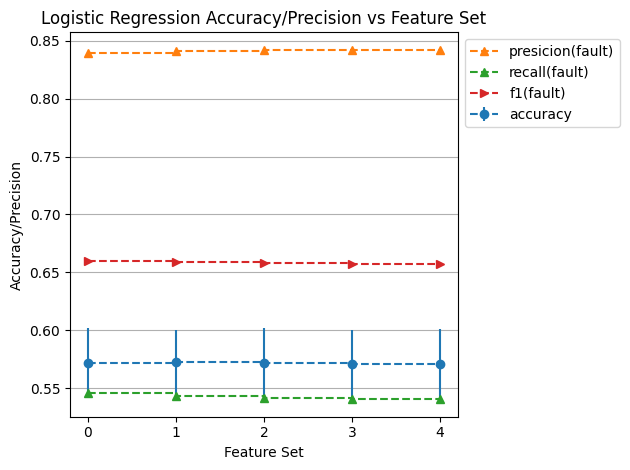

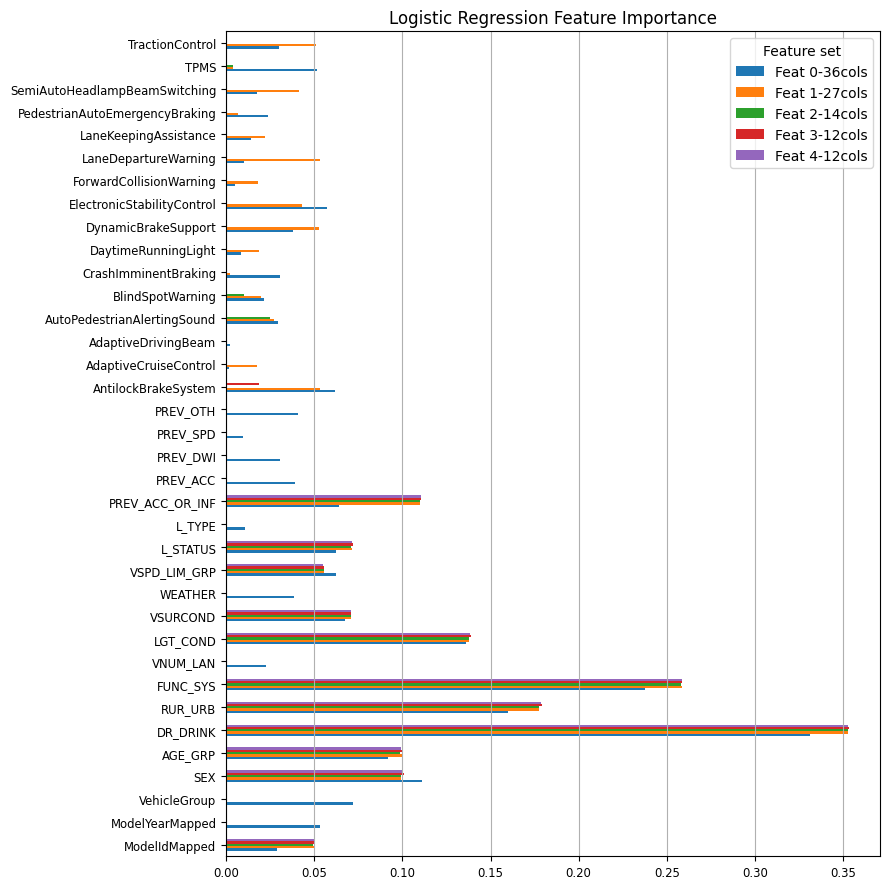

In [233]:
#lrnScore["LogReg0"], lrnFeat["LogReg0"] = CrossValLogReg(multi_class="ovr",max_iter=200, class_weight={0:0.6,1:0.4}, n_jobs=8)
lrnScore["LogReg0"], lrnFeat["LogReg0"] = CrossValLogReg(multi_class="ovr",max_iter=200, class_weight='balanced', n_jobs=8)

0 {'accuracy': 0.7660456658585659, 'precision': 0.7666162118991476, 'recall': 0.9986381019915875, 'f1': 0.8673786343605995, 'accuracy_std': 0.0009898777678562733}
1 {'accuracy': 0.7649324783184708, 'precision': 0.7653311222711136, 'recall': 0.998896028176388, 'f1': 0.8666526594214922, 'accuracy_std': 0.0009745763922754221}
2 {'accuracy': 0.7648269374213732, 'precision': 0.7652080946420461, 'recall': 0.9989995240475, 'f1': 0.8666127051868863, 'accuracy_std': 0.0008157381218333072}
3 {'accuracy': 0.7647478374135801, 'precision': 0.7650913392889849, 'recall': 0.9991375264748579, 'f1': 0.8665897937731841, 'accuracy_std': 0.0007876115345976087}
4 {'accuracy': 0.7646686817407569, 'precision': 0.7650306590919393, 'recall': 0.9991375264748579, 'f1': 0.8665508910505235, 'accuracy_std': 0.0008027279712054401}


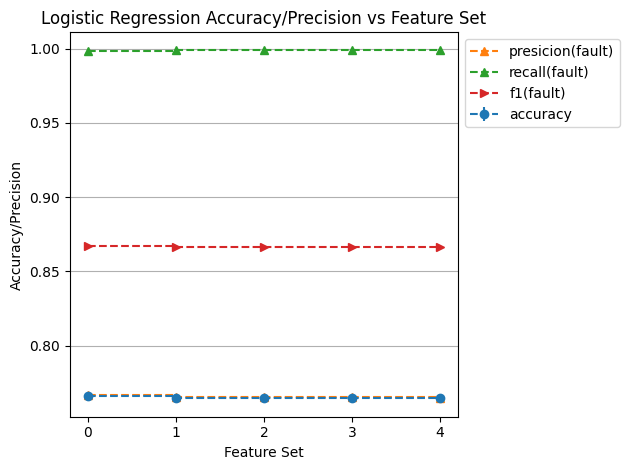

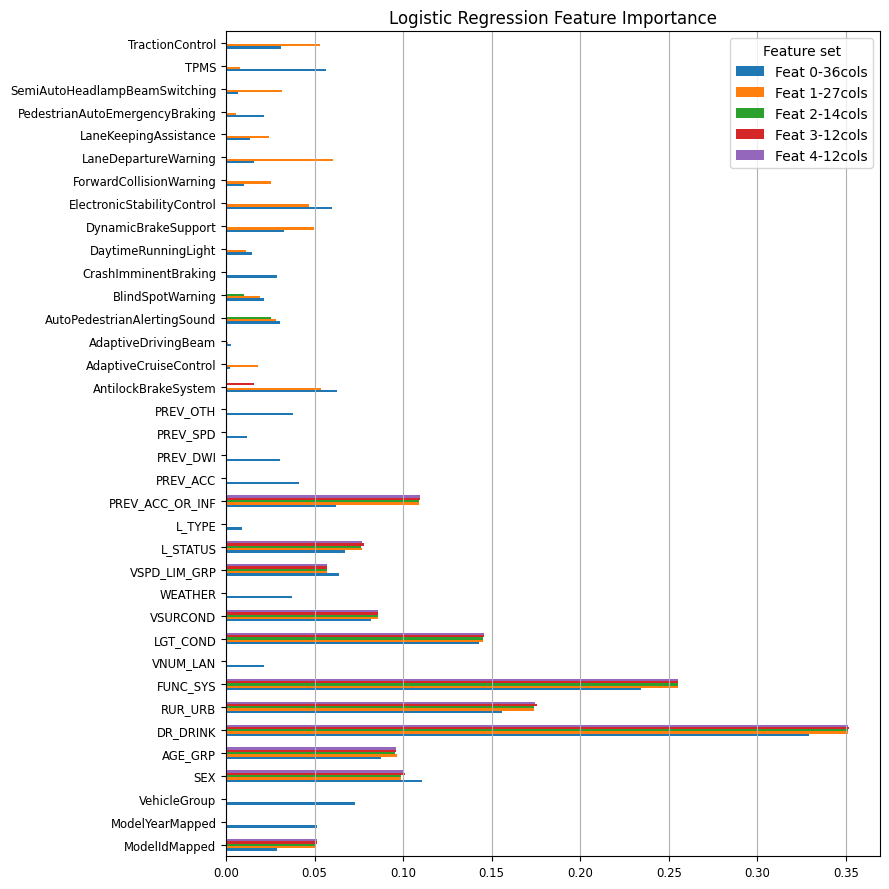

In [212]:
lrnScore["LogReg1"], lrnFeat["LogReg1"] = CrossValLogReg(cv=20, max_iter=200, n_jobs=8)

## Decision Tree

In [213]:
# execute cross validation for Decision Tree or Random Forest
# returns 2 DataFrames, one with scores and one with feature importance coheficients
def CrossValDecTree(cv = 10, criterion="gini",max_depth=20,random_state=255, max_features="sqrt", random_forest = False, progress=True, plotit=True, n_jobs=3):
    min_depth=3
    clf = []
    score = []
    scoreatdepth = []
    featimportance = []
    featimportanceatdepth = []
    for fi in range(0,len(featuresToTrain)):
        clf.append(None)
        featimportance.append({})
        score.append({})
        scoreatdepth.append([])
        featimportanceatdepth.append([])
        #for i in range(min_depth,max_depth):
        for i in range(0,max_depth - min_depth):
            scoreatdepth[fi].append({})
            featimportanceatdepth[fi].append({})
            if not(random_forest):
                clf[fi] = DecisionTreeClassifier(criterion=criterion,max_depth=i + min_depth,random_state=random_state, max_features=max_features)
            else:
                clf[fi] = RandomForestClassifier(criterion=criterion,max_depth=i + min_depth,random_state=random_state, max_features=max_features)
            #make_pipeline(StandardScaler(), LogisticRegression(multi_class=multi_class,max_iter=max_iter, class_weight=class_weight))
            scores = cross_validate(estimator=clf[fi], X=X[fi], y=y[fi], cv=cv, n_jobs=n_jobs, scoring=my_getcoef_scorer)
            for _score in ['accuracy','precision','recall','f1']:
                scoreatdepth[fi][i][_score] = scores['test_' + _score].mean()
            scoreatdepth[fi][i]["accuracy_std"] = scores['test_accuracy'].std()
            #featimportanceatdepth[fi][i - min_depth]
            for _feat in featuresToTrain[0]: # farsAccVehMergeLight.columns.values:
                if _feat in featuresToTrain[fi]:
                    featimportanceatdepth[fi][i][_feat] = scores['test_' + _feat].mean()
                else:
                    featimportanceatdepth[fi][i][_feat] = np.nan
            #if progress:
            #    print(fi,"depth=",i,scoreatdepth[fi][i])
        # find tree depth with highest accuracy
        bestDepth = pd.DataFrame(scoreatdepth[fi])["accuracy"].idxmax()
        score[fi] = scoreatdepth[fi][bestDepth]
        score[fi]["bestdepth"] = bestDepth + min_depth
        featimportance[fi] = featimportanceatdepth[fi][bestDepth]
        if progress:
            print(fi,score[fi])

    df_score = pd.DataFrame(score)
    df_feat = pd.DataFrame(featimportance)

    if not(random_forest):
        _title = "Decision Tree"
    else:
        _title = "Random Forest"

    if plotit:
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,6))
        ax[0].set_xlabel("Tree Depth")
        ax[0].set_ylabel("Avg. Accuracy")
        ax[0].set_title(_title + " Avg. Accuracy vs tree depth")
        for fi in range(0,len(featuresToTrain)):
            _score_at_depth_df = pd.DataFrame(scoreatdepth[fi])
            ax[0].errorbar(_score_at_depth_df.index.values + min_depth, _score_at_depth_df["accuracy"], yerr = _score_at_depth_df["accuracy_std"], linestyle = "--", marker=markers[fi], drawstyle="steps-post", label = "acc " + labelSet[fi])  
        ax[0].legend()
        ax[1].sharey(ax[0])
        ax[1].set_xlabel("Feature Set")
        ax[1].set_ylabel("Accuracy/Precision")
        ax[1].set_title(_title + " Accuracy/Precision vs Feature Set")
        ax_t = ax[1].twinx()
        ax_t.set_ylabel("Tree Depth")
        ax[1].errorbar(range(0,len(featuresToTrain)), df_score["accuracy"], yerr = df_score["accuracy_std"], linestyle = "--", marker=markers[1], drawstyle="steps-post", label = "accuracy") 
        ax[1].plot(range(0,len(featuresToTrain)), df_score["precision"], linestyle = "--", marker=markers[2], drawstyle="steps-post", label = "presicion(fault)")
        ax[1].plot(range(0,len(featuresToTrain)), df_score["recall"], linestyle = "--", marker=markers[3], drawstyle="steps-post", label = "recall(fault)")
        ax[1].plot(range(0,len(featuresToTrain)), df_score["f1"], linestyle = "--", marker=markers[4], drawstyle="steps-post", label = "f1(fault)")
        ax_t.plot(range(0,len(featuresToTrain)), df_score["bestdepth"], linestyle = "-", label = "Tree Depth")
        #ax[0].plot(lrnLR1Score,linestyle = "--",drawstyle="steps-post")
        ax[1].xaxis.get_major_locator().set_params(integer=True)
        ax_t.yaxis.get_major_locator().set_params(integer=True)
        ax[1].legend(bbox_to_anchor=(1.04, 1), loc='upper left')
        ax_t.legend(bbox_to_anchor=(1.04, 1), loc='lower left')
        ax[1].yaxis.grid(True)
        plt.tight_layout()
        plt.show()

        fig, ax = plt.subplots(figsize=(9,9))
        df_feat.rename(index=labelSet).transpose().abs().plot.barh(ax=ax)
        #ax[1].bar(lnrnLR2feat)
        ax.legend(title='Feature set')
        ax.tick_params(labelsize="small")
        ax.xaxis.grid(True)
        ax.set_title(_title + " Feature Importance")
        #ax.yaxis.grid(True)
        plt.tight_layout()
        plt.show()
    

    return (df_score,df_feat)


0 {'accuracy': 0.7667610709280552, 'precision': 0.7705018243746011, 'recall': 0.9906220985621743, 'f1': 0.8668010959015525, 'accuracy_std': 0.001743484051353973, 'bestdepth': 8}
1 {'accuracy': 0.7666737495902322, 'precision': 0.7670093308187244, 'recall': 0.9980679661319162, 'f1': 0.8674145393281849, 'accuracy_std': 0.001246016143147981, 'bestdepth': 5}
2 {'accuracy': 0.7672540505251642, 'precision': 0.768268647980486, 'recall': 0.9961013661930022, 'f1': 0.8674739115847718, 'accuracy_std': 0.0016723251390618685, 'bestdepth': 6}
3 {'accuracy': 0.7666209443418623, 'precision': 0.7693359661297637, 'recall': 0.9923756222547411, 'f1': 0.8667300810941285, 'accuracy_std': 0.0017335955328909153, 'bestdepth': 8}
4 {'accuracy': 0.7665946147973014, 'precision': 0.7670471795351342, 'recall': 0.9978264678498643, 'f1': 0.8673475527498139, 'accuracy_std': 0.001339852634704872, 'bestdepth': 6}


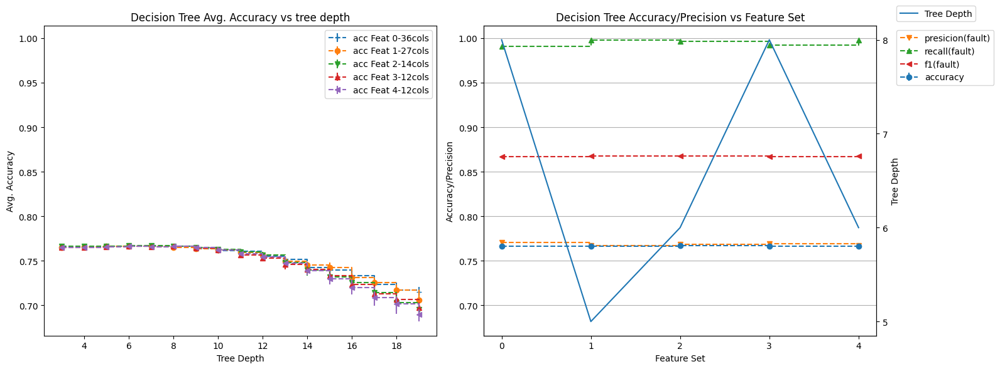

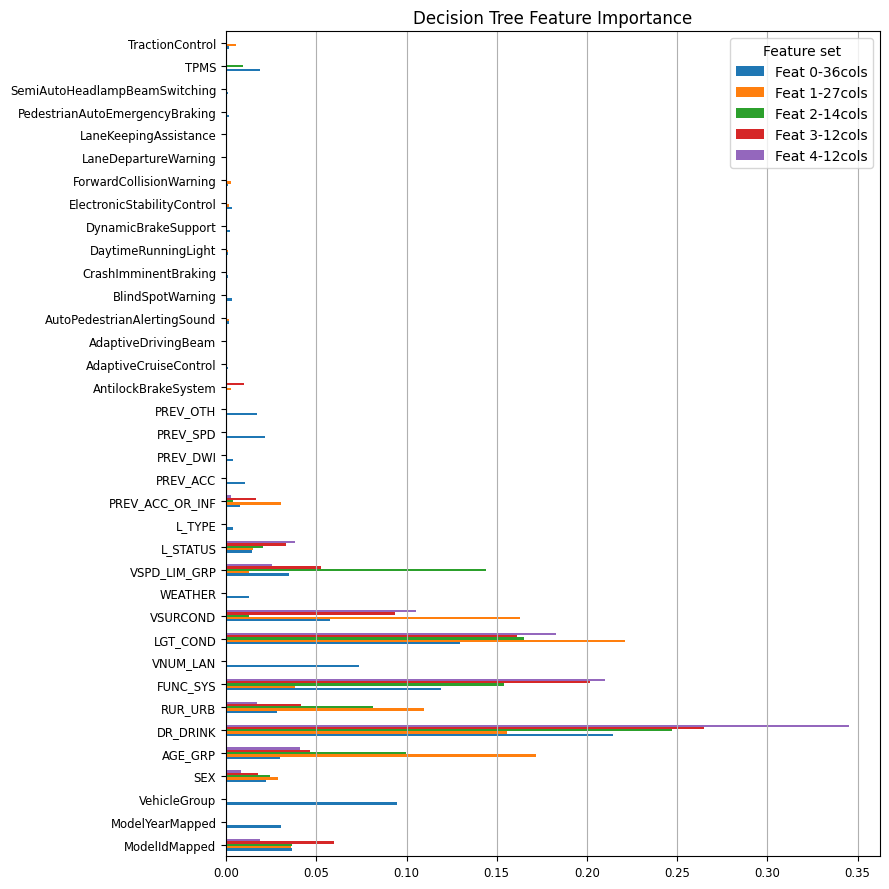

In [214]:
lrnScore["DecTre0"], lrnFeat["DecTre0"] = CrossValDecTree(n_jobs=8)

## Random Forest Classifier

0 {'accuracy': 0.7693843861056976, 'precision': 0.7696921590842489, 'recall': 0.9974317097146008, 'f1': 0.8688862078413131, 'accuracy_std': 0.0019076629578973396, 'bestdepth': 10}
1 {'accuracy': 0.7680192011492293, 'precision': 0.7684193276345153, 'recall': 0.9971709385045318, 'f1': 0.8679753207449847, 'accuracy_std': 0.0016940382063874448, 'bestdepth': 11}
2 {'accuracy': 0.7679664655005014, 'precision': 0.7681932124047137, 'recall': 0.9976194285123903, 'f1': 0.868000974250499, 'accuracy_std': 0.0018817601158504101, 'bestdepth': 7}
3 {'accuracy': 0.7679136950519527, 'precision': 0.7681379445380966, 'recall': 0.9976539469715527, 'f1': 0.8679789066787261, 'accuracy_std': 0.0016949528771484047, 'bestdepth': 6}
4 {'accuracy': 0.7679400802762271, 'precision': 0.7681012804118869, 'recall': 0.9977919374877846, 'f1': 0.8680077176104671, 'accuracy_std': 0.0016152563432246026, 'bestdepth': 5}


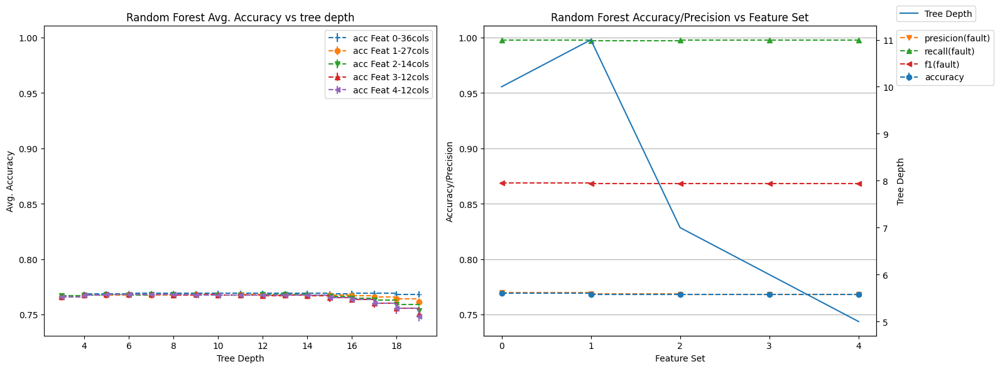

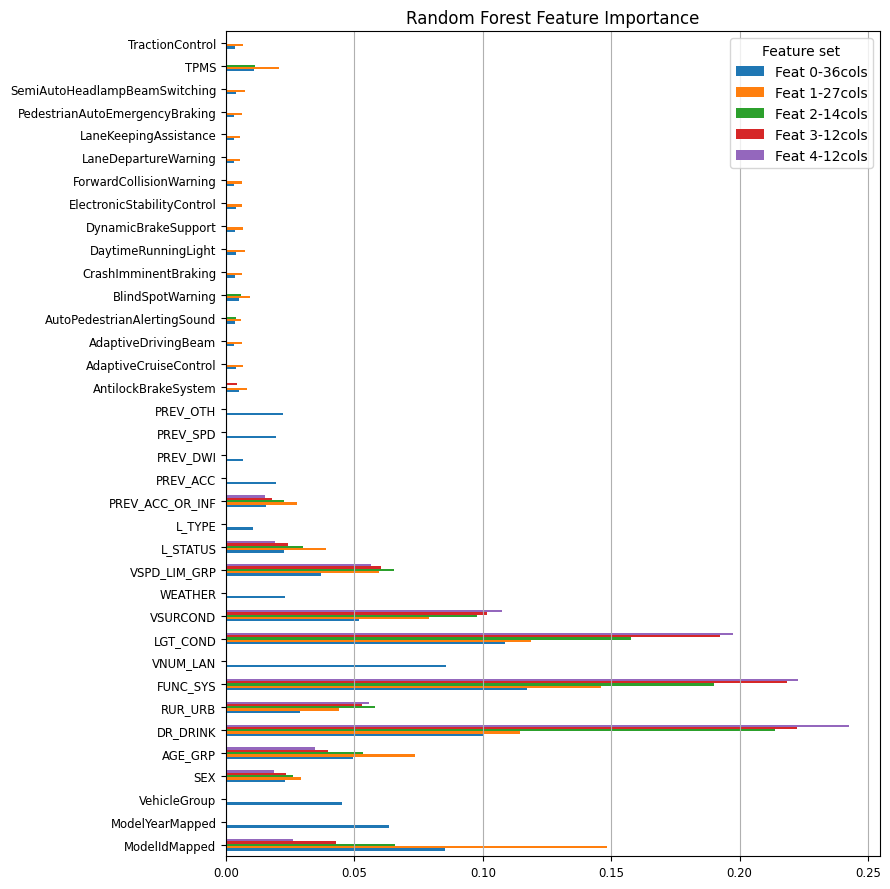

In [215]:
lrnScore["RndFor0"], lrnFeat["RndFor0"] = CrossValDecTree(random_forest=True, n_jobs=8)

## Compare ML performance

In [226]:
lrnScore
#for _key_n in range(0,len(lrnScore)):
#    _key = list(lrnScore.keys())[_key_n]
#    print(_key)

lrnScore["LogReg0"]["accuracy"].idxmax(), lrnScore["LogReg0"]["accuracy"]

(4,
 0    0.759517
 1    0.759550
 2    0.760447
 3    0.760131
 4    0.760474
 Name: accuracy, dtype: float64)

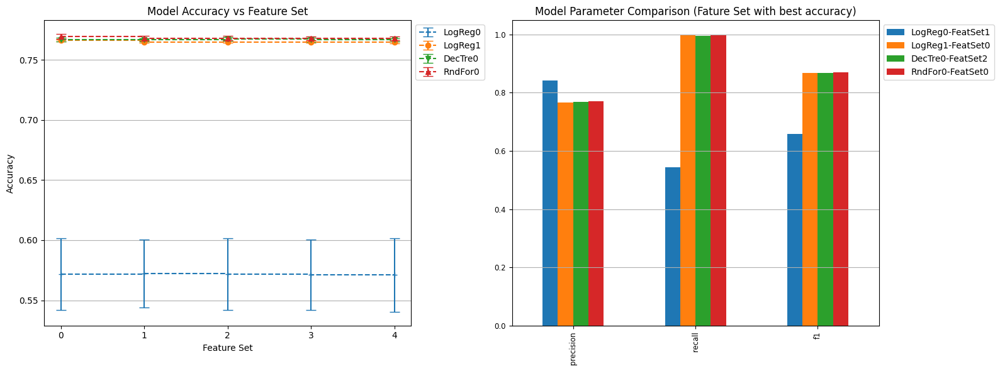

best feature set: {'LogReg0': 1, 'LogReg1': 0, 'DecTre0': 2, 'RndFor0': 0}
LogReg0 best accuracy = 0.5722635265164195
LogReg1 best accuracy = 0.7660456658585659
DecTre0 best accuracy = 0.7672540505251642
RndFor0 best accuracy = 0.7693843861056976
                    precision    recall        f1
----------------  -----------  --------  --------
LogReg0-FeatSet1     0.841388  0.543578  0.658962
LogReg1-FeatSet0     0.766616  0.998638  0.867379
DecTre0-FeatSet2     0.768269  0.996101  0.867474
RndFor0-FeatSet0     0.769692  0.997432  0.868886


In [244]:
# accurancy comparison
#fig, ax = plt.subplots()

bestFeatSet = {}

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,6))
ax[0].set_xlabel("Feature Set")
ax[0].set_ylabel("Accuracy")
ax[0].set_title("Model Accuracy vs Feature Set")
for _key_n in range(0,len(lrnScore)):
    _key = list(lrnScore.keys())[_key_n]
    # identify which Feature Set provided the best accuracy
    bestFeatSet[_key] = lrnScore[_key]["accuracy"].idxmax()
    ax[0].errorbar(range(0,len(featuresToTrain)), lrnScore[_key]["accuracy"], yerr = lrnScore[_key]["accuracy_std"], linestyle = "--", marker=markers[_key_n], drawstyle="steps-post", label = _key, capsize=6) 
    #ax[0].plot(range(0,len(featuresToTrain)), lrnScore[_key]["accuracy"], linestyle = "--", marker=markers[_key_n], drawstyle="steps-post", label = _key) 
ax[0].xaxis.get_major_locator().set_params(integer=True)
ax[0].legend(bbox_to_anchor=(1, 1), loc='upper left')
ax[0].yaxis.grid(True)


# compare other model scores only but for the Feature Set that provided the best accuracy
dfPRFComparison = pd.DataFrame(dict(lrnScore["LogReg0"].loc[bestFeatSet["LogReg0"]][["precision","recall","f1"]]),index=["LogReg0-FeatSet" + str(bestFeatSet["LogReg0"])])
for _key_n in range(1,len(lrnScore)):
    _key = list(lrnScore.keys())[_key_n]
    dfPRFComparison.loc[_key + "-FeatSet" + str(bestFeatSet[_key])] = lrnScore[_key].loc[bestFeatSet[_key]][["precision","recall","f1"]]

dfPRFComparison.transpose().plot.bar(ax=ax[1])
ax[1].legend(bbox_to_anchor=(1, 1), loc='upper left')
ax[1].tick_params(labelsize="small")
ax[1].yaxis.grid(True)
ax[1].set_title("Model Parameter Comparison (Fature Set with best accuracy)")

plt.tight_layout()
plt.show()

#print(tabulate(pd.DataFrame(bestFeatSet),headers="keys"))
print("best feature set:",bestFeatSet)
for _key in bestFeatSet.keys():
    print(_key, "best accuracy =",lrnScore[_key].loc[bestFeatSet[_key],"accuracy"])
print(tabulate(dfPRFComparison,headers="keys"))



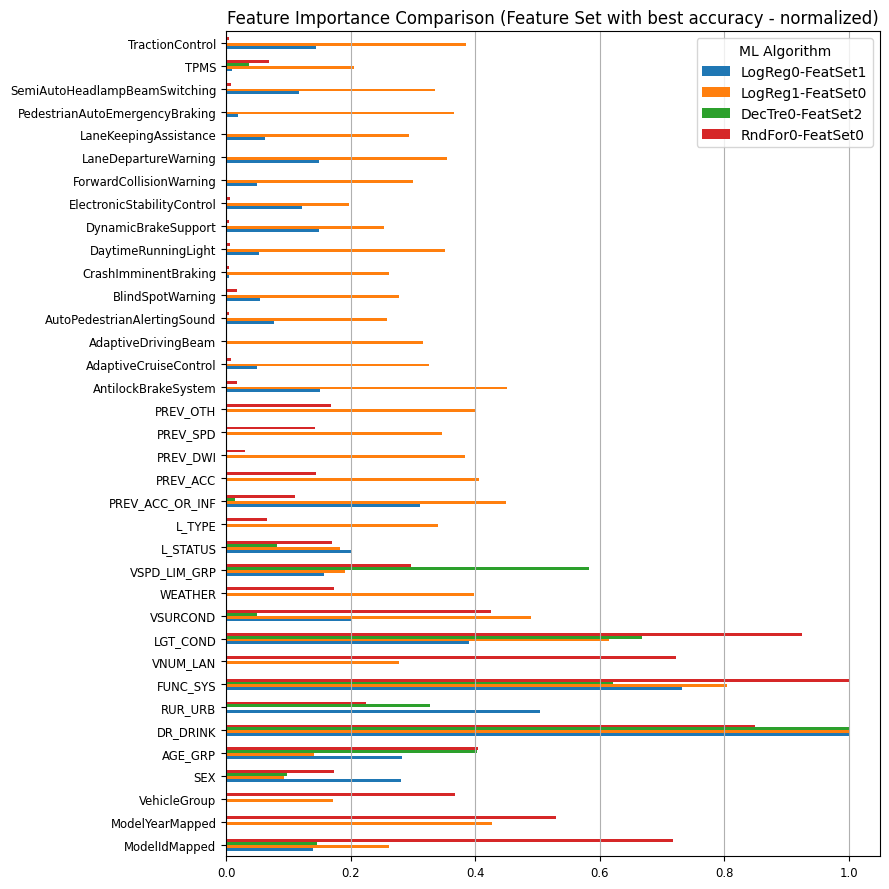

,ModelIdMapped,ModelYearMapped,VehicleGroup,SEX,AGE_GRP,DR_DRINK,RUR_URB,FUNC_SYS,VNUM_LAN,LGT_COND,VSURCOND,WEATHER,VSPD_LIM_GRP,L_STATUS,L_TYPE,PREV_ACC_OR_INF,PREV_ACC,PREV_DWI,PREV_SPD,PREV_OTH,AntilockBrakeSystem,AdaptiveCruiseControl,AdaptiveDrivingBeam,AutoPedestrianAlertingSound,BlindSpotWarning,CrashImminentBraking,DaytimeRunningLight,DynamicBrakeSupport,ElectronicStabilityControl,ForwardCollisionWarning,LaneDepartureWarning,LaneKeepingAssistance,PedestrianAutoEmergencyBraking,SemiAutoHeadlampBeamSwitching,TPMS,TractionControl
LogReg0-FeatSet1,0.140102,NaN,NaN,0.280261,0.282278,1.000000,0.503303,0.731884,NaN,0.390510,0.199802,NaN,0.156969,0.201999,NaN,0.311349,NaN,NaN,NaN,NaN,0.150913,0.049651,0.000000,0.076727,0.055192,0.005090,0.052866,0.148710,0.122065,0.049931,0.149972,0.061748,0.018927,0.116567,0.009970,0.144099
LogReg1-FeatSet0,0.262298,0.426839,0.170939,0.093779,0.141595,1.000000,0.000000,0.803758,0.277331,0.615096,0.489393,0.398461,0.190366,0.183024,0.339683,0.449813,0.406516,0.384278,0.346146,0.399568,0.450638,0.325301,0.315526,0.258943,0.277595,0.261988,0.351459,0.253511,0.197918,0.300795,0.354080,0.293790,0.365321,0.335420,0.205140,0.384775
DecTre0-FeatSet2,0.145992,NaN,NaN,0.097470,0.402805,1.000000,0.327311,0.621494,NaN,0.667443,0.049839,NaN,0.582478,0.081338,NaN,0.013738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000186,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.036747,NaN
RndFor0-FeatSet0,0.718136,0.530445,0.366833,0.172994,0.404447,0.849395,0.223956,1.000000,0.722798,0.924187,0.424903,0.173579,0.296795,0.169591,0.065799,0.110521,0.144766,0.030980,0.142820,0.168795,0.017085,0.008069,0.000460,0.004558,0.017065,0.003908,0.005640,0.004014,0.005641,0.001481,0.000000,0.000900,0.000724,0.007568,0.069531,0.004689


In [250]:
def norm(s):
    return (s - s.min())/(s.max() - s.min())

# compare feature importance, 
dfFeatComparison = pd.DataFrame(dict(norm(lrnFeat["LogReg0"].loc[bestFeatSet["LogReg0"]].abs())),index=["LogReg0-FeatSet" + str(bestFeatSet["LogReg0"])])
for _key_n in range(1,len(lrnScore)):
    _key = list(lrnScore.keys())[_key_n]
    dfFeatComparison.loc[_key + "-FeatSet" + str(bestFeatSet[_key])] = norm(lrnFeat[_key].loc[bestFeatSet[_key]])

fig, ax = plt.subplots(figsize=(9,9))
dfFeatComparison.transpose().abs().plot.barh(ax=ax)
ax.legend(title='ML Algorithm')
ax.tick_params(labelsize="small")
ax.xaxis.grid(True)
ax.set_title("Feature Importance Comparison (Feature Set with best accuracy - normalized)")
#ax.yaxis.grid(True)
plt.tight_layout()
plt.show()

dfFeatComparison

In [253]:
# top 10 features per model
numTopFeatMod = 40
topFeatDct = {}
for mlAlg in dfFeatComparison.index:
    topFeatDct[mlAlg] = dfFeatComparison.loc[mlAlg].abs().sort_values(ascending=False).head(numTopFeatMod).index.values

topFeaturesForAlg = pd.DataFrame(topFeatDct)
print("Top",numTopFeatMod,"Features for each Model")
topFeaturesForAlg

Top 40 Features for each Model


,LogReg0-FeatSet1,LogReg1-FeatSet0,DecTre0-FeatSet2,RndFor0-FeatSet0
0,DR_DRINK,DR_DRINK,DR_DRINK,FUNC_SYS
1,FUNC_SYS,FUNC_SYS,LGT_COND,LGT_COND
2,RUR_URB,LGT_COND,FUNC_SYS,DR_DRINK
3,LGT_COND,VSURCOND,VSPD_LIM_GRP,VNUM_LAN
4,PREV_ACC_OR_INF,AntilockBrakeSystem,AGE_GRP,ModelIdMapped
5,AGE_GRP,PREV_ACC_OR_INF,RUR_URB,ModelYearMapped
6,SEX,ModelYearMapped,ModelIdMapped,VSURCOND
7,L_STATUS,PREV_ACC,SEX,AGE_GRP
8,VSURCOND,PREV_OTH,L_STATUS,VehicleGroup
9,VSPD_LIM_GRP,WEATHER,VSURCOND,VSPD_LIM_GRP


# Use NYS Registration to Identify Fatal Accident Rates for Most Popular Vehicles Models

Two cases
1. Use all records in FARS
2. Use "Fault" records in FARS

In [93]:
nydmvNumTopModels = 50

In [94]:
#Add nydmvModelIDCat to farsCategories["ModelId"]
print("FarsCategories before merge:",len(farsCategories["ModelId"]),"NYDM Model Categories:",len(nydmvModelIDCat))
farsCategories["ModelId"].update(nydmvModelIDCat)
print("FarsCategories after merge:",len(farsCategories["ModelId"]))

FarsCategories before merge: 2172 NYDM Model Categories: 6429
FarsCategories after merge: 6522


In [95]:
# Get overall accident rate per 100,000 vehicles for all vehicle models
nysOverallRate = (farsAccVehMergeLight["STATE"]==36).sum()/len(nydmvVinDecodeDf) * 100000
nysOverallFaultRate= ((farsAccVehMergeLight["STATE"]==36) & farsAccVehMergeLight["Fault"]).sum()/len(nydmvVinDecodeDf) * 100000
print("NYS Overall Fatal accident rate per 100,000 vehicles =",round(nysOverallRate,2))
print("NYS Overall At Fault Fatal accident rate per 100,000 vehicles =",round(nysOverallFaultRate,2))

NYS Overall Fatal accident rate per 100,000 vehicles = 10.54
NYS Overall At Fault Fatal accident rate per 100,000 vehicles = 8.45


In [96]:
farsAccVehMergeLight.info(), farsAccVehMerge.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 43340 entries, 0 to 44921
Data columns (total 43 columns):
 #   Column                          Non-Null Count  Dtype
---  ------                          --------------  -----
 0   STATE                           43340 non-null  int64
 1   ST_CASE                         43340 non-null  int64
 2   VEH_NO                          43340 non-null  int64
 3   RUR_URB                         43340 non-null  int64
 4   FUNC_SYS                        43340 non-null  int64
 5   VNUM_LAN                        43340 non-null  int64
 6   LGT_COND                        43340 non-null  int64
 7   WEATHER                         43340 non-null  int64
 8   VSURCOND                        43340 non-null  int64
 9   DR_DRINK                        43340 non-null  int64
 10  L_STATUS                        43340 non-null  int64
 11  L_TYPE                          43340 non-null  int64
 12  PREV_ACC_OR_INF                 43340 non-null  int64
 13  P

(None, None)

In [97]:
farsModelsNYS = pd.DataFrame()
farsModelsNYS["NYS_FARS_ALL"] = farsAccVehMerge[farsAccVehMerge["STATE"]==36]["ModelId"].value_counts()
farsModelsNYSFault = pd.DataFrame()
farsModelsNYSFault["NYS_FARS_FAULT"] = farsAccVehMerge[(farsAccVehMerge["STATE"]==36) & farsAccVehMerge["Fault"]]["ModelId"].value_counts()
nydmvModels = pd.DataFrame()
#nydmvModels["NYS_REG_ALL"] = nydmvVinDecodeDf["ModelID"].rename(index={"ModelID":"ModelId"}).value_counts()
nydmvModels["NYS_REG_ALL"] = nydmvVinDecodeDf["ModelID"].value_counts()


nysVehRates = pd.merge(left=nydmvModels,right=farsModelsNYS,left_index=True,right_index=True,how="outer").fillna(0)
nysVehRates = pd.merge(left=nysVehRates,right=farsModelsNYSFault,left_index=True,right_index=True,how="outer").fillna(0)
# calculate rate per 100,000 vehicles
nysVehRates["NYS_FARS_ALL_RATE"] = nysVehRates["NYS_FARS_ALL"] / nysVehRates["NYS_REG_ALL"] * 100000
nysVehRates["NYS_FARS_FAULT_RATE"] = nysVehRates["NYS_FARS_FAULT"] / nysVehRates["NYS_REG_ALL"] * 100000
nysVehRates.info(show_counts=True)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1979 entries, 1684 to 30718
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   NYS_REG_ALL          1979 non-null   float64
 1   NYS_FARS_ALL         1979 non-null   float64
 2   NYS_FARS_FAULT       1979 non-null   float64
 3   NYS_FARS_ALL_RATE    1979 non-null   float64
 4   NYS_FARS_FAULT_RATE  1979 non-null   float64
dtypes: float64(5)
memory usage: 92.8 KB


In [98]:
# Select most popular vehicle models
nysVehRates.sort_values(by="NYS_REG_ALL",ascending=False).head(nydmvNumTopModels).rename(index=farsCategories["ModelId"])

,NYS_REG_ALL,NYS_FARS_ALL,NYS_FARS_FAULT,NYS_FARS_ALL_RATE,NYS_FARS_FAULT_RATE
CR-V,317149.0,28.0,17.0,8.828658,5.360257
Silverado,267285.0,20.0,17.0,7.482650,6.360252
RAV4,254554.0,18.0,17.0,7.071191,6.678347
Accord,252798.0,38.0,32.0,15.031764,12.658328
Camry,242440.0,30.0,23.0,12.374196,9.486883
Civic,225324.0,28.0,22.0,12.426550,9.763718
Grand Cherokee,213600.0,23.0,22.0,10.767790,10.299625
Rogue,187063.0,19.0,17.0,10.157006,9.087847
F-150,181942.0,15.0,14.0,8.244386,7.694760
Forester,164563.0,5.0,5.0,3.038350,3.038350


In [99]:
# select most popular vehicle models
nysVehRates = nysVehRates.sort_values(by="NYS_REG_ALL",ascending=False).head(nydmvNumTopModels)


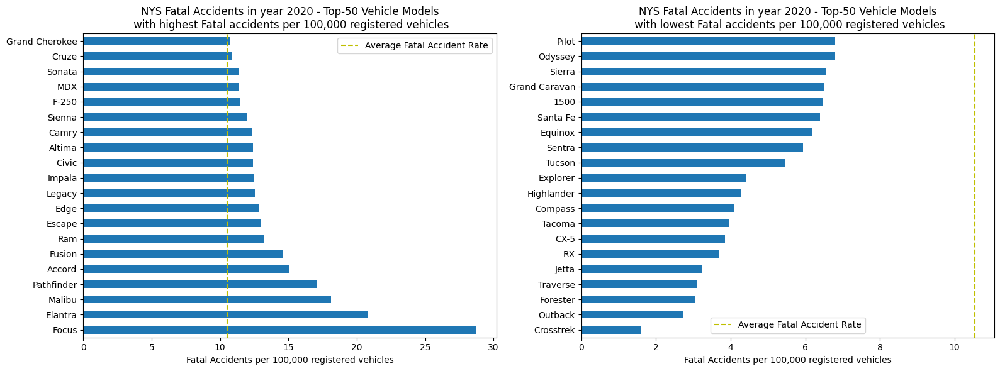

In [124]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,6))

_serToPlot = nysVehRates["NYS_FARS_ALL_RATE"].sort_values(ascending=False).rename(farsCategories["ModelId"])
_serToPlot = _serToPlot.head(min(20,len(_serToPlot)))
#_serToPlot["Other"] = _theTotal - _serToPlot.sum()
_serToPlot.plot.barh(title = "NYS Fatal Accidents in year 2020 - Top-" + str(nydmvNumTopModels) + " Vehicle Models\n with highest Fatal accidents per 100,000 registered vehicles", label="", ax=ax[0])
ax[0].axvline(x=round(nysOverallRate,2),color = "y", linestyle="--", label="Average Fatal Accident Rate")
ax[0].set_xlabel("Fatal Accidents per 100,000 registered vehicles")
ax[0].legend()

_serToPlot = nysVehRates["NYS_FARS_ALL_RATE"].sort_values(ascending=True).rename(farsCategories["ModelId"])
_serToPlot = _serToPlot.head(min(20,len(_serToPlot)))
#_serToPlot["Other"] = _theTotal - _serToPlot.sum()
_serToPlot.plot.barh(title = "NYS Fatal Accidents in year 2020 - Top-" + str(nydmvNumTopModels) + " Vehicle Models\n with lowest Fatal accidents per 100,000 registered vehicles",label="", ax=ax[1])
ax[1].axvline(x=round(nysOverallRate,2),color = "y", linestyle="--",label="Average Fatal Accident Rate")
ax[1].set_xlabel("Fatal Accidents per 100,000 registered vehicles")
ax[1].legend()

plt.tight_layout()
plt.show()


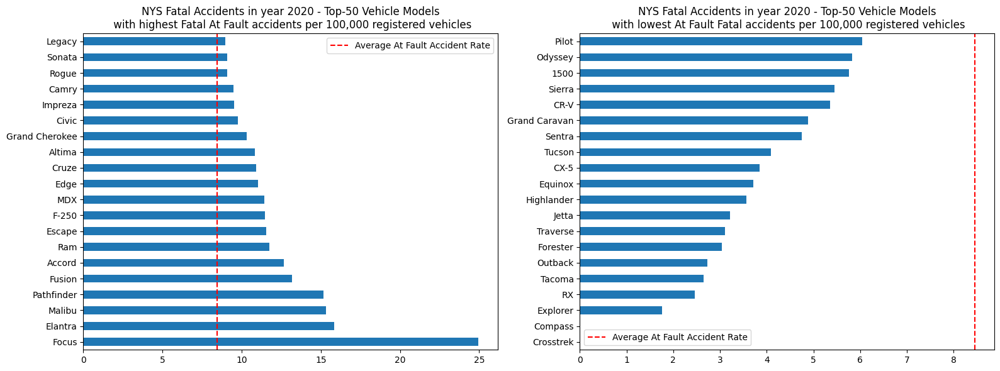

In [126]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,6))

_serToPlot = nysVehRates["NYS_FARS_FAULT_RATE"].sort_values(ascending=False).rename(farsCategories["ModelId"])
_serToPlot = _serToPlot.head(min(20,len(_serToPlot)))
#_serToPlot["Other"] = _theTotal - _serToPlot.sum()
_serToPlot.plot.barh(title = "NYS Fatal Accidents in year 2020 - Top-" + str(nydmvNumTopModels) + " Vehicle Models\n with highest Fatal At Fault accidents per 100,000 registered vehicles",label="",ax=ax[0])
ax[0].axvline(x=round(nysOverallFaultRate,2),color = "r", linestyle="--",label="Average At Fault Accident Rate")
ax[0].legend()

_serToPlot = nysVehRates["NYS_FARS_FAULT_RATE"].sort_values(ascending=True).rename(farsCategories["ModelId"])
_serToPlot = _serToPlot.head(min(20,len(_serToPlot)))
#_serToPlot["Other"] = _theTotal - _serToPlot.sum()
_serToPlot.plot.barh(title = "NYS Fatal Accidents in year 2020 - Top-" + str(nydmvNumTopModels) + " Vehicle Models\n with lowest At Fault Fatal accidents per 100,000 registered vehicles",label="",ax=ax[1])
ax[1].axvline(x=round(nysOverallFaultRate,2),color = "r", linestyle="--",label="Average At Fault Accident Rate")
ax[1].legend()

plt.tight_layout()
plt.show()

## Use NYS Registration to Identify Fatal Accident Rates for Different Vehicle Manufacture Years and Safety Features

Two cases
1. Use all records in FARS
2. Use "Fault" records in FARS

In [155]:
farsYearsNYS = pd.DataFrame()
#farsYearsNYS["NYS_FARS_ALL"] = farsAccVehMergeLight[farsAccVehMergeLight["STATE"]==36]["ModelYear"].value_counts().sort_index()
farsYearsNYS["NYS_FARS_ALL"] = farsAccVehMerge[(farsAccVehMerge["STATE"]==36)]["ModelYear"].value_counts().sort_index()
farsYearsNYSFault = pd.DataFrame()
#farsYearsNYSFault["NYS_FARS_FAULT"] = farsAccVehMergeLight[(farsAccVehMergeLight["STATE"]==36) & farsAccVehMergeLight["Fault"]]["ModelYear"].value_counts().sort_index()
farsYearsNYSFault["NYS_FARS_FAULT"] = farsAccVehMerge[(farsAccVehMerge["STATE"]==36) & farsAccVehMerge["Fault"]]["ModelYear"].value_counts().sort_index()
nydmvYears = pd.DataFrame()
nydmvYears["NYS_REG_ALL"] = nydmvVinDecodeDf["ModelYear"].dropna().astype("int64").value_counts().sort_index()


nysVehYrRates = pd.merge(left=nydmvYears,right=farsYearsNYS,left_index=True,right_index=True,how="outer",sort=False).fillna(0)
nysVehYrRates = pd.merge(left=nysVehYrRates,right=farsYearsNYSFault,left_index=True,right_index=True,how="outer",sort=False).fillna(0)
#nysVehYrRates.index = nysVehYrRates.index.astype("int64")
# calculate rate per 100,000 vehicles
nysVehYrRates["NYS_FARS_ALL_RATE"] = nysVehYrRates["NYS_FARS_ALL"] / nysVehYrRates["NYS_REG_ALL"] * 100000
nysVehYrRates["NYS_FARS_FAULT_RATE"] = nysVehYrRates["NYS_FARS_FAULT"] / nysVehYrRates["NYS_REG_ALL"] * 100000
# keep 2020 and older modles only since Fars is for year 2020
nysVehYrRates = nysVehYrRates.loc[(nysVehYrRates.index < 2020) & (nysVehYrRates.index > 1996)]
nysVehYrRates.info(show_counts=True)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 23 entries, 1997 to 2019
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   NYS_REG_ALL          23 non-null     int64  
 1   NYS_FARS_ALL         23 non-null     float64
 2   NYS_FARS_FAULT       23 non-null     float64
 3   NYS_FARS_ALL_RATE    23 non-null     float64
 4   NYS_FARS_FAULT_RATE  23 non-null     float64
dtypes: float64(4), int64(1)
memory usage: 1.1 KB


In [156]:
nysVehYrRates

,NYS_REG_ALL,NYS_FARS_ALL,NYS_FARS_FAULT,NYS_FARS_ALL_RATE,NYS_FARS_FAULT_RATE
1997,36415,5.0,2.0,13.730606,5.492242
1998,42291,7.0,6.0,16.551985,14.187416
1999,59397,10.0,10.0,16.835867,16.835867
2000,79508,21.0,18.0,26.412436,22.639231
2001,93425,19.0,17.0,20.337169,18.196414
2002,125457,27.0,21.0,21.521318,16.738803
2003,165951,40.0,28.0,24.103500,16.872450
2004,208606,32.0,26.0,15.339923,12.463688
2005,238468,53.0,43.0,22.225204,18.031769
2006,265628,52.0,45.0,19.576249,16.940985


In [163]:
print(tabulate(pd.DataFrame(nysVehYrRates["NYS_FARS_ALL_RATE"].sort_values(ascending=False).head(5)), headers="keys"))
print(tabulate(pd.DataFrame(nysVehYrRates["NYS_FARS_FAULT_RATE"].sort_values(ascending=False).head(5)), headers="keys"))
print(tabulate(pd.DataFrame(nysVehYrRates["NYS_FARS_ALL_RATE"].sort_values(ascending=True).head(5)), headers="keys"))
print(tabulate(pd.DataFrame(nysVehYrRates["NYS_FARS_FAULT_RATE"].sort_values(ascending=True).head(5)), headers="keys"))

        NYS_FARS_ALL_RATE
----  -------------------
2000              26.4124
2003              24.1035
2005              22.2252
2002              21.5213
2001              20.3372
        NYS_FARS_FAULT_RATE
----  ---------------------
2000                22.6392
2001                18.1964
2005                18.0318
2006                16.941
2003                16.8725
        NYS_FARS_ALL_RATE
----  -------------------
2018              9.38001
2017              9.5359
2019              9.64446
2014             10.0642
2013             10.3575
        NYS_FARS_FAULT_RATE
----  ---------------------
1997                5.49224
2017                6.74848
2013                7.0431
2019                7.46298
2018                7.88464


In [158]:
farsSafetyNYS = pd.DataFrame()
farsSafetyNYS["NYS_FARS_ALL"] = farsAccVehMergeLight[farsAccVehMergeLight["STATE"]==36][safetFeatureList + ["AnySafetyFeature"]].sum()
farsSafetyNYS.loc["NoSafetyFeature","NYS_FARS_ALL"] = (farsAccVehMergeLight["STATE"]==36).sum() - farsSafetyNYS.loc["AnySafetyFeature","NYS_FARS_ALL"]
farsSafetyNYSFault = pd.DataFrame()
farsSafetyNYSFault["NYS_FARS_FAULT"] = farsAccVehMerge[(farsAccVehMerge["STATE"]==36) & farsAccVehMerge["Fault"]][safetFeatureList + ["AnySafetyFeature"]].sum()
farsSafetyNYSFault.loc["NoSafetyFeature","NYS_FARS_FAULT"] = ((farsAccVehMergeLight["STATE"]==36) & farsAccVehMerge["Fault"]).sum() - farsSafetyNYSFault.loc["AnySafetyFeature","NYS_FARS_FAULT"]
nydmvSafety = pd.DataFrame()
nydmvSafety["NYS_REG_ALL"] = nydmvVinDecodeDf[safetFeatureList + ["AnySafetyFeature"]].sum()
nydmvSafety.loc["NoSafetyFeature","NYS_REG_ALL"] = len(nydmvVinDecodeDf) - nydmvSafety.loc["AnySafetyFeature","NYS_REG_ALL"]

nysVehStyRates = pd.merge(left=nydmvSafety,right=farsSafetyNYS,left_index=True,right_index=True,how="outer",sort=False).fillna(0)
nysVehStyRates = pd.merge(left=nysVehStyRates,right=farsSafetyNYSFault,left_index=True,right_index=True,how="outer",sort=False).fillna(0)
#nysVehYrRates.index = nysVehYrRates.index.astype("int64")
# calculate rate per 100,000 vehicles
nysVehStyRates["NYS_FARS_ALL_RATE"] = nysVehStyRates["NYS_FARS_ALL"] / nysVehStyRates["NYS_REG_ALL"] * 100000
nysVehStyRates["NYS_FARS_FAULT_RATE"] = nysVehStyRates["NYS_FARS_FAULT"] / nysVehStyRates["NYS_REG_ALL"] * 100000
nysVehStyRates.info(show_counts=True)


<class 'pandas.core.frame.DataFrame'>
Index: 18 entries, AntilockBrakeSystem to NoSafetyFeature
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   NYS_REG_ALL          18 non-null     float64
 1   NYS_FARS_ALL         18 non-null     float64
 2   NYS_FARS_FAULT       18 non-null     float64
 3   NYS_FARS_ALL_RATE    18 non-null     float64
 4   NYS_FARS_FAULT_RATE  18 non-null     float64
dtypes: float64(5)
memory usage: 1.4+ KB


In [161]:
print(tabulate(nysVehStyRates, headers="keys"))

                                     NYS_REG_ALL    NYS_FARS_ALL    NYS_FARS_FAULT    NYS_FARS_ALL_RATE    NYS_FARS_FAULT_RATE
------------------------------  ----------------  --------------  ----------------  -------------------  ---------------------
AntilockBrakeSystem                  3.96684e+06             236               188              5.94933                4.73929
AdaptiveCruiseControl                1.37222e+06              48                34              3.49797                2.47773
AdaptiveDrivingBeam             897612                        47                35              5.23612                3.89923
AutoPedestrianAlertingSound     190366                        11                 6              5.77834                3.15182
BlindSpotWarning                     1.58152e+06              57                48              3.60413                3.03506
CrashImminentBraking                 1.74261e+06              66                51              3.78742        

In [162]:
print(tabulate(pd.DataFrame(nysVehStyRates["NYS_FARS_ALL_RATE"].sort_values(ascending=False).head(5)), headers="keys"))
print(tabulate(pd.DataFrame(nysVehStyRates["NYS_FARS_FAULT_RATE"].sort_values(ascending=False).head(5)), headers="keys"))
print(tabulate(pd.DataFrame(nysVehStyRates["NYS_FARS_ALL_RATE"].sort_values(ascending=True).head(5)), headers="keys"))
print(tabulate(pd.DataFrame(nysVehStyRates["NYS_FARS_FAULT_RATE"].sort_values(ascending=True).head(5)), headers="keys"))

                       NYS_FARS_ALL_RATE
-------------------  -------------------
NoSafetyFeature                 15.3074
AnySafetyFeature                 8.76255
TPMS                             8.34287
DynamicBrakeSupport              6.05222
AntilockBrakeSystem              5.94933
                       NYS_FARS_FAULT_RATE
-------------------  ---------------------
NoSafetyFeature                   12.3515
AnySafetyFeature                   6.99432
TPMS                               6.63841
DynamicBrakeSupport                4.76941
AntilockBrakeSystem                4.73929
                                  NYS_FARS_ALL_RATE
------------------------------  -------------------
PedestrianAutoEmergencyBraking              3.05831
ForwardCollisionWarning                     3.21866
LaneDepartureWarning                        3.32718
LaneKeepingAssistance                       3.43738
AdaptiveCruiseControl                       3.49797
                                  NYS_FARS_FAULT_R

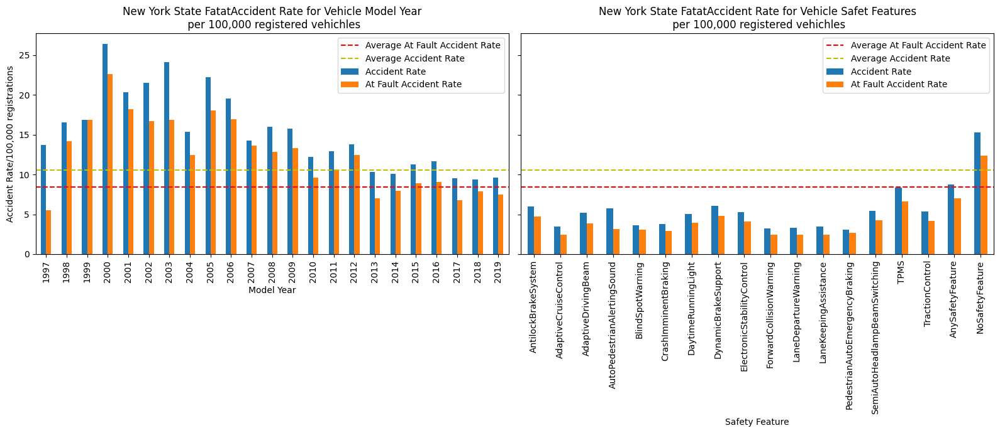

In [160]:
#fig, ax = plt.subplots(figsize=(10,5))
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,7))

nysVehYrRates[["NYS_FARS_ALL_RATE","NYS_FARS_FAULT_RATE"]].rename(columns={"NYS_FARS_ALL_RATE":"Accident Rate","NYS_FARS_FAULT_RATE":"At Fault Accident Rate"}).plot.bar(stacked=False,ax=ax[0])
ax[0].set_xlabel("Model Year")
ax[0].set_ylabel("Accident Rate/100,000 registrations")
ax[0].set_title("New York State FatatAccident Rate for Vehicle Model Year\n per 100,000 registered vehichles")
ax[0].axhline(y=round(nysOverallFaultRate,2),color = "r", linestyle="--",label="Average At Fault Accident Rate")
ax[0].axhline(y=round(nysOverallRate,2),color = "y", linestyle="--",label="Average Accident Rate")
ax[0].legend()

ax[1].sharey(ax[0])

#fig, ax = plt.subplots(figsize=(10,5))
nysVehStyRates[["NYS_FARS_ALL_RATE","NYS_FARS_FAULT_RATE"]].rename(columns={"NYS_FARS_ALL_RATE":"Accident Rate","NYS_FARS_FAULT_RATE":"At Fault Accident Rate"}).plot.bar(stacked=False,ax=ax[1])
ax[1].set_xlabel("Safety Feature")
ax[1].set_ylabel("Accident Rate/100,000 registrations")
ax[1].set_title("New York State FatatAccident Rate for Vehicle Safet Features\n per 100,000 registered vehichles")
ax[1].axhline(y=round(nysOverallFaultRate,2),color = "r", linestyle="--",label="Average At Fault Accident Rate")
ax[1].axhline(y=round(nysOverallRate,2),color = "y", linestyle="--",label="Average Accident Rate")
ax[1].legend()

plt.tight_layout()
plt.show()

# Accident Risk Reduction based on Induced exposure metrics

Measure|Formula
-- | --
Risk |               $R = \frac{S_f}{S_n}/\frac{N_f}{N_n}$
Effectiveness (%) |  $E = (1 - R)$
Std Error in log odds ratio | $\sigma_{ln(R)} = \sqrt{\frac{1}{S_f} + \frac{1}{S_n} + \frac{1}{N_f} + \frac{1}{N_n}}$
Effectiveness lower limit (95% cofidence) |  $E_{lower} = 1 - e^{(ln(R) + 1.64\sigma_{ln(R)})}$
Effectiveness upper limit (95% cofidence) | $E_{upper} = 1 - e^{(ln(R) - 1.64\sigma_{ln(R)})}$

* $S_f = $ Fault accidents with Safety Feature present
* $S_n = $ Not-fault accidents with Safety Feature present
* $N_f = $ Fault accidents without Feature present
* $N_n = $ Not-fault accidents without Safety Feature present


Based on 
* [3] LEONARD EVANS (1999) Antilock Brake Systems and Risk of Different Types of Crashes in Traffic, Traffic Injury Prevention, 1:1, 5-23, DOI: 10.1080/10286589908915737
* [4] Simon Sternlund, Johan Strandroth, Matteo Rizzi, Anders Lie & Claes Tingvall (2017) The effectiveness of lane departure warning systems—A reduction in real-world passenger car injury crashes, Traffic Injury Prevention, 18:2, 225-229, DOI: 10.1080/15389588.2016.1230672



In [111]:
safetFeatureListToCheck = ["AnySafetyFeature"] + safetFeatureList
roadConditionsToCheck = ["RUR_URB","FUNC_SYS", "VNUM_LAN","VSPD_LIM_GRP", "LGT_COND","WEATHER","VSURCOND"]
driverConditionsToCheck = ["DR_DRINK","SEX", "AGE_GRP", 'L_STATUS', 'L_TYPE', 'PREV_ACC_OR_INF','PREV_ACC', 'PREV_DWI', 'PREV_SPD', 'PREV_OTH', ]

#farsAccVehMergeLight.info(show_counts=True)

In [112]:
import matplotlib.transforms as mtransforms

def CalculateEffectiveness(farsAccVehMergeSub, title = "", plotIt = True, minSamples = 100, minHits = 10, styFeatures = safetFeatureListToCheck, lambda_f = 1.64):
    """
    Calculate Safety Feature effectivenes from Accident Dataframe
    minSample is used to only do the calculation with enough rows in the dataset
    minHits is used to skip calculation for specific fetures with a very low count for SN or SF whic resutls in large delta Error 
    """
    farsRiskGrpAgg = farsAccVehMergeSub[styFeatures+["Fault"]].groupby(["Fault"]).agg(["count","sum"]).rename(index={True:"Fault",False:"NotFault"})

    # S(f,n) = [*]["sum"]
    # N(f,n) = [*]["count"] - [*]["sum"]

    tot = farsRiskGrpAgg.swaplevel(axis=1)["count"].transpose()
    S = farsRiskGrpAgg.swaplevel(axis=1)["sum"].transpose()
    N = (tot - farsRiskGrpAgg.swaplevel(axis=1)["sum"].transpose())

    badfeaturesIdx = ((tot[(tot["Fault"] < minSamples) | (tot["NotFault"] < minSamples)])).index
    S = S.drop(index = badfeaturesIdx)
    N = N.drop(index = badfeaturesIdx)
    badfeaturesIdx = ((N[(S["Fault"] < minHits) | (S["NotFault"] < minHits) | (N["NotFault"] < minHits) | (N["Fault"] < minHits)])).index
    S = S.drop(index = badfeaturesIdx)
    N = N.drop(index = badfeaturesIdx)

    R = (S["Fault"]/S["NotFault"])/(N["Fault"]/N["NotFault"])
    E = (1 - R)*100
    # error
    lsigmalnR = np.sqrt(1/S["Fault"] + 1/S["NotFault"] + 1/N["Fault"] + 1/N["NotFault"])*lambda_f
    DElow = (1-np.exp(np.log(R) - lsigmalnR))*100 - E
    DEhigh = E - (1-np.exp(np.log(R) + lsigmalnR))*100
    deltaE = pd.DataFrame([DElow,DEhigh])

    if plotIt and len(E) > 0:
        #fig, ax = plt.subplots(figsize=(8,8))
        fig, ax = plt.subplots()
        bars = ax.barh(E.index, E.values, xerr = deltaE.values, align='center', alpha=0.5, ecolor='black', capsize=5)
        ax.set_xlabel("Effectiveness (%)")
        ax.set_ylabel("Safety Feature")
        ax.set_title(title)
        trans_offset = mtransforms.offset_copy(ax.transData, fig=fig,x=0.05, y=+0.07, units='inches')
        ax.tick_params(labelsize="small")
        for i in range(len(E)):
            plt.text(x= E[i],y= i,s= np.round(E[i],1), c='b', transform=trans_offset)
        ax.xaxis.grid(True)
        plt.tight_layout()
        plt.show()
    
    return pd.DataFrame({"E" : E, "DElow": DElow, "DEhigh": DEhigh,  "R" : R, "SF" : S["Fault"], "SN" : S["NotFault"], "NF" : N["Fault"], "NN" : N["NotFault"]})




## Compare overall effectiveness year over year (regardless of safety features)

In [113]:
import matplotlib.transforms as mtransforms

def CalculateEffectivenessModelYear(farsAccVehMergeSub=farsAccVehMerge, title="Overall Effectiveness based on Model Year vs Previous Model Years", printIt = True, plotIt = True, minSamples = 100, minHits = 10, ax_in=None, fig_in=None, lambda_f = 1.64):
    """
    Calculate a Mode Year's effectiveness vs all Previous Years
    """

    farsRiskGrpAgg = pd.DataFrame(farsAccVehMergeSub[["ModelYear","Fault"]].groupby(["ModelYear","Fault"]).size().rename(index={True:"Fault",False:"NotFault"},level=1)).unstack()[0].sort_index(ascending=True)

    farsRiskGrpAgg["Total"] = farsRiskGrpAgg.sum(axis=1)

    EDct = {}

    for _year in farsRiskGrpAgg.sort_index().index:
        if _year == min(farsRiskGrpAgg.index):
            # skip the first year
            continue
        # N = entries on model years prior
        # S = entries for model year=_year
        N = farsRiskGrpAgg[farsRiskGrpAgg.index < _year].sum()
        S = farsRiskGrpAgg.loc[_year]
        

        if (N["Total"] < minSamples) or (S["Total"] < minSamples):
            # if not enough samples skip to next year
            continue
        elif (S["Fault"] < minHits) or (S["NotFault"] < minHits) or (N["NotFault"] < minHits) or (N["Fault"] < minHits):
            # if too few Faults or NotFaults skip to next year
            continue

        R = (S["Fault"]/S["NotFault"])/(N["Fault"]/N["NotFault"])
        E = (1 - R)*100
        # error
        lsigmalnR = np.sqrt(1/S["Fault"] + 1/S["NotFault"] + 1/N["Fault"] + 1/N["NotFault"])*lambda_f
        DElow = (1-np.exp(np.log(R) - lsigmalnR))*100 - E
        DEhigh = E - (1-np.exp(np.log(R) + lsigmalnR))*100
        #deltaE = pd.DataFrame([DElow,DEhigh])
        EDct[_year] = {"E" : E, "DElow": DElow, "DEhigh": DEhigh,  "R" : R, "SF" : S["Fault"], "SN" : S["NotFault"], "NF" : N["Fault"], "NN" : N["NotFault"]}
    
    EDf = pd.DataFrame(EDct).transpose()

    if printIt:
        print(title)
        print(tabulate(EDf,headers="keys"))

    if plotIt and len(EDf) > 0:
        if (ax_in == None) or (fig_in == None):
            fig, ax = plt.subplots(figsize=(8,8))
        else:
            ax = ax_in
            fig = fig_in
        #fig, ax = plt.subplots()
        bars = ax.barh(EDf.index.format(), EDf["E"].values, xerr = EDf[["DElow","DEhigh"]].values.transpose(), align='center', alpha=0.5, ecolor='black', capsize=5)
        ax.set_xlabel("Effectiveness (%)")
        ax.set_ylabel("Model Year")
        ax.set_title(title)
        trans_offset = mtransforms.offset_copy(ax.transData, fig=fig,x=0.05, y=+0.07, units='inches')
        ax.tick_params(labelsize="small")
        _yticks = ax.get_yticklabels()
        for i in range(len(EDf)):
            # find index
            for j in range(len(_yticks)):
                if str(EDf["E"].index[i]) == _yticks[j].get_text():
                    # value of j is value of the desired position
                    break
            plt.text(x= EDf["E"].values[i],y= j,s= np.round(EDf["E"].values[i],1), c='b', transform=trans_offset)
            #print(title,"plt.text.",EDf["E"].values[i],i)
        ax.xaxis.grid(True)
        if (ax_in == None):
            plt.tight_layout()
            plt.show()
    
    return EDf




Overall Effectiveness based on Model Year vs 
Previous Model Years (all Vehicles)
              E     DElow    DEhigh         R    SF    SN     NF     NN
----  ---------  --------  --------  --------  ----  ----  -----  -----
1991   12.5246   28.7337   42.7888   0.874754    79    32    254     90
1992  -38.1725   41.469    59.252    1.38172    132    35    333    122
1993   18.8588   20.452    27.3443   0.811412   149    62    465    157
1994  -10.7297   25.6986   33.4654   1.1073     208    67    614    219
1995  -43.8465   31.8253   40.8669   1.43846    277    67    822    286
1996   -4.5771   21.1302   26.4807   1.04577    280    86   1099    353
1997  -42.5517   25.0037   30.3223   1.42552    506   113   1379    439
1998    3.52509  14.8182   17.5072   0.964749   537   163   1885    552
1999   -3.25307  14.058    16.2737   1.03253    731   209   2422    715
2000   -2.29459  12.4089   14.1219   1.02295    932   267   3153    924
2001   -9.30788  12.4508   14.0513   1.09308   1091   

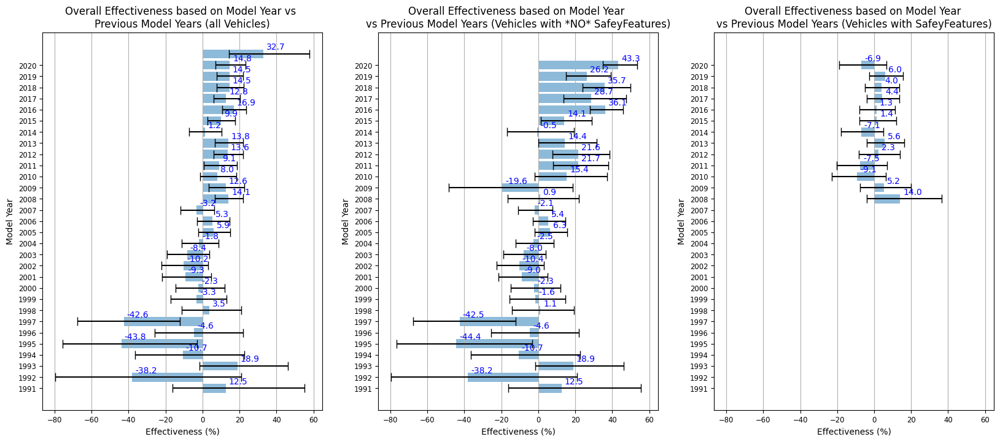

In [114]:
# year over year comparison of effectiveness
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20,8))
_ = CalculateEffectivenessModelYear(title="Overall Effectiveness based on Model Year vs \nPrevious Model Years (all Vehicles)",ax_in=ax[0],fig_in=fig)
ax[1].sharex(ax[0])
ax[2].sharex(ax[0])
ax[1].sharey(ax[0])
ax[2].sharey(ax[0])
_ = CalculateEffectivenessModelYear(farsAccVehMerge[farsAccVehMerge["AnySafetyFeature"]==False],title="Overall Effectiveness based on Model Year \nvs Previous Model Years (Vehicles with *NO* SafeyFeatures)",ax_in=ax[1],fig_in=fig)
_ = CalculateEffectivenessModelYear(farsAccVehMerge[farsAccVehMerge["AnySafetyFeature"]==True],title="Overall Effectiveness based on Model Year \nvs Previous Model Years (Vehicles with SafeyFeatures)",ax_in=ax[2],fig_in=fig)
#plt.tight_layout()
plt.show()


## Check safety feature effectiveness for Vehicles involved in fatal accidents

1. Any vehicle, any accident condition
2. Any vehicle, each accident condition
3. Any vehicle, each driver condition
4. Top vehicles, any accident condition
5. For each model Year

Overall Safety Feature Effectiveness --------------------


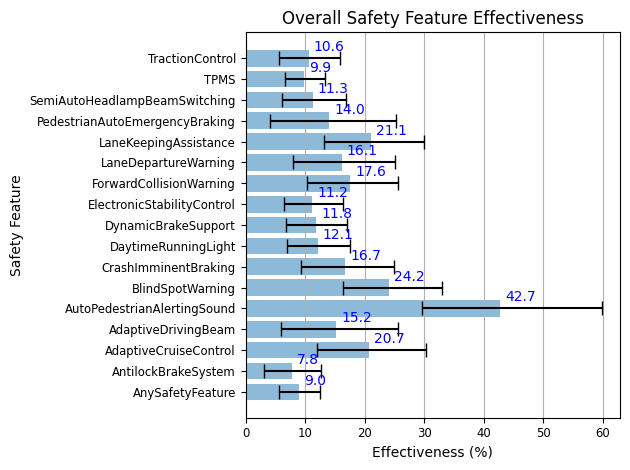

                                       E     DElow    DEhigh         R     SF    SN     NF     NN
------------------------------  --------  --------  --------  --------  -----  ----  -----  -----
AnySafetyFeature                 8.97738   3.31249   3.43759  0.910226  14862  4888  18155   5435
AntilockBrakeSystem              7.75763   4.67473   4.92429  0.922424   4654  1559  28363   8764
AdaptiveCruiseControl           20.6821    8.62751   9.68047  0.793179    740   290  32277  10033
AdaptiveDrivingBeam             15.2274    9.21887  10.3437   0.847726    776   285  32241  10038
AutoPedestrianAlertingSound     42.7391   13.1817   17.1236   0.572609    112    61  32905  10262
BlindSpotWarning                24.1521    7.8852    8.80006  0.758479    792   324  32225   9999
CrashImminentBraking            16.7345    7.48176   8.22039  0.832655   1164   434  31853   9889
DaytimeRunningLight             12.0807    5.18646   5.5116   0.879193   3122  1096  29895   9227
DynamicBrakeSupport 

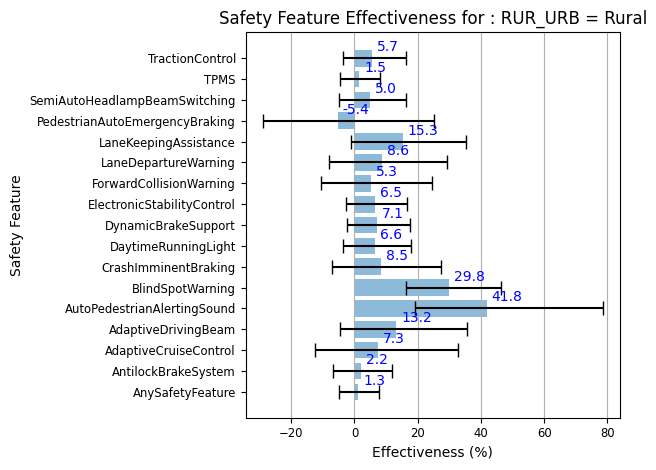

                                       E     DElow    DEhigh         R    SF    SN     NF    NN
------------------------------  --------  --------  --------  --------  ----  ----  -----  ----
AnySafetyFeature                 1.26617   6.06195   6.45848  0.987338  5399  1336   9111  2226
AntilockBrakeSystem              2.17432   8.87903   9.76538  0.978257  1682   421  12828  3141
AdaptiveCruiseControl            7.32727  19.9254   25.3829   0.926727   223    59  14287  3503
AdaptiveDrivingBeam             13.1766   17.8847   22.5245   0.868234   234    66  14276  3496
AutoPedestrianAlertingSound     41.8066   22.5325   36.7698   0.581934    38    16  14472  3546
BlindSpotWarning                29.8028   13.3666   16.5105   0.701972   239    83  14271  3479
CrashImminentBraking             8.4687   15.6992   18.9493   0.915313   370    99  14140  3463
DaytimeRunningLight              6.55892  10.0874   11.3082   0.934411  1079   282  13431  3280
DynamicBrakeSupport              7.10769

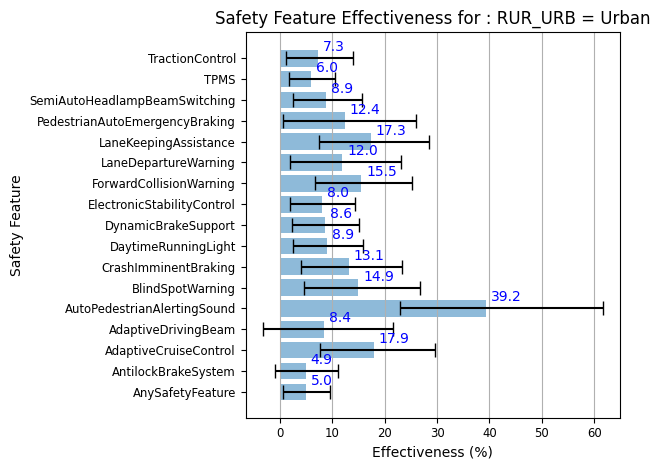

                                       E     DElow    DEhigh         R    SF    SN     NF    NN
------------------------------  --------  --------  --------  --------  ----  ----  -----  ----
AnySafetyFeature                 4.95318   4.36804   4.57846  0.950468  9265  3486   8867  3171
AntilockBrakeSystem              4.94556   5.83044   6.21144  0.950544  2903  1112  15229  5545
AdaptiveCruiseControl           17.8906   10.2862   11.7593   0.821094   504   224  17628  6433
AdaptiveDrivingBeam              8.37154  11.6262   13.3157   0.916285   528   211  17604  6446
AutoPedestrianAlertingSound     39.246    16.3672   22.4024   0.60754     73    44  18059  6613
BlindSpotWarning                14.9397   10.3981   11.8463   0.850603   545   234  17587  6423
CrashImminentBraking            13.1242    9.13055  10.2029   0.868758   774   325  17358  6332
DaytimeRunningLight              8.94732   6.42016   6.90719  0.910527  1998   797  16134  5860
DynamicBrakeSupport              8.56782

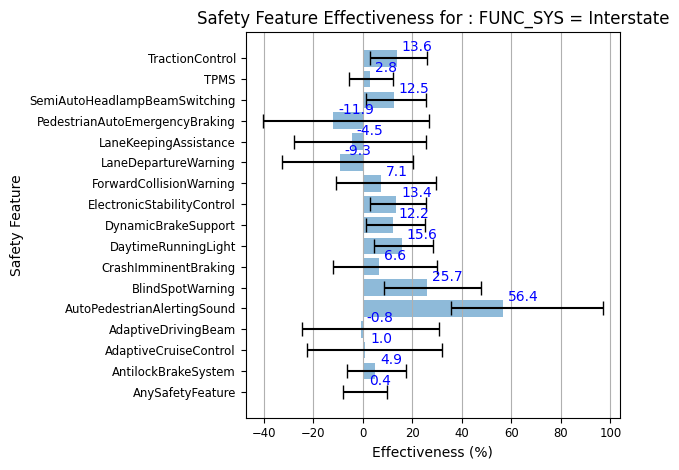

                                         E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ----------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                  0.376867   8.55919   9.36367  0.996231  1828   868  2393  1132
AntilockBrakeSystem               4.86531   11.1261   12.5996   0.951347   619   306  3602  1694
AdaptiveCruiseControl             0.954258  23.6349   31.0424   0.990457   115    55  4106  1945
AdaptiveDrivingBeam              -0.817384  24.0013   31.5006   1.00817    117    55  4104  1945
AutoPedestrianAlertingSound      56.423     21.01     40.5704   0.43577     12    13  4209  1987
BlindSpotWarning                 25.6822    17.0108   22.0601   0.743178   106    67  4115  1933
CrashImminentBraking              6.60359   18.5737   23.1843   0.933964   170    86  4051  1914
DaytimeRunningLight              15.6241    11.0853   12.7619   0.843759   430   237  3791  1763
DynamicBrakeSupport           

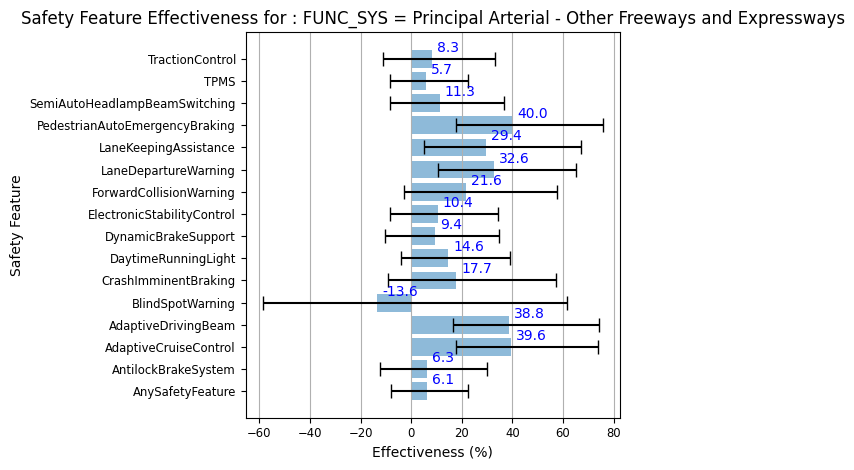

                                        E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                  6.05571  14.0638   16.5399  0.939443   653   301   672   291
AntilockBrakeSystem               6.29242  18.8344   23.5721  0.937076   197    93  1128   499
AdaptiveCruiseControl            39.5511   21.8141   34.1309  0.604489    33    24  1292   568
AdaptiveDrivingBeam              38.774    22.4142   35.3585  0.61226     32    23  1293   569
BlindSpotWarning                -13.5768   45.1552   74.9556  1.13577     38    15  1287   577
CrashImminentBraking             17.7197   26.7538   39.6443  0.822803    52    28  1273   564
DaytimeRunningLight              14.6486   18.8788   24.2405  0.853514   144    74  1181   518
DynamicBrakeSupport               9.39625  19.7049   25.1816  0.906038   156    76  1169   516
ElectronicStabilityControl       10.3862   18.79  

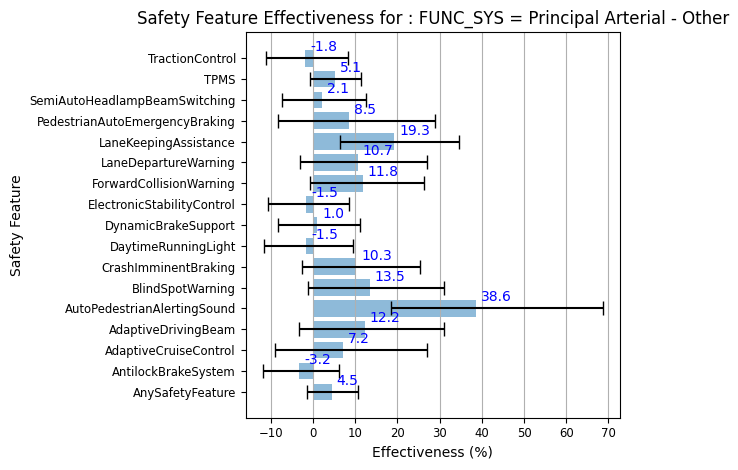

                                        E     DElow    DEhigh         R    SF    SN     NF    NN
------------------------------  ---------  --------  --------  --------  ----  ----  -----  ----
AnySafetyFeature                 4.48557    5.85093   6.23273  0.955144  4934  1825   5211  1841
AntilockBrakeSystem             -3.21123    8.66835   9.46313  1.03211   1586   558   8559  3108
AdaptiveCruiseControl            7.21719   16.293    19.7636   0.927828   265   103   9880  3563
AdaptiveDrivingBeam             12.2433    15.5159   18.8484   0.877567   251   103   9894  3563
AutoPedestrianAlertingSound     38.61      20.1921   30.0888   0.6139      46    27  10099  3639
BlindSpotWarning                13.5117    14.649    17.6361   0.864883   274   114   9871  3552
CrashImminentBraking            10.2953    12.8791   15.0381   0.897047   409   164   9736  3502
DaytimeRunningLight             -1.53205    9.98457  11.0735   1.01532   1066   380   9079  3286
DynamicBrakeSupport           

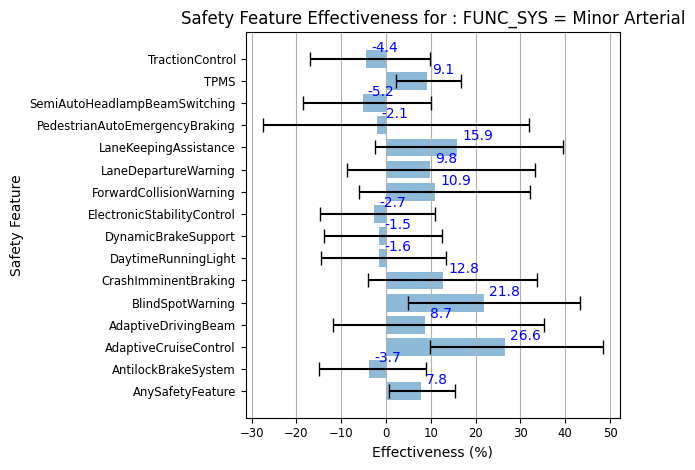

                                       E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  --------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                 7.78135   7.08988   7.68035  0.922187  3409  1048  4000  1134
AntilockBrakeSystem             -3.70375  11.2967   12.6778   1.03704   1058   302  6351  1880
AdaptiveCruiseControl           26.629    16.8015   21.7916   0.73371    143    57  7266  2125
AdaptiveDrivingBeam              8.69681  20.5644   26.5427   0.913032   174    56  7235  2126
BlindSpotWarning                21.815    16.9103   21.5772   0.78185    171    64  7238  2118
CrashImminentBraking            12.7953   16.9277   21.0051   0.872047   238    80  7171  2102
DaytimeRunningLight             -1.57534  12.9795   14.8811   1.01575    706   205  6703  1977
DynamicBrakeSupport             -1.53739  12.3035   14        1.01537    802   233  6607  1949
ElectronicStabilityControl      -2.6855   12.0774 

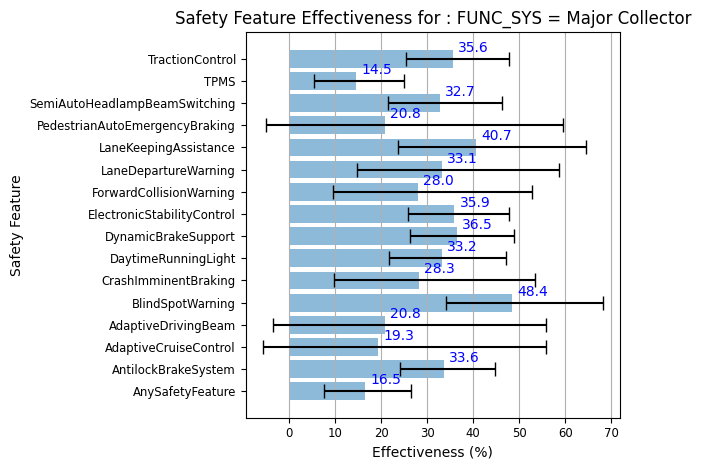

                                      E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  -------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                16.4755   8.9363    10.0069  0.835245  1943   460  2923   578
AntilockBrakeSystem             33.5974   9.59329   11.2133  0.664026   560   170  4306   868
AdaptiveCruiseControl           19.3167  25.1184    36.4734  0.806833    95    25  4771  1013
AdaptiveDrivingBeam             20.8317  24.2978    35.0574  0.791683    97    26  4769  1012
BlindSpotWarning                48.4415  14.2988    19.7861  0.515585    91    37  4775  1001
CrashImminentBraking            28.2622  18.6179    25.1433  0.717378   136    40  4730   998
DaytimeRunningLight             33.2051  11.4676    13.8445  0.667949   357   110  4509   928
DynamicBrakeSupport             36.5435  10.2597    12.2384  0.634565   402   129  4464   909
ElectronicStabilityControl      35.9151  10.0186    11.8751 

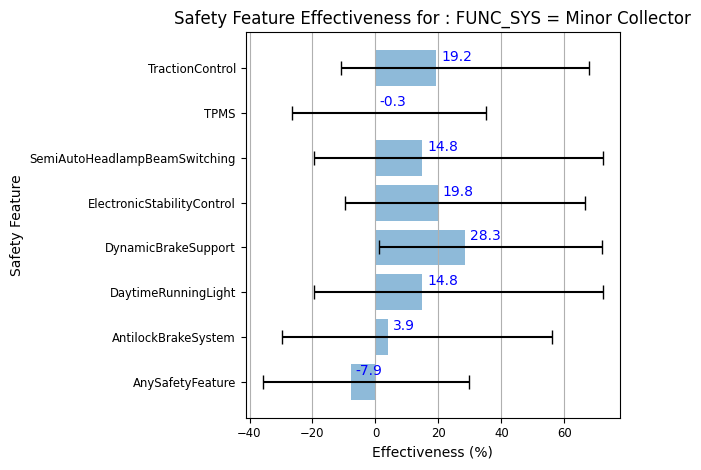

                                       E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               -7.88613   27.935    37.6955  1.07886    367    53   629    98
AntilockBrakeSystem             3.92782   33.7453   52.0159  0.960722   121    19   875   132
DaytimeRunningLight            14.8006    34.3135   57.4518  0.851994    74    13   922   138
DynamicBrakeSupport            28.3088    27.0986   43.5662  0.716912    78    16   918   135
ElectronicStabilityControl     19.7814    29.5169   46.7007  0.802186    92    17   904   134
SemiAutoHeadlampBeamSwitching  14.8006    34.3135   57.4518  0.851994    74    13   922   138
TPMS                           -0.270761  26.197    35.4619  1.00271    337    51   659   100
TractionControl                19.245     30.3364   48.5894  0.80755     87    16   909   135


FUNC_SYS 7 SIZE:  3890 --------------------


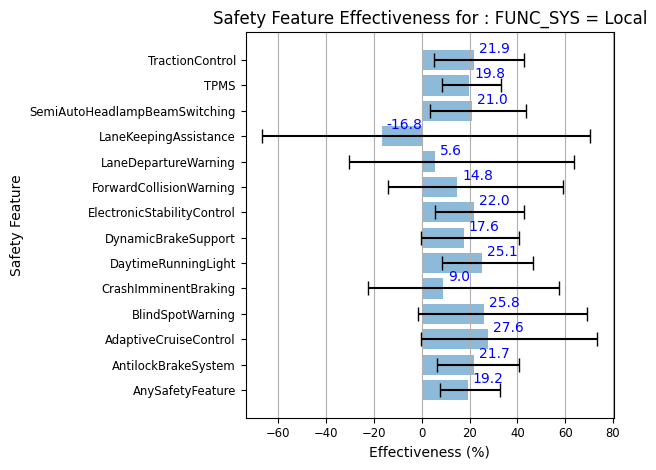

                                       E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                19.1605   11.4889   13.3921  0.808395  1392   250  1963   285
AntilockBrakeSystem             21.698    15.2713   18.9713  0.78302    406    80  2949   455
AdaptiveCruiseControl           27.6295   28.0353   45.7633  0.723705    64    14  3291   521
BlindSpotWarning                25.8289   27.2646   43.1122  0.741711    75    16  3280   519
CrashImminentBraking             9.02863  31.5626   48.3312  0.909714   103    18  3252   517
DaytimeRunningLight             25.1253   16.6744   21.4516  0.748747   275    57  3080   478
DynamicBrakeSupport             17.5728   18.0086   23.043   0.824272   311    59  3044   476
ElectronicStabilityControl      21.9579   16.3773   20.727   0.780421   332    66  3023   469
ForwardCollisionWarning         14.8446   29.0414   44.0715 

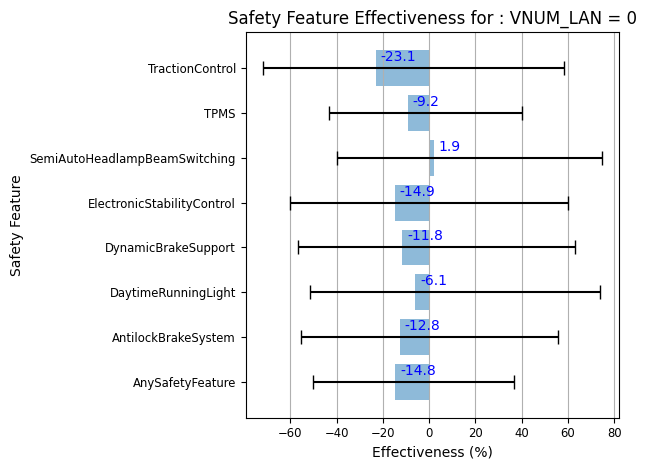

                                       E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               -14.8148   35.601    51.6011  1.14815     59   108    59   124
AntilockBrakeSystem            -12.7856   42.5947   68.443   1.12786     23    41    95   191
DaytimeRunningLight             -6.10264  45.5532   79.8242  1.06103     15    28   103   204
DynamicBrakeSupport            -11.7647   44.7369   74.5959  1.11765     19    34    99   198
ElectronicStabilityControl     -14.8688   45.3656   74.9762  1.14869     20    35    98   197
SemiAutoHeadlampBeamSwitching    1.94175  41.7841   72.8092  0.980583    15    30   103   202
TPMS                            -9.24731  33.9188   49.1918  1.09247     56   105    62   127
TractionControl                -23.0674   48.9362   81.2405  1.23067     20    33    98   199


VNUM_LAN 1 SIZE:  586 --------------------


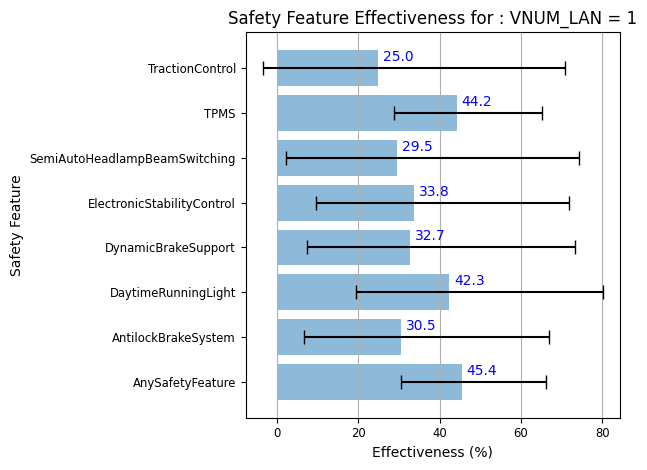

                                     E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               45.4418  15.0038   20.695   0.545582   191    81   255    59
AntilockBrakeSystem            30.5295  23.9181   36.4768  0.694705    61    26   385   114
DaytimeRunningLight            42.2817  22.8792   37.9043  0.577183    35    18   411   122
DynamicBrakeSupport            32.6683  25.3593   40.6812  0.673317    45    20   401   120
ElectronicStabilityControl     33.7989  24.1855   38.1074  0.662011    49    22   397   118
SemiAutoHeadlampBeamSwitching  29.538   27.3857   44.7962  0.70462     42    18   404   122
TPMS                           44.1769  15.3091   21.0939  0.558231   184    78   262    62
TractionControl                24.9835  28.469    45.8809  0.750165    47    19   399   121


VNUM_LAN 2 SIZE:  26833 --------------------


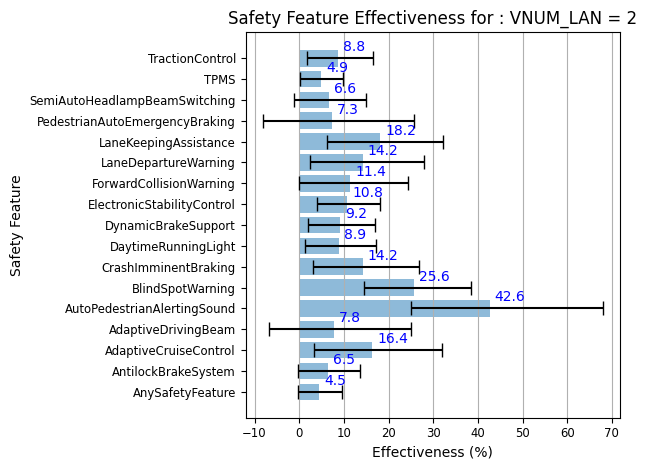

                                       E     DElow    DEhigh         R    SF    SN     NF    NN
------------------------------  --------  --------  --------  --------  ----  ----  -----  ----
AnySafetyFeature                 4.54      4.70113   4.94464  0.9546    8879  2304  12543  3107
AntilockBrakeSystem              6.471     6.63871   7.14593  0.93529   2708   725  18714  4686
AdaptiveCruiseControl           16.3899   13.0619   15.4803   0.836101   412   124  21010  5287
AdaptiveDrivingBeam              7.82529  14.5287   17.2472   0.921747   435   119  20987  5292
AutoPedestrianAlertingSound     42.6452   17.5881   25.367    0.573548    66    29  21356  5382
BlindSpotWarning                25.6103   11.002    12.9116   0.743897   427   144  20995  5267
CrashImminentBraking            14.2267   11.0566   12.6927   0.857733   645   189  20777  5222
DaytimeRunningLight              8.89643   7.63161   8.32935  0.911036  1789   492  19633  4919
DynamicBrakeSupport              9.23745

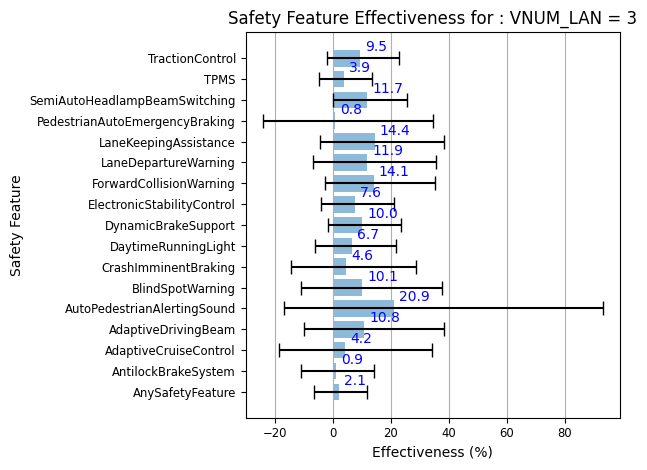

                                        E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ---------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                 2.09755    8.76843   9.63101  0.979024  2023   899  1979   861
AntilockBrakeSystem              0.935599  11.7924   13.3858   0.990644   652   289  3350  1471
AdaptiveCruiseControl            4.17311   22.7672   29.862    0.958269   120    55  3882  1705
AdaptiveDrivingBeam             10.8473    20.91     27.3169   0.891527   118    58  3884  1702
AutoPedestrianAlertingSound     20.9337    37.7294   72.1663   0.790663    18    10  3984  1750
BlindSpotWarning                10.0686    21.0679   27.5134   0.899314   119    58  3883  1702
CrashImminentBraking             4.64722   19.2402   24.1039   0.953528   176    81  3826  1679
DaytimeRunningLight              6.66778   12.8712   14.9302   0.933322   432   202  3570  1558
DynamicBrakeSupport             10.0265 

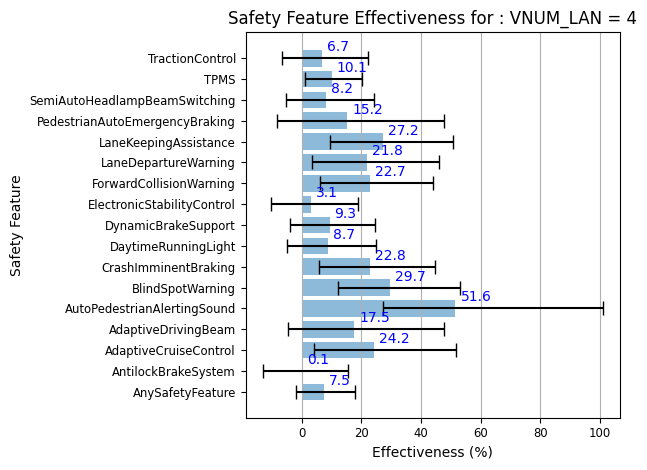

                                         E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ----------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                 7.49707     9.32344   10.3685  0.925029  1693   712  1622   631
AntilockBrakeSystem              0.0821256  13.2319    15.2517  0.999179   555   225  2760  1118
AdaptiveCruiseControl           24.1836     20.2391    27.6094  0.758164    83    44  3232  1299
AdaptiveDrivingBeam             17.4992     22.1956    30.3648  0.825008    86    42  3229  1301
AutoPedestrianAlertingSound     51.5713     24.481     49.5071  0.484287    12    10  3303  1333
BlindSpotWarning                29.746      17.5476    23.3897  0.70254     93    53  3222  1290
CrashImminentBraking            22.8259     17.0298    21.8517  0.771741   133    69  3182  1274
DaytimeRunningLight              8.74509    13.7136    16.1389  0.912549   378   166  2937  1177
DynamicBrakeSupport           

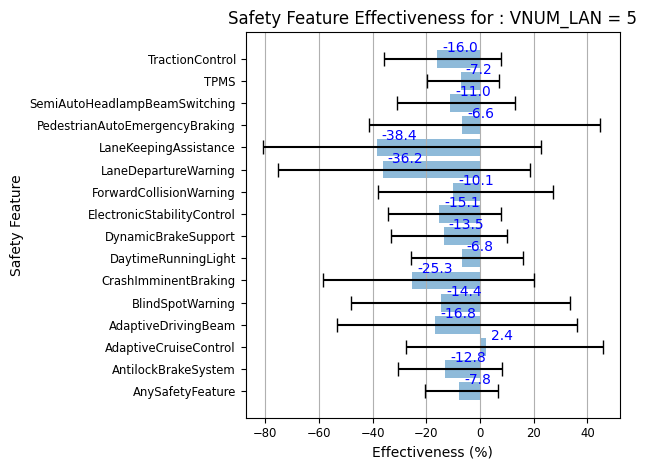

                                        E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                 -7.79429  12.6661   14.3525  1.07794   1422   494  1191   446
AntilockBrakeSystem             -12.8384   17.6804   20.9655  1.12838    449   146  2164   794
AdaptiveCruiseControl             2.42694  30.044    43.4107  0.975731    76    28  2537   912
AdaptiveDrivingBeam             -16.7625   36.3891   52.8643  1.16762     84    26  2529   914
BlindSpotWarning                -14.4427   33.7373   47.8405  1.14443     95    30  2518   910
CrashImminentBraking            -25.2831   33.287    45.3312  1.25283    131    38  2482   902
DaytimeRunningLight              -6.77386  18.7897   22.8024  1.06774    321   109  2292   831
DynamicBrakeSupport             -13.5435   19.5329   23.5914  1.13543    354   114  2259   826
ElectronicStabilityControl      -15.1288   19.2126

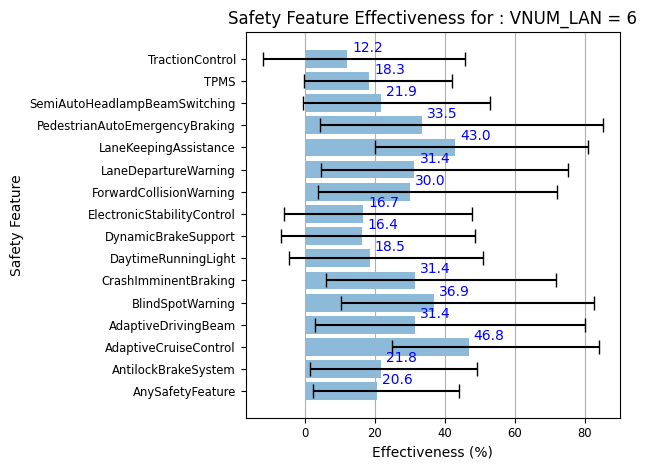

                                      E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                20.5599  18.1065   23.4519  0.794401   319   151   242    91
AntilockBrakeSystem             21.7653  20.2856   27.3868  0.782347   113    59   448   183
AdaptiveCruiseControl           46.7988  21.9593   37.3942  0.532012    23    18   538   224
AdaptiveDrivingBeam             31.3551  28.5259   48.8089  0.686449    26    16   535   226
BlindSpotWarning                36.8715  26.5257   45.7485  0.631285    24    16   537   226
CrashImminentBraking            31.4286  25.4105   40.3707  0.685714    36    22   525   220
DaytimeRunningLight             18.5263  23.1422   32.3235  0.814737    86    44   475   198
DynamicBrakeSupport             16.4179  23.3338   32.3709  0.835821    92    46   469   196
ElectronicStabilityControl      16.7028  22.6333   31.0776  0.832972  

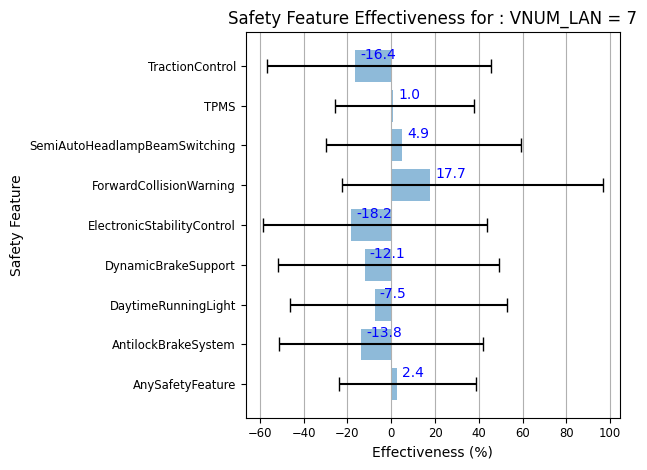

                                        E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  ----------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                 2.41009   26.4796   36.3399  0.975899   188    93   145    70
AntilockBrakeSystem            -13.761     37.4645   55.861   1.13761     68    30   265   133
DaytimeRunningLight             -7.5434    38.7368   60.5448  1.07543     50    23   283   140
DynamicBrakeSupport            -12.0968    39.6767   61.4144  1.12097     54    24   279   139
ElectronicStabilityControl     -18.1702    40.5876   61.8212  1.1817      61    26   272   137
ForwardCollisionWarning         17.6899    40.3279   79.0666  0.823101    17    10   316   153
SemiAutoHeadlampBeamSwitching    4.8913    34.6497   54.5077  0.951087    45    23   288   140
TPMS                             0.990538  26.7415   36.6367  0.990095   181    89   152    74
TractionControl                -16.4218    40.5405

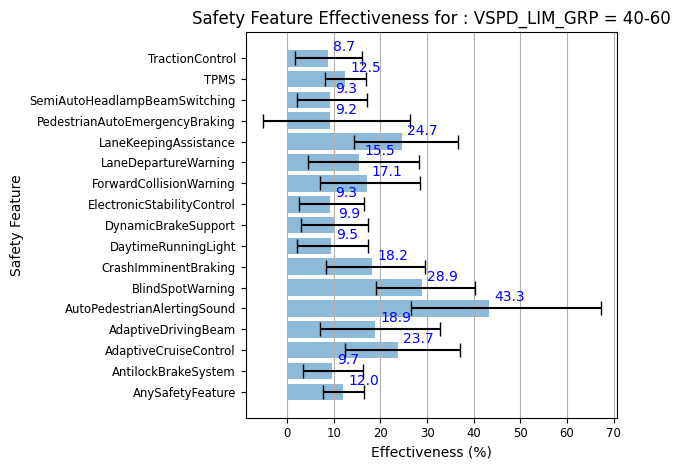

                                       E     DElow    DEhigh         R    SF    SN     NF    NN
------------------------------  --------  --------  --------  --------  ----  ----  -----  ----
AnySafetyFeature                12.0108    4.31006   4.53206  0.879892  8520  2636  10594  2884
AntilockBrakeSystem              9.69601   6.18793   6.64314  0.90304   2608   822  16506  4698
AdaptiveCruiseControl           23.669    11.3305   13.3056   0.76331    391   147  18723  5373
AdaptiveDrivingBeam             18.9164   11.7723   13.7718   0.810836   429   152  18685  5368
AutoPedestrianAlertingSound     43.2635   16.8126   23.8927   0.567365    65    33  19049  5487
BlindSpotWarning                28.8742    9.79539  11.3599   0.711258   440   177  18674  5343
CrashImminentBraking            18.2092    9.9421   11.3178   0.817908   642   225  18472  5295
DaytimeRunningLight              9.48842   7.30709   7.94881  0.905116  1753   554  17361  4966
DynamicBrakeSupport              9.94266

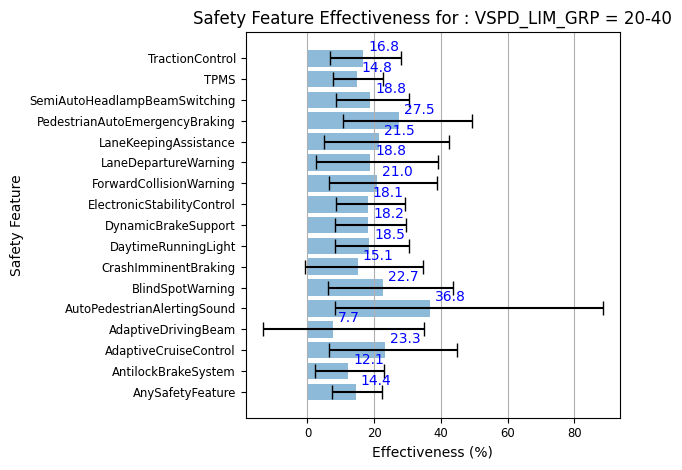

                                       E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  --------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                14.4205    7.13379   7.78253  0.855795  3148   986  3186   854
AntilockBrakeSystem             12.1417    9.73126  10.9434   0.878583   954   309  5380  1531
AdaptiveCruiseControl           23.2975   16.8621   21.6136   0.767025   165    62  6169  1778
AdaptiveDrivingBeam              7.68029  21.1073   27.3634   0.923197   172    54  6162  1786
AutoPedestrianAlertingSound     36.7584   28.4896   51.8454   0.632416    24    11  6310  1829
BlindSpotWarning                22.7295   16.5253   21.0209   0.772705   177    66  6157  1774
CrashImminentBraking            15.1324   15.9597   19.6561   0.848676   256    87  6078  1753
DaytimeRunningLight             18.5358   10.4106   11.9359   0.814642   628   219  5706  1621
DynamicBrakeSupport             18.2144   10.016  

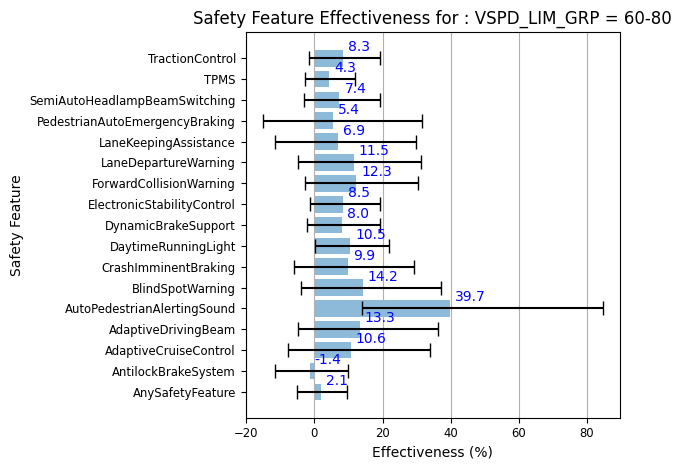

                                       E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  --------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                 2.06881   7.09191   7.64559  0.979312  3048  1134  4202  1531
AntilockBrakeSystem             -1.38238  10.2068   11.3494   1.01382   1046   380  6204  2285
AdaptiveCruiseControl           10.6304   18.4351   23.2262   0.893696   178    73  7072  2592
AdaptiveDrivingBeam             13.3308   18.1631   22.9788   0.866692   168    71  7082  2594
AutoPedestrianAlertingSound     39.7369   25.7428   44.9399   0.602631    23    14  7227  2651
BlindSpotWarning                14.201    18.1143   22.9622   0.85799    164    70  7086  2595
CrashImminentBraking             9.8656   15.9263   19.3444   0.901344   256   104  6994  2561
DaytimeRunningLight             10.4669   10.1993   11.5105   0.895331   712   289  6538  2376
DynamicBrakeSupport              7.98865  10.0855 

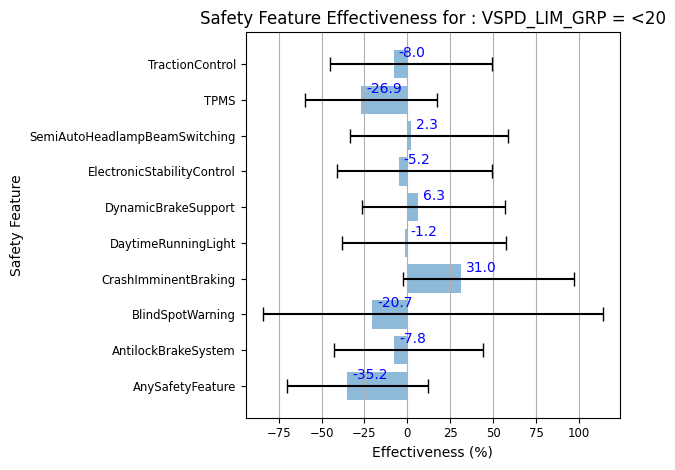

                                       E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               -35.1721   34.8829   47.016   1.35172    122   126   101   141
AntilockBrakeSystem             -7.83242  34.9842   51.7849  1.07832     40    45   183   222
BlindSpotWarning               -20.6573   63.6062  134.521   1.20657     10    10   213   257
CrashImminentBraking            30.9583   33.7561   66.049   0.690417    10    17   213   250
DaytimeRunningLight             -1.1639   37.1077   58.6043  1.01164     27    32   196   235
DynamicBrakeSupport              6.3267   32.8237   50.5296  0.936733    30    38   193   229
ElectronicStabilityControl      -5.16891  35.8777   54.4545  1.05169     34    39   189   228
SemiAutoHeadlampBeamSwitching    2.31911  35.6604   56.1642  0.976809    27    33   196   234
TPMS                           -26.9204   32.7172   44.08   

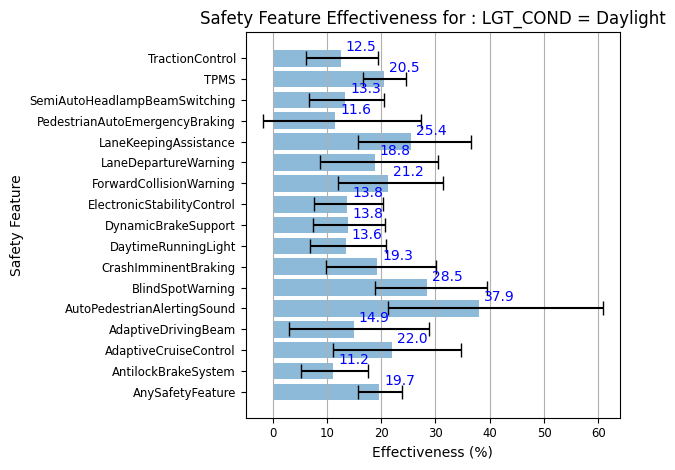

                                      E     DElow    DEhigh         R    SF    SN     NF    NN
------------------------------  -------  --------  --------  --------  ----  ----  -----  ----
AnySafetyFeature                19.6925   3.88785   4.08564  0.803075  6525  2945   8892  3223
AntilockBrakeSystem             11.1803   5.89758   6.31702  0.888197  2192   970  13225  5198
AdaptiveCruiseControl           22.0166  10.8794   12.6433   0.779834   363   185  15054  5983
AdaptiveDrivingBeam             14.9256  11.9566   13.9119   0.850744   378   177  15039  5991
AutoPedestrianAlertingSound     37.9379  16.7397   22.9225   0.620621    70    45  15347  6123
BlindSpotWarning                28.4618   9.52948  10.994    0.715382   381   211  15036  5957
CrashImminentBraking            19.324    9.47472  10.7355   0.80676    545   268  14872  5900
DaytimeRunningLight             13.6123   6.67564   7.2347   0.863877  1484   677  13933  5491
DynamicBrakeSupport             13.8251   6.36483 

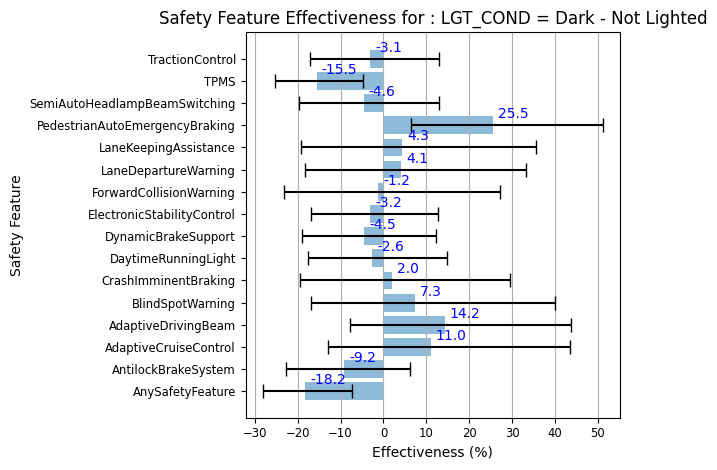

                                        E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ---------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                -18.2297    9.9279    10.838   1.1823    4117   682  5305  1039
AntilockBrakeSystem              -9.15466  13.5308    15.4454  1.09155   1206   204  8216  1517
AdaptiveCruiseControl            11.0142   23.8341    32.5532  0.889858   166    34  9256  1687
AdaptiveDrivingBeam              14.229    21.984     29.5607  0.85771    179    38  9243  1683
BlindSpotWarning                  7.29065  24.1762    32.7048  0.927093   183    36  9239  1685
CrashImminentBraking              1.96663  21.4525    27.462   0.980334   290    54  9132  1667
DaytimeRunningLight              -2.63856  14.9133    17.4486  1.02639    785   140  8637  1581
DynamicBrakeSupport              -4.51768  14.4984    16.8335  1.04518    889   156  8533  1565
ElectronicStabilityControl       -3.1644

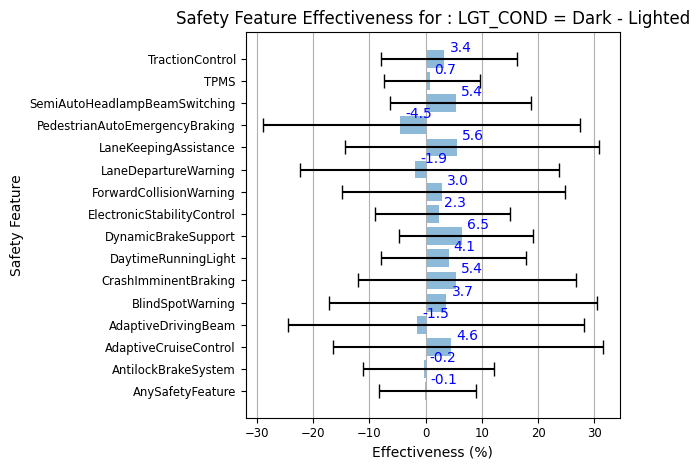

                                         E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ----------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                -0.0847942   8.26196   9.00535  1.00085   3440  1037  2867   865
AntilockBrakeSystem             -0.204974   10.9337   12.2728   1.00205   1043   314  5264  1588
AdaptiveCruiseControl            4.55273    21.0186   26.9543   0.954473   187    59  6120  1843
AdaptiveDrivingBeam             -1.4805     22.8894   29.5559   1.01481    185    55  6122  1847
BlindSpotWarning                 3.71132    20.8862   26.6716   0.962887   195    61  6112  1841
CrashImminentBraking             5.41611    17.398    21.3196   0.945839   283    90  6024  1812
DaytimeRunningLight              4.09902    11.9716   13.6792   0.95901    719   225  5588  1677
DynamicBrakeSupport              6.46241    11.1096   12.6069   0.935376   801   256  5506  1646
ElectronicStabilityControl    

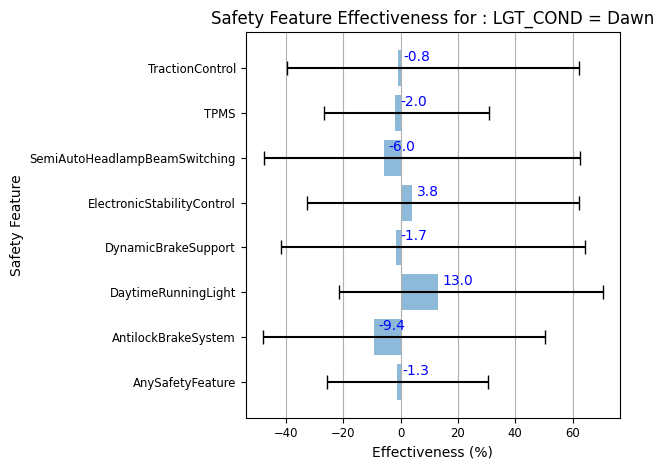

                                       E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               -1.27494   24.2699   31.9191  1.01275    258    75   411   121
AntilockBrakeSystem            -9.44538   38.7192   59.9161  1.09445     74    20   595   176
DaytimeRunningLight            12.9808    34.6693   57.6294  0.870192    45    15   624   181
DynamicBrakeSupport            -1.69638   40.0297   66.0143  1.01696     52    15   617   181
ElectronicStabilityControl      3.80962   36.3728   58.4898  0.961904    56    17   613   179
SemiAutoHeadlampBeamSwitching  -5.95122   41.5821   68.4438  1.05951     54    15   615   181
TPMS                           -2.01405   24.7449   32.6693  1.02014    242    70   427   126
TractionControl                -0.773616  38.7978   63.0858  1.00774     55    16   614   180


LGT_COND 5 SIZE:  1106 --------------------


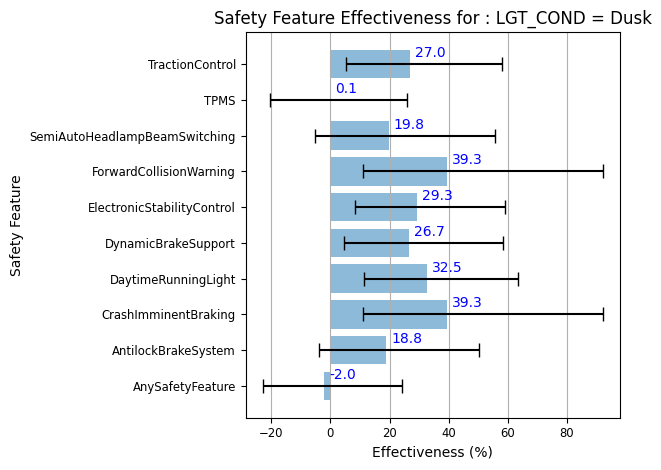

                                        E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  ----------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               -2.01546    20.8685   26.2353  1.02015    361   121   465   159
AntilockBrakeSystem            18.7923     22.6738   31.4567  0.812077   101    41   725   239
CrashImminentBraking           39.3187     28.245    52.8403  0.606813    20    11   806   269
DaytimeRunningLight            32.5375     21.2494   31.0202  0.674625    64    31   762   249
DynamicBrakeSupport            26.6824     22.124    31.6852  0.733176    76    34   750   246
ElectronicStabilityControl     29.3226     20.9649   29.8062  0.706774    78    36   748   244
ForwardCollisionWarning        39.3187     28.245    52.8403  0.606813    20    11   806   269
SemiAutoHeadlampBeamSwitching  19.7844     24.8158   35.9319  0.802156    75    31   751   249
TPMS                            0.0746308  20.5272

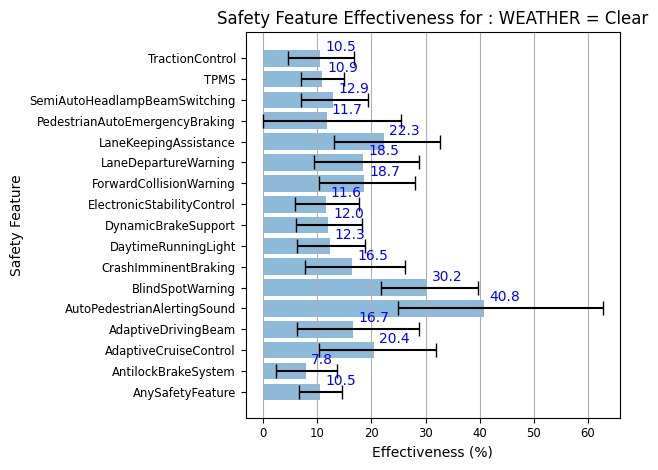

                                       E     DElow    DEhigh         R     SF    SN     NF    NN
------------------------------  --------  --------  --------  --------  -----  ----  -----  ----
AnySafetyFeature                10.4905    3.87835   4.05401  0.895095  10255  3519  12235  3758
AntilockBrakeSystem              7.81253   5.52263   5.87455  0.921875   3224  1118  19266  6159
AdaptiveCruiseControl           20.4225   10.0517   11.5049   0.795775    527   213  21963  7064
AdaptiveDrivingBeam             16.6764   10.5093   12.0261   0.833236    546   211  21944  7066
AutoPedestrianAlertingSound     40.8193   16.0074   21.9424   0.591807     77    42  22413  7235
BlindSpotWarning                30.1656    8.43809   9.59779  0.698344    532   244  21958  7033
CrashImminentBraking            16.4577    8.74322   9.76521  0.835423    827   318  21663  6959
DaytimeRunningLight             12.2551    6.09583   6.55094  0.877449   2174   791  20316  6486
DynamicBrakeSupport           

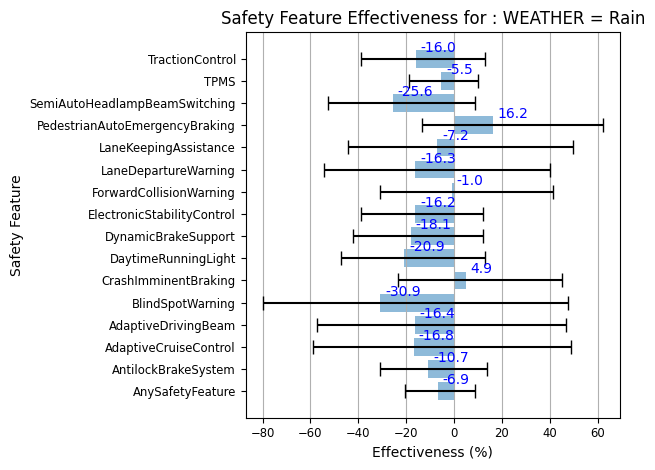

                                         E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ----------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                 -6.92102   13.5147   15.4701  1.06921   1264   330  1544   431
AntilockBrakeSystem             -10.7379    20.0212   24.4398  1.10738    391    97  2417   664
AdaptiveCruiseControl           -16.8126    42.0928   65.8056  1.16813     73    17  2735   744
AdaptiveDrivingBeam             -16.3819    41.0288   63.3684  1.16382     77    18  2731   743
BlindSpotWarning                -30.8772    49.1091   78.6036  1.30877     72    15  2736   746
CrashImminentBraking              4.85511   28.2198   40.1189  0.951449   102    29  2706   732
DaytimeRunningLight             -20.8969    26.4304   33.8253  1.20897    259    59  2549   702
DynamicBrakeSupport             -18.0793    24.1494   30.3582  1.18079    300    70  2508   691
ElectronicStabilityControl      -16.2105

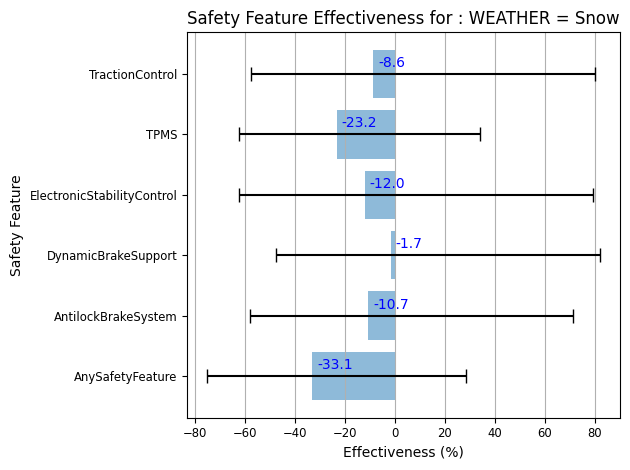

                                    E    DElow    DEhigh        R    SF    SN    NF    NN
--------------------------  ---------  -------  --------  -------  ----  ----  ----  ----
AnySafetyFeature            -33.1144   42.0781   61.5271  1.33114   128    36   203    76
AntilockBrakeSystem         -10.6734   47.1033   82.0054  1.10673    42    13   289    99
DynamicBrakeSupport          -1.67785  45.9533   83.8486  1.01678    33    11   298   101
ElectronicStabilityControl  -12.0493   50.296    91.2604  1.12049    36    11   295   101
TPMS                        -23.2323   39.0266   57.1142  1.23232   122    36   209    76
TractionControl              -8.5688   48.8391   88.7732  1.08569    35    11   296   101


WEATHER 5 SIZE:  473 --------------------


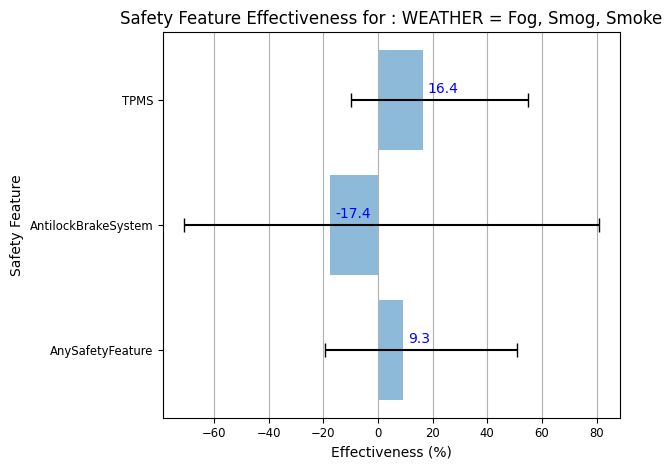

                             E    DElow    DEhigh         R    SF    SN    NF    NN
-------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature       9.25214  28.4709   41.4867  0.907479   137    40   234    62
AntilockBrakeSystem  -17.4468   53.5433   98.4061  1.17447     42    10   329    92
TPMS                  16.39     26.2865   38.3405  0.8361     130    40   241    62


WEATHER 6 SIZE:  67 --------------------
E    DElow    DEhigh    R    SF    SN    NF    NN
---  -------  --------  ---  ----  ----  ----  ----


WEATHER 7 SIZE:  5 --------------------
E    DElow    DEhigh    R    SF    SN    NF    NN
---  -------  --------  ---  ----  ----  ----  ----


WEATHER 10 SIZE:  5960 --------------------


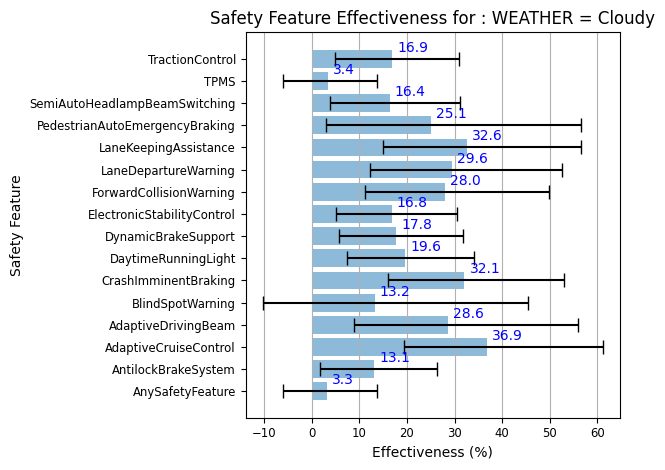

                                       E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  --------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                 3.2758    9.35454   10.3561  0.967242  2049   617  2551   743
AntilockBrakeSystem             13.1379   11.3973    13.1187  0.868621   642   214  3958  1146
AdaptiveCruiseControl           36.8584   17.561     24.3267  0.631416    82    38  4518  1322
AdaptiveDrivingBeam             28.6451   19.7657    27.3387  0.713549    90    37  4510  1323
BlindSpotWarning                13.2156   23.5277    32.2786  0.867844   109    37  4491  1323
CrashImminentBraking            32.0865   16.0386    20.9975  0.679135   128    55  4472  1305
DaytimeRunningLight             19.618    12.265     14.4734  0.80382    414   149  4186  1211
DynamicBrakeSupport             17.7754   12.0112    14.0659  0.822246   469   165  4131  1195
ElectronicStabilityControl      16.8213   11.748  

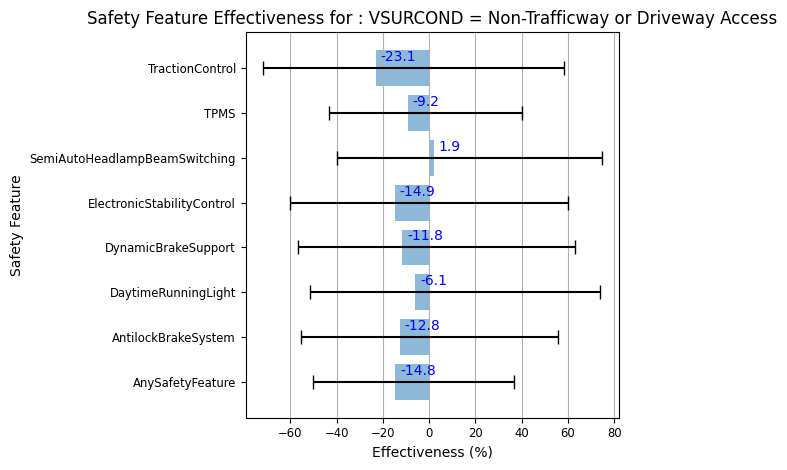

                                       E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               -14.8148   35.601    51.6011  1.14815     59   108    59   124
AntilockBrakeSystem            -12.7856   42.5947   68.443   1.12786     23    41    95   191
DaytimeRunningLight             -6.10264  45.5532   79.8242  1.06103     15    28   103   204
DynamicBrakeSupport            -11.7647   44.7369   74.5959  1.11765     19    34    99   198
ElectronicStabilityControl     -14.8688   45.3656   74.9762  1.14869     20    35    98   197
SemiAutoHeadlampBeamSwitching    1.94175  41.7841   72.8092  0.980583    15    30   103   202
TPMS                            -9.24731  33.9188   49.1918  1.09247     56   105    62   127
TractionControl                -23.0674   48.9362   81.2405  1.23067     20    33    98   199


VSURCOND 1 SIZE:  35912 --------------------


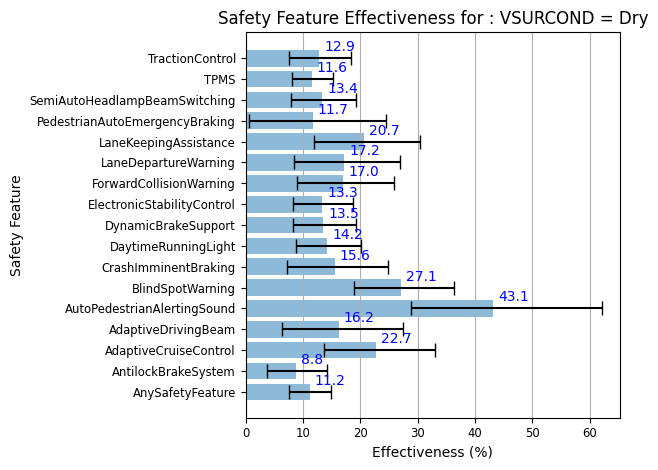

                                       E     DElow    DEhigh         R     SF    SN     NF    NN
------------------------------  --------  --------  --------  --------  -----  ----  -----  ----
AnySafetyFeature                11.1883    3.54941   3.69717  0.888117  12440  4106  14976  4390
AntilockBrakeSystem              8.80577   5.04453   5.33991  0.911942   3896  1306  23520  7190
AdaptiveCruiseControl           22.7273    9.08757  10.2987   0.772727    620   247  26796  8249
AdaptiveDrivingBeam             16.2337    9.90143  11.2287   0.837663    649   239  26767  8257
AutoPedestrianAlertingSound     43.1246   14.2693   19.0483   0.568754     92    50  27324  8446
BlindSpotWarning                27.125     8.1678    9.19879  0.72875     662   279  26754  8217
CrashImminentBraking            15.5532    8.29275   9.19578  0.844468    982   358  26434  8138
DaytimeRunningLight             14.2406    5.48725   5.86234  0.857594   2623   933  24793  7563
DynamicBrakeSupport           

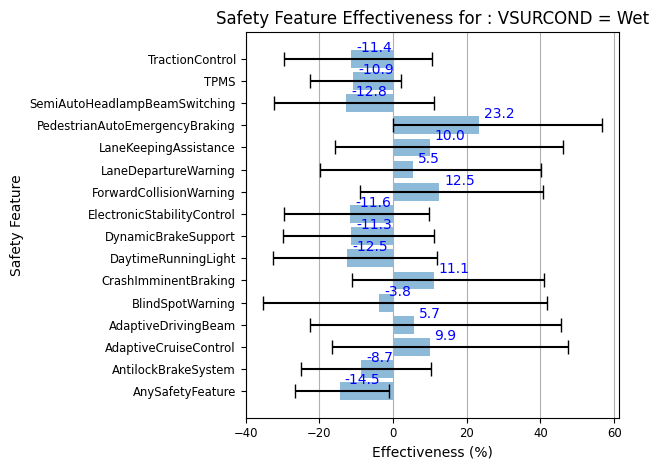

                                        E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                -14.5223   12.0096   13.4166  1.14522   2007   473  2412   651
AntilockBrakeSystem              -8.70739  16.2566   19.1152  1.08707    617   146  3802   978
AdaptiveCruiseControl             9.89022  26.5593   37.6591  0.901098   103    29  4316  1095
AdaptiveDrivingBeam               5.658    28.0958   40.0115  0.94342    104    28  4315  1096
BlindSpotWarning                 -3.78997  31.6074   45.4477  1.0379     106    26  4313  1098
CrashImminentBraking             11.0574   22.3187   29.7953  0.889426   151    43  4268  1081
DaytimeRunningLight             -12.4629   20.1092   24.4877  1.12463    407    93  4012  1031
DynamicBrakeSupport             -11.2821   18.5965   22.3277  1.11282    476   110  3943  1014
ElectronicStabilityControl      -11.5842   18.0019

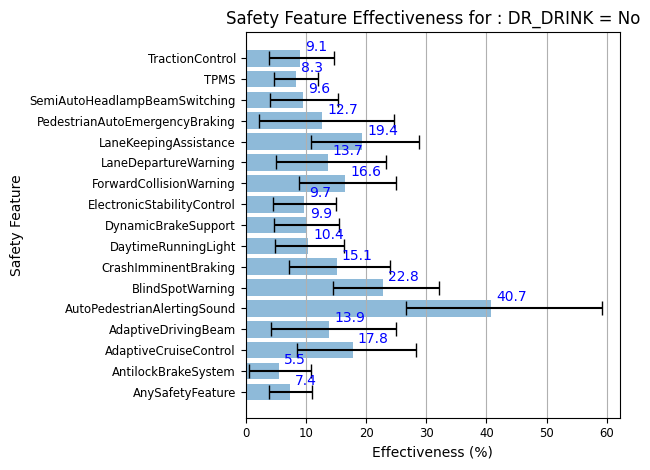

                                       E     DElow    DEhigh         R     SF    SN     NF    NN
------------------------------  --------  --------  --------  --------  -----  ----  -----  ----
AnySafetyFeature                 7.36703   3.55504   3.69692  0.92633   12183  4586  14365  5009
AntilockBrakeSystem              5.54314   5.00187   5.28155  0.944569   3896  1478  22652  8117
AdaptiveCruiseControl           17.7937    9.29577  10.4809   0.822063    631   276  25917  9319
AdaptiveDrivingBeam             13.9188    9.75551  11.0024   0.860812    648   271  25900  9324
AutoPedestrianAlertingSound     40.7288   14.0914   18.4865   0.592712     97    59  26451  9536
BlindSpotWarning                22.7707    8.3033    9.30358  0.772293    676   314  25872  9281
CrashImminentBraking            15.146     7.94558   8.76646  0.84854     976   413  25572  9182
DaytimeRunningLight             10.4158    5.50399   5.86429  0.895842   2625  1047  23923  8548
DynamicBrakeSupport           

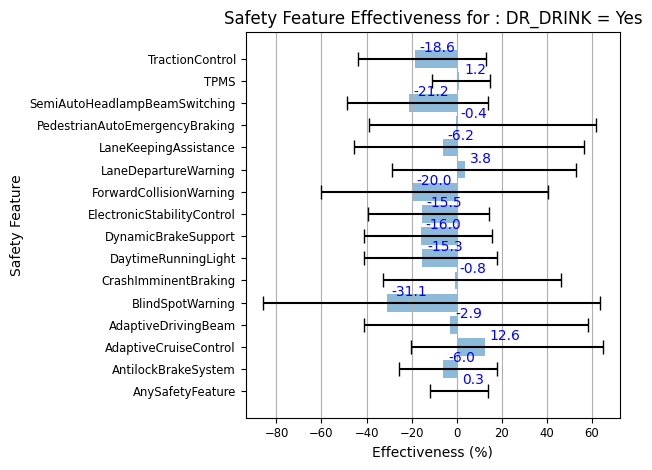

                                         E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ----------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                  0.290587  12.1662   13.857   0.997094  2679   302  3790   426
AntilockBrakeSystem              -6.01719   19.5143   23.9166  1.06017    758    81  5711   647
AdaptiveCruiseControl            12.5943    32.7815   52.4547  0.874057   109    14  6360   714
AdaptiveDrivingBeam              -2.94906   38.359    61.1398  1.02949    128    14  6341   714
BlindSpotWarning                -31.1003    55.0333   94.8491  1.311      116    10  6353   718
CrashImminentBraking             -0.769517  32.0569   47.0126  1.0077     188    21  6281   707
DaytimeRunningLight             -15.3215    25.9022   33.4053  1.15322    497    49  5972   679
DynamicBrakeSupport             -15.9793    25.0375   31.9307  1.15979    550    54  5919   674
ElectronicStabilityControl      -15.4927

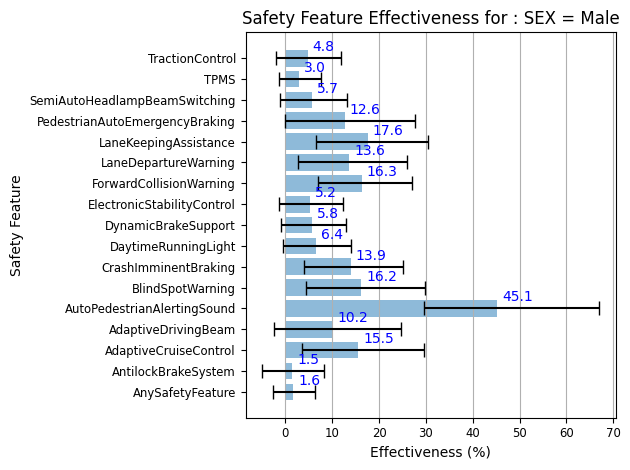

                                       E     DElow    DEhigh         R    SF    SN     NF    NN
------------------------------  --------  --------  --------  --------  ----  ----  -----  ----
AnySafetyFeature                 1.64693   4.38332   4.58779  0.983531  9408  2762  14660  4233
AntilockBrakeSystem              1.46741   6.3499    6.7873   0.985326  3057   900  21011  6095
AdaptiveCruiseControl           15.5389   12.077    14.092    0.844611   452   155  23616  6840
AdaptiveDrivingBeam             10.1508   12.507    14.5295   0.898492   502   162  23566  6833
AutoPedestrianAlertingSound     45.1463   15.5789   21.7584   0.548537    70    37  23998  6958
BlindSpotWarning                16.1746   11.7588   13.6774   0.838254   469   162  23599  6833
CrashImminentBraking            13.9424    9.95764  11.2606   0.860576   732   246  23336  6749
DaytimeRunningLight              6.44931   7.02232   7.59222  0.935507  2056   635  22012  6360
DynamicBrakeSupport              5.76319

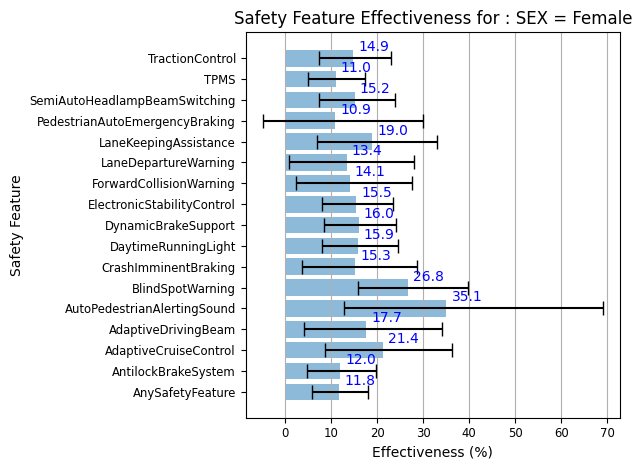

                                      E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  -------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                11.7714   5.88512   6.30573  0.882286  5454  2126  3495  1202
AntilockBrakeSystem             12.0243   7.12795   7.75638  0.879757  1597   659  7352  2669
AdaptiveCruiseControl           21.3517  12.5867   14.9848   0.786483   288   135  8661  3193
AdaptiveDrivingBeam             17.6992  13.6396   16.349    0.823008   274   123  8675  3205
AutoPedestrianAlertingSound     35.0848  22.3045   33.9797   0.649152    42    24  8907  3304
BlindSpotWarning                26.8206  10.9151   12.8286   0.731794   323   162  8626  3166
CrashImminentBraking            15.2833  11.605    13.4471   0.847167   432   188  8517  3140
DaytimeRunningLight             15.9007   7.86346   8.67455  0.840993  1066   461  7883  2867
DynamicBrakeSupport             15.9936   7.49678   8.23135 

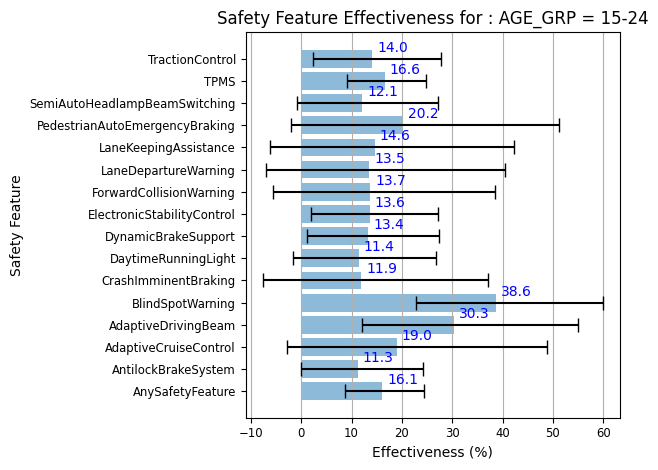

                                      E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  -------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                16.1338   7.4578    8.18572  0.838662  3096   805  3366   734
AntilockBrakeSystem             11.267   11.2541   12.8888   0.88733    810   214  5652  1325
AdaptiveCruiseControl           18.9896  21.8492   29.9184   0.810104   123    36  6339  1503
AdaptiveDrivingBeam             30.2956  18.2583   24.7383   0.697044   118    40  6344  1499
BlindSpotWarning                38.6369  15.8117   21.3002   0.613631   112    43  6350  1496
CrashImminentBraking            11.9238  19.5785   25.1746   0.880762   208    56  6254  1483
DaytimeRunningLight             11.4145  13.1231   15.4052   0.885855   549   146  5913  1393
DynamicBrakeSupport             13.3528  12.1062   14.0724   0.866472   624   169  5838  1370
ElectronicStabilityControl      13.6418  11.6329   13.4439  

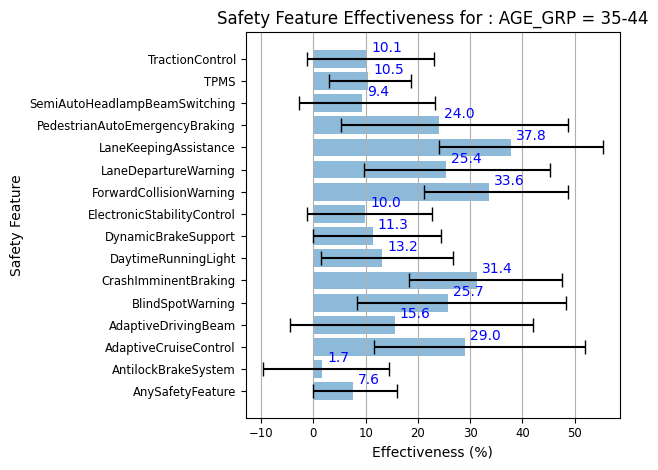

                                       E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  --------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                 7.63194   7.70049   8.40085  0.923681  2586   865  3324  1027
AntilockBrakeSystem              1.65578  11.3576   12.8405   0.983442   853   277  5057  1615
AdaptiveCruiseControl           28.9997   17.3255   22.918    0.710003   114    51  5796  1841
AdaptiveDrivingBeam             15.615    20.167    26.5002   0.84385    135    51  5775  1841
BlindSpotWarning                25.6804   17.3297   22.5993   0.743196   131    56  5779  1836
CrashImminentBraking            31.396    13.1267   16.2327   0.68604    198    91  5712  1801
DaytimeRunningLight             13.2011   11.6825   13.4994   0.867989   536   195  5374  1697
DynamicBrakeSupport             11.3478   11.4156   13.1029   0.886522   606   216  5304  1676
ElectronicStabilityControl       9.97728  11.1657 

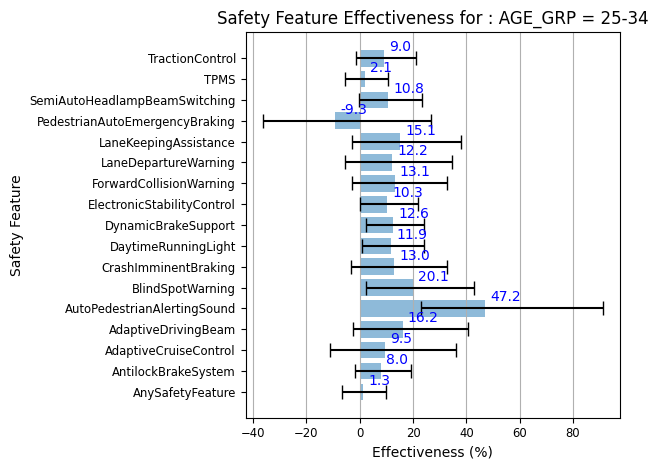

                                       E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  --------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                 1.25246   7.77414   8.43849  0.987475  3770  1005  3871  1019
AntilockBrakeSystem              7.99699   9.87235  11.059    0.92003   1115   317  6526  1707
AdaptiveCruiseControl            9.4813   20.5175   26.5313   0.905187   185    54  7456  1970
AdaptiveDrivingBeam             16.1808   18.846    24.3125   0.838192   178    56  7463  1968
AutoPedestrianAlertingSound     47.1584   24.0439   44.1187   0.528416    22    11  7619  2013
BlindSpotWarning                20.1071   17.6525   22.6591   0.798929   179    59  7462  1965
CrashImminentBraking            13.0093   16.2055   19.9155   0.869907   284    86  7357  1938
DaytimeRunningLight             11.8726   10.8665   12.3949   0.881274   762   226  6879  1798
DynamicBrakeSupport             12.6159   10.2963 

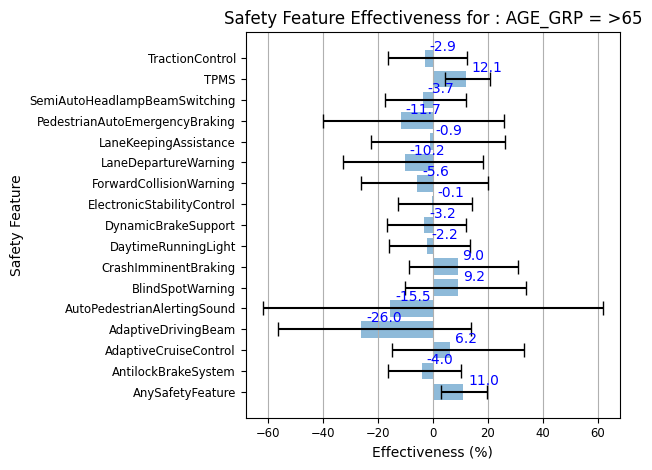

                                         E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ----------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                 11.0342     7.94929   8.72927  0.889658  1988   874  2209   864
AntilockBrakeSystem              -3.96047   12.3944   14.0721   1.0396     696   279  3501  1459
AdaptiveCruiseControl             6.21647   20.9291   26.9415   0.937835   143    63  4054  1675
AdaptiveDrivingBeam             -25.9933    30.2391   39.7885   1.25993    148    49  4049  1689
AutoPedestrianAlertingSound     -15.502     46.3591   77.4422   1.15502     39    14  4158  1724
BlindSpotWarning                  9.23572   19.4504   24.7554   0.907643   154    70  4043  1668
CrashImminentBraking              9.02406   17.7694   22.0826   0.909759   192    87  4005  1651
DaytimeRunningLight              -2.1817    13.7375   15.8712   1.02182    507   206  3690  1532
DynamicBrakeSupport           

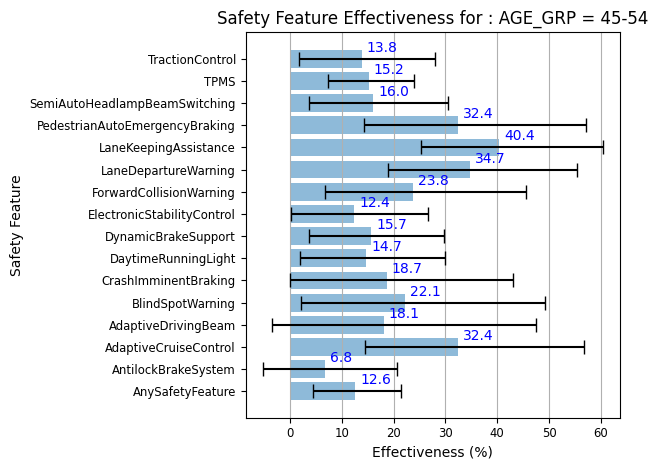

                                       E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  --------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                12.5632    8.05175   8.86841  0.874368  1830   691  2729   901
AntilockBrakeSystem              6.78254  12.0559   13.8467   0.932175   601   223  3958  1369
AdaptiveCruiseControl           32.3578   17.9209   24.3802   0.676422    86    44  4473  1548
AdaptiveDrivingBeam             18.0814   21.5858   29.3087   0.819186    99    42  4460  1550
BlindSpotWarning                22.1141   20.0649   27.0278   0.778859   101    45  4458  1547
CrashImminentBraking            18.6759   18.7283   24.3318   0.813241   136    58  4423  1534
DaytimeRunningLight             14.7293   12.8926   15.1892   0.852707   384   155  4175  1437
DynamicBrakeSupport             15.6755   12.0859   14.1079   0.843245   435   177  4124  1415
ElectronicStabilityControl      12.4084   12.2275 

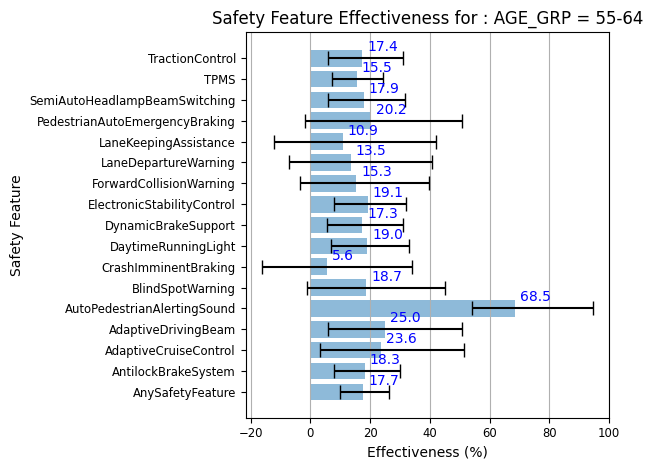

                                       E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  --------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                17.6585    7.81637   8.63617  0.823415  1577   643  2636   885
AntilockBrakeSystem             18.2595   10.3569   11.8596   0.817405   576   248  3637  1280
AdaptiveCruiseControl           23.6444   20.4087   27.8536   0.763556    89    42  4124  1486
AdaptiveDrivingBeam             24.9564   19.1822   25.7691   0.750436    98    47  4115  1481
AutoPedestrianAlertingSound     68.4925   14.2537   26.0288   0.315075    14    16  4199  1512
BlindSpotWarning                18.7289   19.8699   26.3      0.812711   115    51  4098  1477
CrashImminentBraking             5.63771  21.7903   28.333    0.943623   146    56  4067  1472
DaytimeRunningLight             19.0476   11.9934   14.0793   0.809524   383   168  3830  1360
DynamicBrakeSupport             17.3229   11.8014 

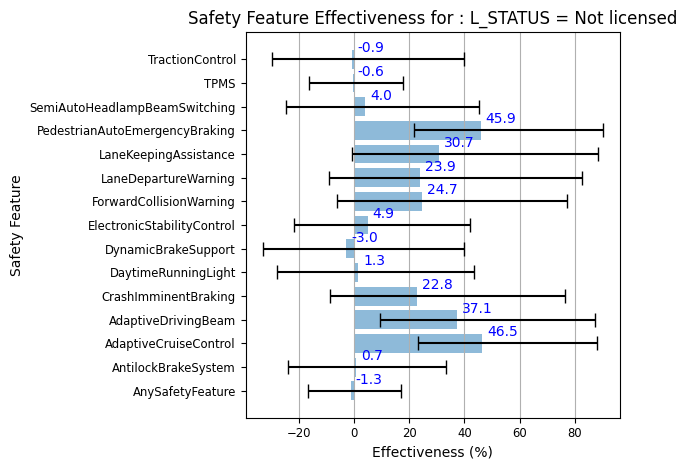

                                        E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                -1.31419   15.5537   18.3745  1.01314    801   191  1337   323
AntilockBrakeSystem              0.689891  24.6428   32.7757  0.993101   186    45  1952   469
AdaptiveCruiseControl           46.4946    23.3913   41.5605  0.535054    27    12  2111   502
AdaptiveDrivingBeam             37.1223    27.8975   50.1464  0.628777    29    11  2109   503
CrashImminentBraking            22.776     31.6267   53.5631  0.77224     42    13  2096   501
DaytimeRunningLight              1.33112   29.5125   42.107   0.986689   115    28  2023   486
DynamicBrakeSupport             -2.96887   30.2848   42.9034  1.02969    124    29  2014   485
ElectronicStabilityControl       4.86177   26.7479   37.2093  0.951382   131    33  2007   481
ForwardCollisionWarning         24.6506    30.9247

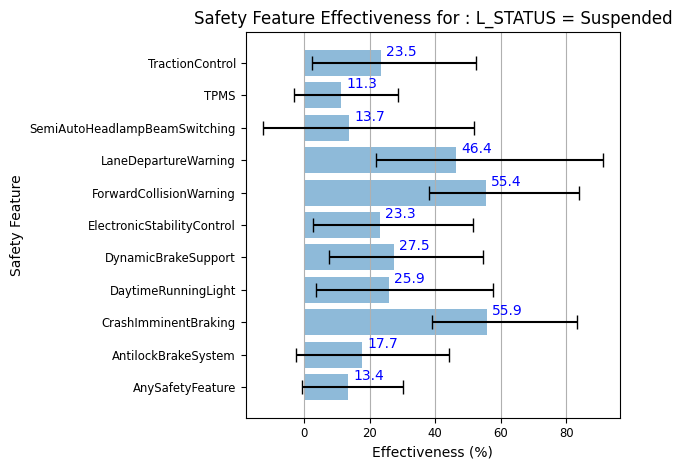

                                     E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               13.4476  14.0596   16.7864  0.865524   853   174  1399   247
AntilockBrakeSystem            17.7354  20.0994   26.598   0.822646   211    47  2041   374
CrashImminentBraking           55.9316  16.8361   27.2447  0.440684    41    17  2211   404
DaytimeRunningLight            25.8515  22.2985   31.8882  0.741485   113    28  2139   393
DynamicBrakeSupport            27.4867  19.8068   27.2501  0.725133   143    36  2109   385
ElectronicStabilityControl     23.2881  20.6487   28.2539  0.767119   155    37  2097   384
ForwardCollisionWarning        55.3914  17.4136   28.564   0.446086    39    16  2213   405
LaneDepartureWarning           46.3833  24.4208   44.8474  0.536167    29    10  2223   411
SemiAutoHeadlampBeamSwitching  13.7368  26.4222   38.0887  0.862632   121    26 

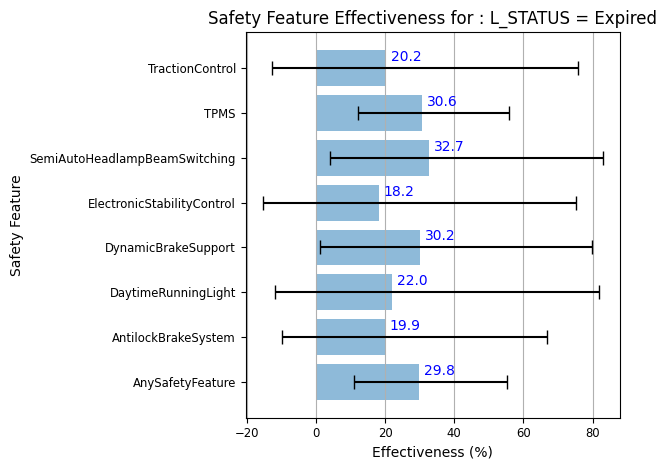

                                     E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               29.7708  18.6189   25.3359  0.702292   202    66   353    81
AntilockBrakeSystem            19.8642  29.6559   47.078   0.801358    59    19   496   128
DaytimeRunningLight            21.9653  33.8673   59.8364  0.780347    36    12   519   135
DynamicBrakeSupport            30.1741  29.0108   49.6312  0.698259    38    14   517   133
ElectronicStabilityControl     18.1996  33.5533   56.8878  0.818004    44    14   511   133
SemiAutoHeadlampBeamSwitching  32.7329  28.762    50.2464  0.672671    34    13   521   134
TPMS                           30.5936  18.5116   25.2447  0.694064   190    63   365    84
TractionControl                20.2148  32.7895   55.6671  0.797852    43    14   512   133


L_STATUS 4 SIZE:  109 --------------------
E    DElow    DEhigh    R    SF    

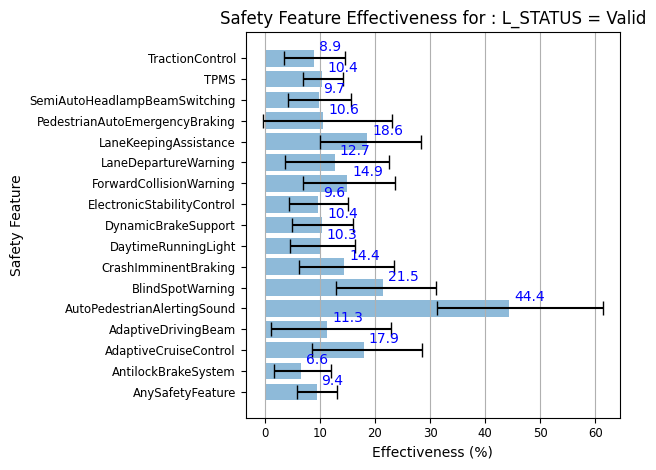

                                       E     DElow    DEhigh         R     SF    SN     NF    NN
------------------------------  --------  --------  --------  --------  -----  ----  -----  ----
AnySafetyFeature                 9.38949   3.61313   3.76319  0.906105  12364  4231  14158  4390
AntilockBrakeSystem              6.64466   5.06468   5.35521  0.933553   4006  1380  22516  7241
AdaptiveCruiseControl           17.9199    9.44863  10.6778   0.820801    655   258  25867  8363
AdaptiveDrivingBeam             11.2917   10.2244   11.5564   0.887083    690   252  25832  8369
AutoPedestrianAlertingSound     44.3719   13.0404   17.0335   0.556281    103    60  26419  8561
BlindSpotWarning                21.4891    8.60267   9.66129  0.785109    708   291  25814  8330
CrashImminentBraking            14.4379    8.16352   9.02456  0.855621   1020   385  25502  8236
DaytimeRunningLight             10.2787    5.62517   6.00143  0.897213   2737   980  23785  7641
DynamicBrakeSupport           

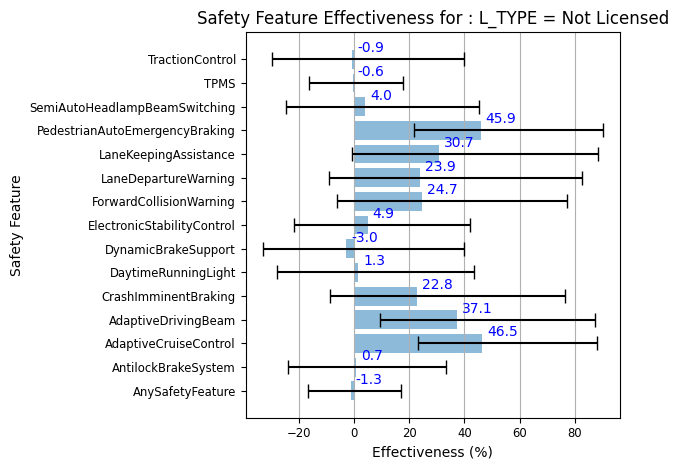

                                        E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                -1.31419   15.5537   18.3745  1.01314    801   191  1337   323
AntilockBrakeSystem              0.689891  24.6428   32.7757  0.993101   186    45  1952   469
AdaptiveCruiseControl           46.4946    23.3913   41.5605  0.535054    27    12  2111   502
AdaptiveDrivingBeam             37.1223    27.8975   50.1464  0.628777    29    11  2109   503
CrashImminentBraking            22.776     31.6267   53.5631  0.77224     42    13  2096   501
DaytimeRunningLight              1.33112   29.5125   42.107   0.986689   115    28  2023   486
DynamicBrakeSupport             -2.96887   30.2848   42.9034  1.02969    124    29  2014   485
ElectronicStabilityControl       4.86177   26.7479   37.2093  0.951382   131    33  2007   481
ForwardCollisionWarning         24.6506    30.9247

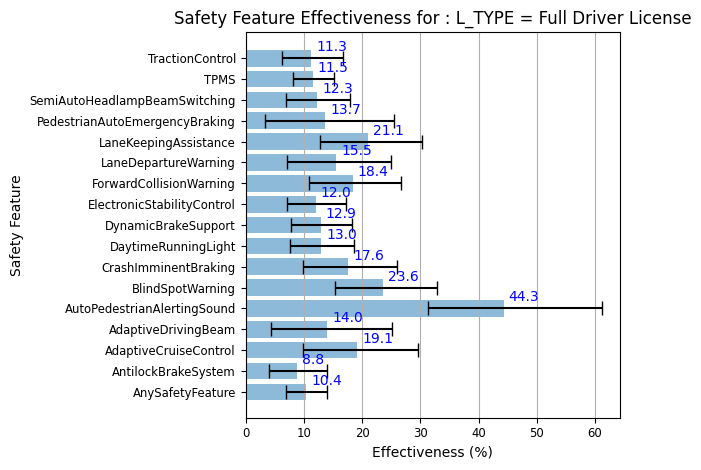

                                       E     DElow    DEhigh         R     SF    SN     NF    NN
------------------------------  --------  --------  --------  --------  -----  ----  -----  ----
AnySafetyFeature                10.4147    3.46777   3.60741  0.895853  13260  4400  15767  4687
AntilockBrakeSystem              8.83566   4.83443   5.10516  0.911643   4238  1435  24789  7652
AdaptiveCruiseControl           19.1248    9.22607  10.4141   0.808752    678   261  28349  8826
AdaptiveDrivingBeam             14.0443    9.76771  11.02     0.859557    714   259  28313  8828
AutoPedestrianAlertingSound     44.3356   12.9687   16.908    0.556644    107    60  28920  9027
BlindSpotWarning                23.6441    8.24457   9.24254  0.763559    735   299  28292  8788
CrashImminentBraking            17.5799    7.70806   8.5033   0.824201   1064   401  27963  8686
DaytimeRunningLight             12.982     5.35166   5.70236  0.87018    2860  1014  26167  8073
DynamicBrakeSupport           

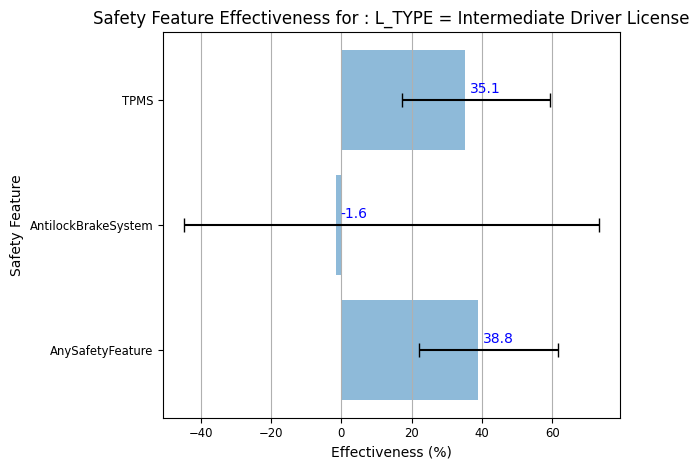

                            E    DElow    DEhigh         R    SF    SN    NF    NN
-------------------  --------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature     38.8221   16.6962   22.963   0.611779   217    69   329    64
AntilockBrakeSystem  -1.64651  43.1649   75.0247  1.01647     50    12   496   121
TPMS                 35.0669   17.7228   24.376   0.649331   213    66   333    67


L_TYPE 7 SIZE:  312 --------------------
E    DElow    DEhigh    R    SF    SN    NF    NN
---  -------  --------  ---  ----  ----  ----  ----


L_TYPE 8 SIZE:  27 --------------------
E    DElow    DEhigh    R    SF    SN    NF    NN
---  -------  --------  ---  ----  ----  ----  ----


PREV_ACC_OR_INF 0 SIZE:  23416 --------------------


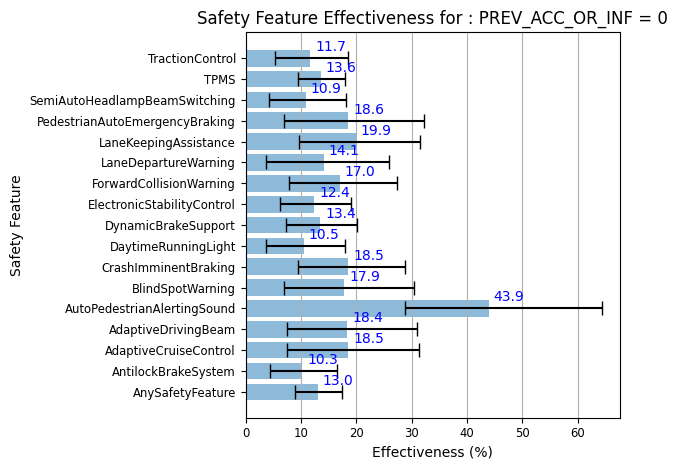

                                      E     DElow    DEhigh         R    SF    SN     NF    NN
------------------------------  -------  --------  --------  --------  ----  ----  -----  ----
AnySafetyFeature                13.0408   4.16276   4.37205  0.869592  8036  2998   9349  3033
AntilockBrakeSystem             10.2609   5.84482   6.25203  0.897391  2554   971  14831  5060
AdaptiveCruiseControl           18.5442  10.9845   12.6967   0.814558   444   188  16941  5843
AdaptiveDrivingBeam             18.3824  10.9252   12.6136   0.816176   452   191  16933  5840
AutoPedestrianAlertingSound     43.9081  15.0253   20.5227   0.560919    73    45  17312  5986
BlindSpotWarning                17.8604  10.9089   12.5796   0.821396   462   194  16923  5837
CrashImminentBraking            18.5305   9.07768  10.216    0.814695   680   287  16705  5744
DaytimeRunningLight             10.5019   6.8033    7.36301  0.894981  1741   667  15644  5364
DynamicBrakeSupport             13.4488   6.24311 

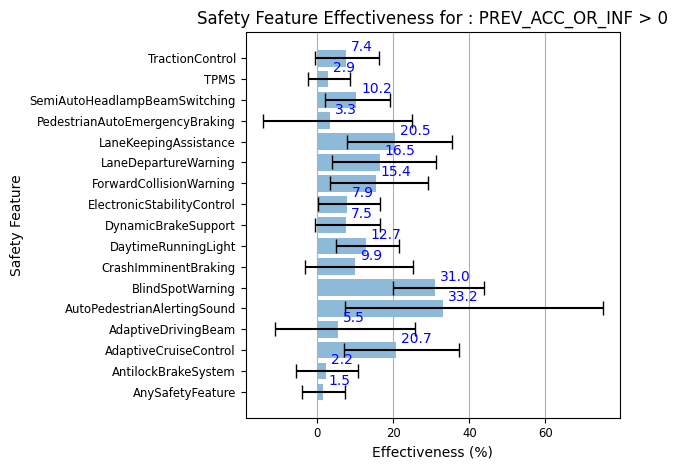

                                       E     DElow    DEhigh         R    SF    SN     NF    NN
------------------------------  --------  --------  --------  --------  ----  ----  -----  ----
AnySafetyFeature                 1.48581   5.45276   5.77225  0.985142  6826  1890   8806  2402
AntilockBrakeSystem              2.2423    7.72685   8.39     0.977577  2100   588  13532  3704
AdaptiveCruiseControl           20.7146   13.7493   16.6339   0.792854   296   102  15336  4190
AdaptiveDrivingBeam              5.47621  16.6874   20.2651   0.945238   324    94  15308  4198
AutoPedestrianAlertingSound     33.1575   25.7993   42.0165   0.668425    39    16  15593  4276
BlindSpotWarning                30.9562   10.9234   12.9765   0.690438   330   130  15302  4162
CrashImminentBraking             9.90571  13.0979   15.3261   0.900943   484   147  15148  4145
DaytimeRunningLight             12.7399    7.94022   8.73506  0.872601  1381   429  14251  3863
DynamicBrakeSupport              7.51856

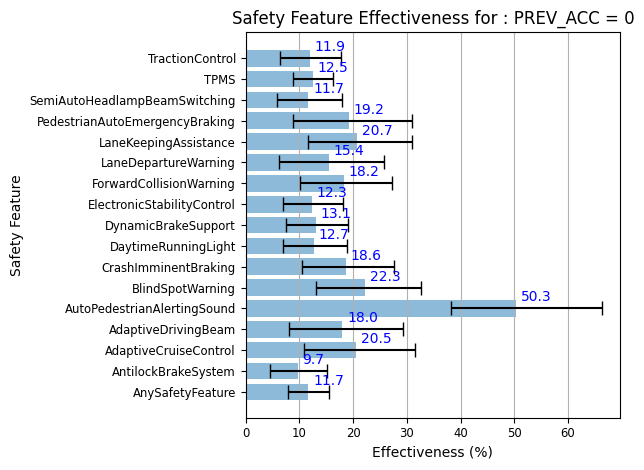

                                       E     DElow    DEhigh         R     SF    SN     NF    NN
------------------------------  --------  --------  --------  --------  -----  ----  -----  ----
AnySafetyFeature                11.6542    3.69603   3.85741  0.883458  11000  3792  13203  4021
AntilockBrakeSystem              9.66742   5.18361   5.49917  0.903326   3498  1231  20705  6582
AdaptiveCruiseControl           20.5491    9.62439  10.9509   0.794509    577   233  23626  7580
AdaptiveDrivingBeam             17.9695    9.97523  11.3562   0.820305    585   229  23618  7584
AutoPedestrianAlertingSound     50.3455   12.1135   16.0223   0.496545     88    57  24115  7756
BlindSpotWarning                22.3091    9.14023  10.3589   0.776909    606   250  23597  7563
CrashImminentBraking            18.5976    8.16852   9.07964  0.814024    890   350  23313  7463
DaytimeRunningLight             12.6941    5.81923   6.2348   0.873059   2370   864  21833  6949
DynamicBrakeSupport           

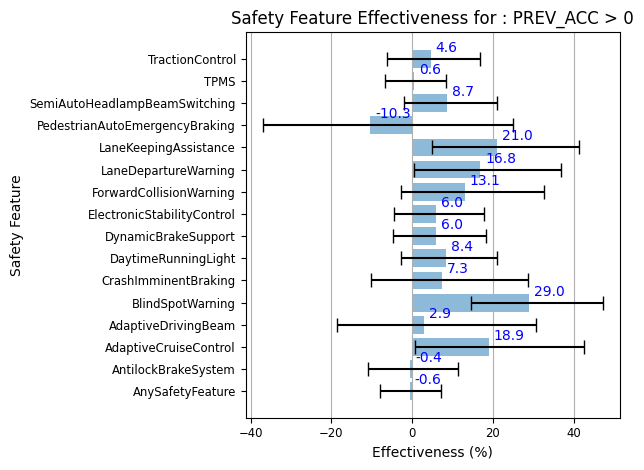

                                         E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ----------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                 -0.616797   7.25196   7.81524  1.00617   3862  1096  4952  1414
AntilockBrakeSystem              -0.42073   10.4647   11.6821   1.00421   1156   328  7658  2182
AdaptiveCruiseControl            18.9144    18.2595   23.5664   0.810856   163    57  8651  2453
AdaptiveDrivingBeam               2.93526   21.6238   27.8219   0.970647   191    56  8623  2454
BlindSpotWarning                 29.0343    14.4976   18.2198   0.709657   186    74  8628  2436
CrashImminentBraking              7.33746   17.4004   21.4233   0.926625   274    84  8540  2426
DaytimeRunningLight               8.41153   11.098    12.6282   0.915885   752   232  8062  2278
DynamicBrakeSupport               6.03014   10.8473   12.2629   0.939699   860   259  7954  2251
ElectronicStabilityControl    

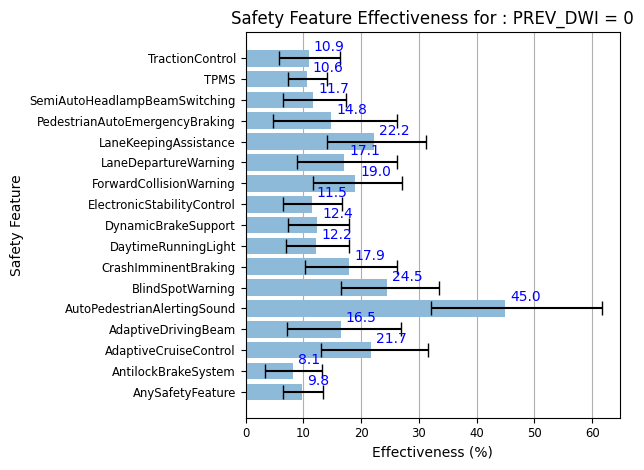

                                       E     DElow    DEhigh         R     SF    SN     NF    NN
------------------------------  --------  --------  --------  --------  -----  ----  -----  ----
AnySafetyFeature                 9.79909   3.41086   3.54491  0.902009  13895  4584  16621  4946
AntilockBrakeSystem              8.11202   4.80544   5.07062  0.91888    4371  1467  26145  8063
AdaptiveCruiseControl           21.7432    8.72975   9.82585  0.782568    696   276  29820  9254
AdaptiveDrivingBeam             16.4651    9.30544  10.472    0.835349    731   272  29785  9258
AutoPedestrianAlertingSound     44.9841   12.835    16.7405   0.550159    106    60  30410  9470
BlindSpotWarning                24.5106    8.05691   9.01957  0.754894    748   307  29768  9223
CrashImminentBraking            17.9182    7.56808   8.33674  0.820818   1094   413  29422  9117
DaytimeRunningLight             12.2377    5.33418   5.67937  0.877623   2942  1033  27574  8497
DynamicBrakeSupport           

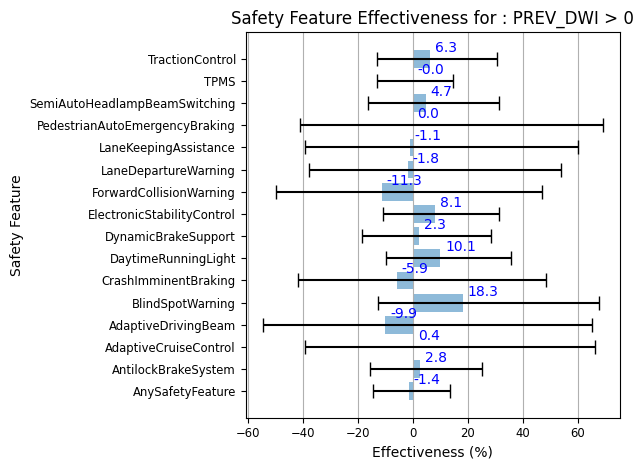

                                          E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  -----------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                 -1.39963    13.0187   14.9363  1.014      967   304  1534   489
AntilockBrakeSystem               2.78012    18.3563   22.629   0.972199   283    92  2218   701
AdaptiveCruiseControl             0.354672   39.6727   65.9168  0.996453    44    14  2457   779
AdaptiveDrivingBeam              -9.93485    44.6268   75.1216  1.09935     45    13  2456   780
BlindSpotWarning                 18.2552     30.8164   49.4631  0.817448    44    17  2457   776
CrashImminentBraking             -5.85493    35.8588   54.2291  1.05855     70    21  2431   772
DaytimeRunningLight              10.1373     19.8744   25.5181  0.898627   180    63  2321   730
DynamicBrakeSupport               2.31833    20.665    26.2098  0.976817   213    69  2288   724
ElectronicStabilityControl    

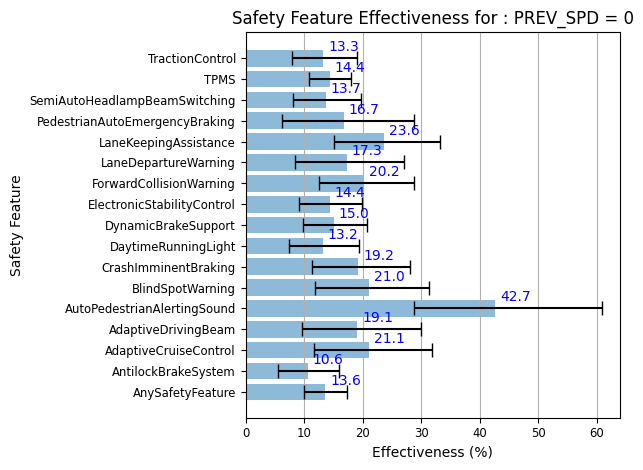

                                      E     DElow    DEhigh         R     SF    SN     NF    NN
------------------------------  -------  --------  --------  --------  -----  ----  -----  ----
AnySafetyFeature                13.5713   3.53227   3.68278  0.864287  11424  3947  14189  4237
AntilockBrakeSystem             10.5705   5.04932   5.35148  0.894295   3608  1268  22005  6916
AdaptiveCruiseControl           21.0754   9.43997  10.7225   0.789246    594   239  25019  7945
AdaptiveDrivingBeam             19.0838   9.53916  10.814    0.809162    624   245  24989  7939
AutoPedestrianAlertingSound     42.6503  13.858    18.2736   0.573497     99    55  25514  8129
BlindSpotWarning                21.0158   9.15453  10.3547   0.789842    637   256  24976  7928
CrashImminentBraking            19.2356   7.9509    8.8191   0.807644    928   364  24685  7820
DaytimeRunningLight             13.1906   5.71928   6.12266  0.868094   2428   881  23185  7303
DynamicBrakeSupport             15.0388 

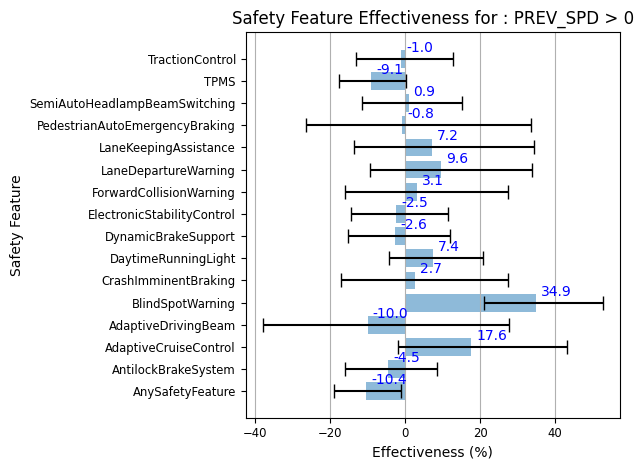

                                         E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ----------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                -10.3622     8.58863   9.31342  1.10362   3438   941  3966  1198
AntilockBrakeSystem              -4.47687   11.5371   12.9693   1.04477   1046   291  6358  1848
AdaptiveCruiseControl            17.6438    19.4776   25.5111   0.823562   146    51  7258  2088
AdaptiveDrivingBeam              -9.98621   28.0371   37.6294   1.09986    152    40  7252  2099
BlindSpotWarning                 34.8784    13.9986   17.8318   0.651216   155    68  7249  2071
CrashImminentBraking              2.68575   19.7566   24.7893   0.973143   236    70  7168  2069
DaytimeRunningLight               7.44422   11.676    13.3616   0.925558   694   215  6710  1924
DynamicBrakeSupport              -2.62509   12.64     14.4155   1.02625    790   223  6614  1916
ElectronicStabilityControl    

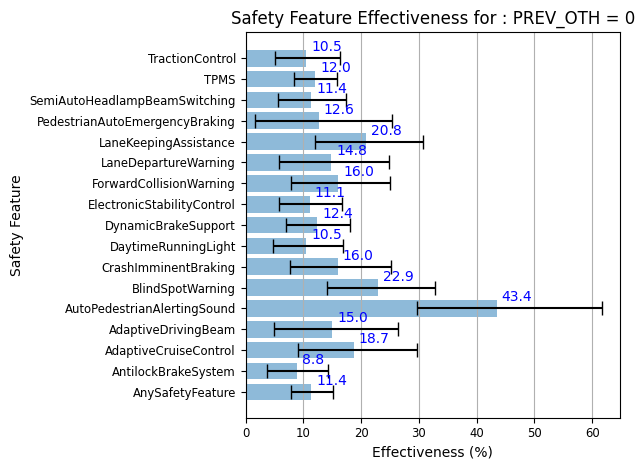

                                       E     DElow    DEhigh         R     SF    SN     NF    NN
------------------------------  --------  --------  --------  --------  -----  ----  -----  ----
AnySafetyFeature                11.3949    3.60974   3.76304  0.886051  11784  4048  13766  4190
AntilockBrakeSystem              8.80495   5.09668   5.39839  0.911951   3720  1297  21830  6941
AdaptiveCruiseControl           18.7034    9.66128  10.9643   0.812966    611   241  24939  7997
AdaptiveDrivingBeam             14.9725   10.0297   11.371    0.850275    641   242  24909  7996
AutoPedestrianAlertingSound     43.4383   13.825    18.2972   0.565617     95    54  25455  8184
BlindSpotWarning                22.8587    8.79255   9.92364  0.771413    646   268  24904  7970
CrashImminentBraking            15.9794    8.26108   9.1619   0.840206    950   362  24600  7876
DaytimeRunningLight             10.5281    5.83601   6.24324  0.894719   2518   897  23032  7341
DynamicBrakeSupport           

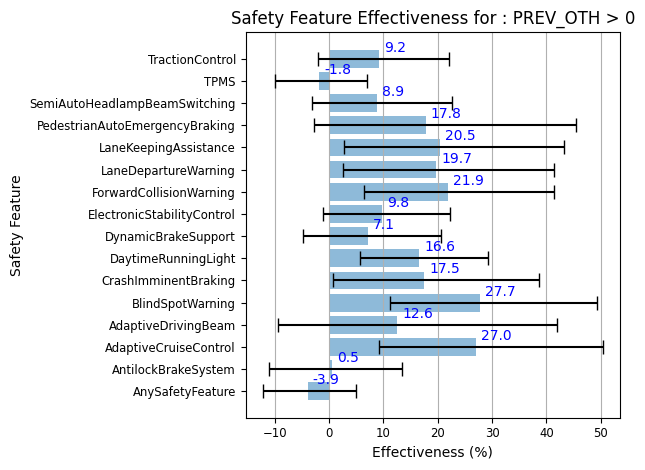

                                        E     DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ---------  --------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                -3.94249    8.25572   8.96801  1.03942   3078   840  4389  1245
AntilockBrakeSystem              0.523706  11.4784   12.9756   0.994763   934   262  6533  1823
AdaptiveCruiseControl           26.9545    17.7426   23.4349   0.730455   129    49  7338  2036
AdaptiveDrivingBeam             12.5623    22.0175   29.4277   0.874377   135    43  7332  2042
BlindSpotWarning                27.7436    16.6011   21.5529   0.722564   146    56  7321  2029
CrashImminentBraking            17.5088    16.767    21.0444   0.824912   214    72  7253  2013
DaytimeRunningLight             16.5913    10.9448   12.5979   0.834087   604   199  6863  1886
DynamicBrakeSupport              7.09373   11.8506   13.5831   0.929063   697   208  6770  1877
ElectronicStabilityControl       9.83983

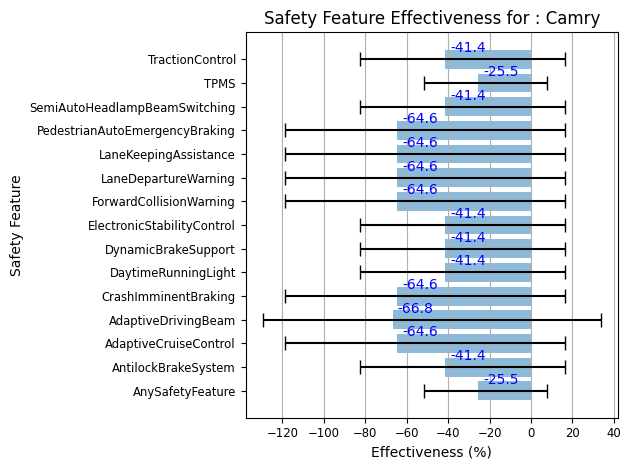

                                       E    DElow    DEhigh        R    SF    SN    NF    NN
------------------------------  --------  -------  --------  -------  ----  ----  ----  ----
AnySafetyFeature                -25.4545  26.2343   33.1707  1.25455   390   132   325   138
AntilockBrakeSystem             -41.3943  40.9983   57.7407  1.41394   121    34   594   236
AdaptiveCruiseControl           -64.5512  54.315    81.0769  1.64551    95    23   620   247
AdaptiveDrivingBeam             -66.847   62.7331  100.533   1.66847    68    16   647   254
CrashImminentBraking            -64.5512  54.315    81.0769  1.64551    95    23   620   247
DaytimeRunningLight             -41.3943  40.9983   57.7407  1.41394   121    34   594   236
DynamicBrakeSupport             -41.3943  40.9983   57.7407  1.41394   121    34   594   236
ElectronicStabilityControl      -41.3943  40.9983   57.7407  1.41394   121    34   594   236
ForwardCollisionWarning         -64.5512  54.315    81.0769  1.64551  

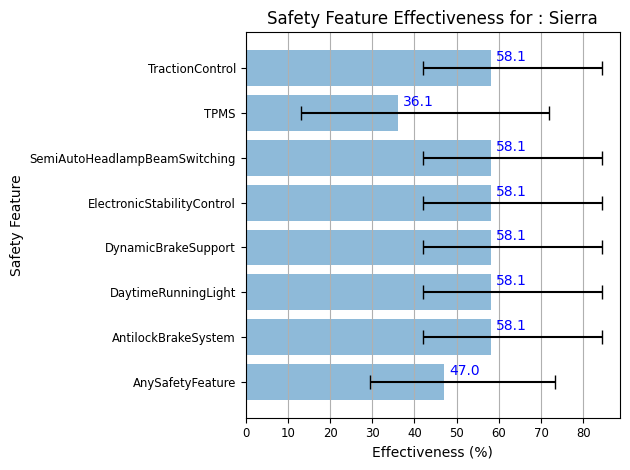

                                     E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               47.0429  17.585    26.3274  0.529571    74    28   529   106
AntilockBrakeSystem            58.1467  16.1756   26.3654  0.418533    39    19   564   115
DaytimeRunningLight            58.1467  16.1756   26.3654  0.418533    39    19   564   115
DynamicBrakeSupport            58.1467  16.1756   26.3654  0.418533    39    19   564   115
ElectronicStabilityControl     58.1467  16.1756   26.3654  0.418533    39    19   564   115
SemiAutoHeadlampBeamSwitching  58.1467  16.1756   26.3654  0.418533    39    19   564   115
TPMS                           36.1074  22.9885   35.9083  0.638926    64    21   539   113
TractionControl                58.1467  16.1756   26.3654  0.418533    39    19   564   115


Tacoma SIZE:  419 --------------------
E    DElow    DEhigh    R    SF    SN  

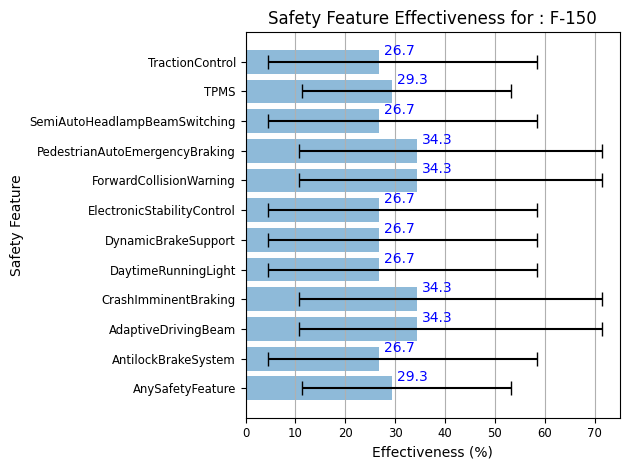

                                      E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                29.2882  17.9341   24.0282  0.707118   163    49  1082   230
AntilockBrakeSystem             26.722   22.142    31.7295  0.73278    101    30  1144   249
AdaptiveDrivingBeam             34.3434  23.7386   37.182   0.656566    57    19  1188   260
CrashImminentBraking            34.3434  23.7386   37.182   0.656566    57    19  1188   260
DaytimeRunningLight             26.722   22.142    31.7295  0.73278    101    30  1144   249
DynamicBrakeSupport             26.722   22.142    31.7295  0.73278    101    30  1144   249
ElectronicStabilityControl      26.722   22.142    31.7295  0.73278    101    30  1144   249
ForwardCollisionWarning         34.3434  23.7386   37.182   0.656566    57    19  1188   260
PedestrianAutoEmergencyBraking  34.3434  23.7386   37.182   0.656566  

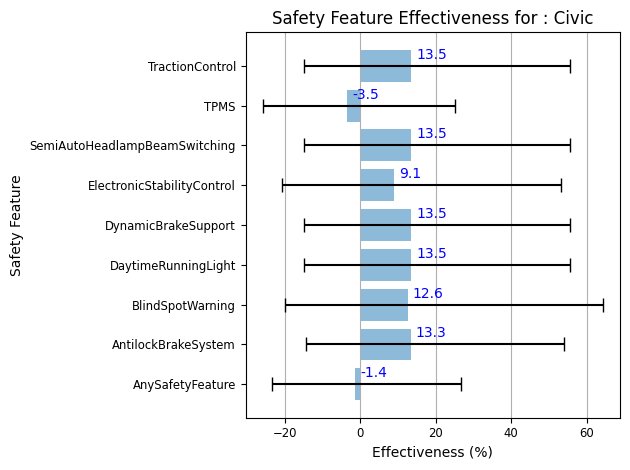

                                      E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  --------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               -1.35898  21.9083   27.9494  1.01359    356   129   324   119
AntilockBrakeSystem            13.3409   27.6638   40.6357  0.866591    70    29   610   219
BlindSpotWarning               12.5519   32.5065   51.739   0.874481    46    19   634   229
DaytimeRunningLight            13.4899   28.3411   42.1495  0.865101    65    27   615   221
DynamicBrakeSupport            13.4899   28.3411   42.1495  0.865101    65    27   615   221
ElectronicStabilityControl      9.0535   29.655    44.0031  0.909465    68    27   612   221
SemiAutoHeadlampBeamSwitching  13.4899   28.3411   42.1495  0.865101    65    27   615   221
TPMS                           -3.45877  22.3532   28.5139  1.03459    354   127   326   121
TractionControl                13.4899   28.3411   42.1495  0.865101  

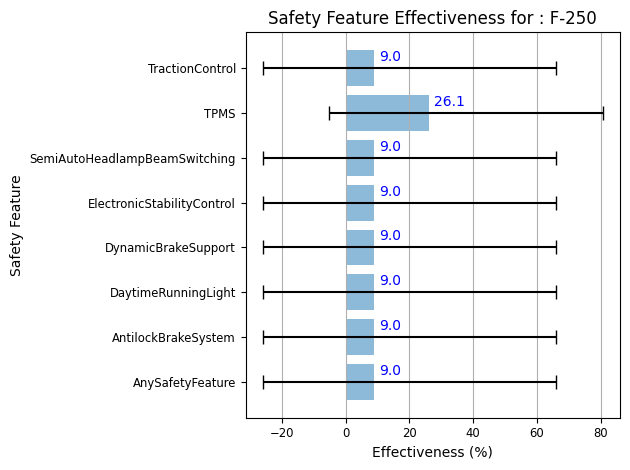

                                      E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  --------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                8.99471  35.0272   56.9448  0.910053    68    17   378    86
AntilockBrakeSystem             8.99471  35.0272   56.9448  0.910053    68    17   378    86
DaytimeRunningLight             8.99471  35.0272   56.9448  0.910053    68    17   378    86
DynamicBrakeSupport             8.99471  35.0272   56.9448  0.910053    68    17   378    86
ElectronicStabilityControl      8.99471  35.0272   56.9448  0.910053    68    17   378    86
SemiAutoHeadlampBeamSwitching   8.99471  35.0272   56.9448  0.910053    68    17   378    86
TPMS                           26.1309   31.3853   54.5715  0.738691    43    13   403    90
TractionControl                 8.99471  35.0272   56.9448  0.910053    68    17   378    86


Impala SIZE:  566 --------------------


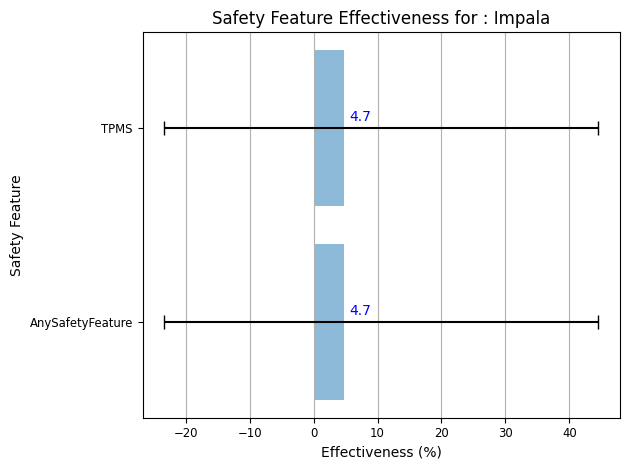

                        E    DElow    DEhigh         R    SF    SN    NF    NN
----------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature  4.73225  28.0648    39.785  0.952677   272    73   176    45
TPMS              4.73225  28.0648    39.785  0.952677   272    73   176    45


Explorer SIZE:  545 --------------------


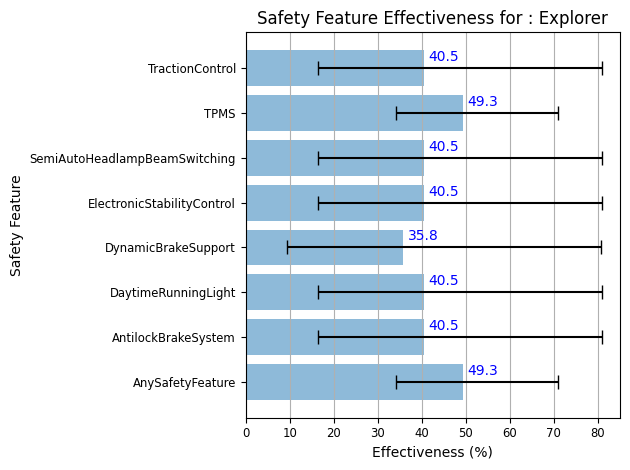

                                     E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               49.3303  15.1695   21.6515  0.506697   158    57   279    51
AntilockBrakeSystem            40.4672  24.1164   40.5382  0.595328    41    16   396    92
DaytimeRunningLight            40.4672  24.1164   40.5382  0.595328    41    16   396    92
DynamicBrakeSupport            35.8081  26.3982   44.8369  0.641919    41    15   396    93
ElectronicStabilityControl     40.4672  24.1164   40.5382  0.595328    41    16   396    92
SemiAutoHeadlampBeamSwitching  40.4672  24.1164   40.5382  0.595328    41    16   396    92
TPMS                           49.3303  15.1695   21.6515  0.506697   158    57   279    51
TractionControl                40.4672  24.1164   40.5382  0.595328    41    16   396    92


CR-V SIZE:  410 --------------------


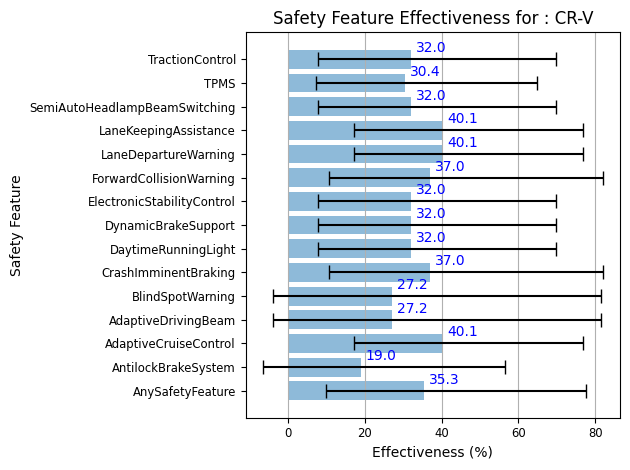

                                     E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               35.3285  25.5673   42.2838  0.646715   235   102    57    16
AntilockBrakeSystem            18.9861  25.6027   37.4324  0.810139    88    41   204    77
AdaptiveCruiseControl          40.0682  22.773    36.7295  0.599318    37    23   255    95
AdaptiveDrivingBeam            27.1717  31.156    54.4497  0.728283    28    15   264   103
BlindSpotWarning               27.1717  31.156    54.4497  0.728283    28    15   264   103
CrashImminentBraking           36.9875  26.2746   45.0659  0.630125    28    17   264   101
DaytimeRunningLight            32.0378  24.2679   37.7463  0.679622    49    27   243    91
DynamicBrakeSupport            32.0378  24.2679   37.7463  0.679622    49    27   243    91
ElectronicStabilityControl     32.0378  24.2679   37.7463  0.679622    49    27 

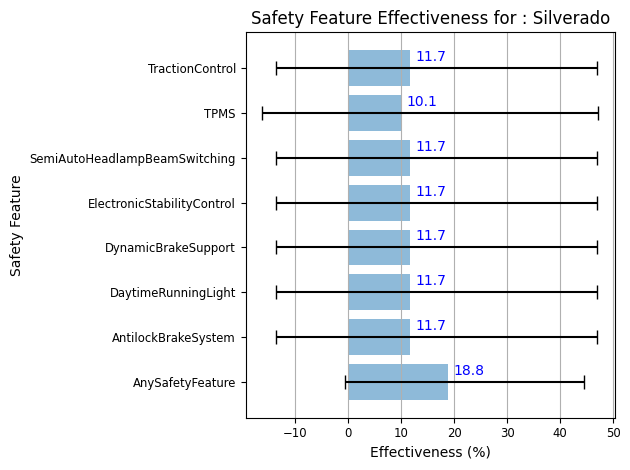

                                     E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               18.8096  19.4765   25.6231  0.811904   201    54  1247   272
AntilockBrakeSystem            11.684   25.2371   35.3342  0.88316    131    33  1317   293
DaytimeRunningLight            11.684   25.2371   35.3342  0.88316    131    33  1317   293
DynamicBrakeSupport            11.684   25.2371   35.3342  0.88316    131    33  1317   293
ElectronicStabilityControl     11.684   25.2371   35.3342  0.88316    131    33  1317   293
SemiAutoHeadlampBeamSwitching  11.684   25.2371   35.3342  0.88316    131    33  1317   293
TPMS                           10.0895  26.2712   37.1164  0.899105   125    31  1323   295
TractionControl                11.684   25.2371   35.3342  0.88316    131    33  1317   293


Accord SIZE:  1113 --------------------


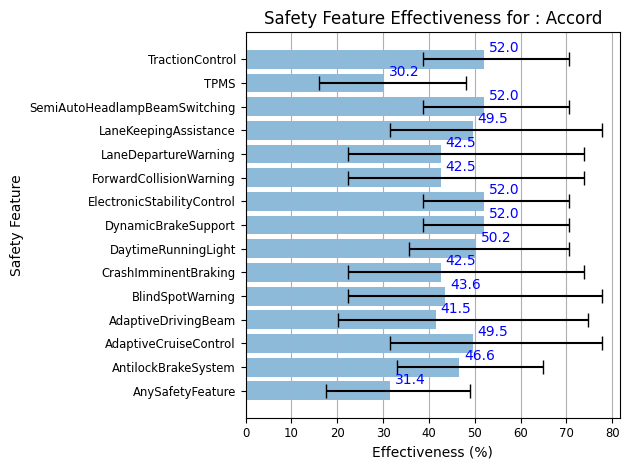

                                     E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature               31.4424  13.9939   17.5828  0.685576   384   154   451   124
AntilockBrakeSystem            46.6102  13.649    18.3368  0.533898   105    59   730   219
AdaptiveCruiseControl          49.5399  18.0798   28.1747  0.504601    38    24   797   254
AdaptiveDrivingBeam            41.4523  21.2527   33.3635  0.585477    40    22   795   256
BlindSpotWarning               43.5625  21.3209   34.2658  0.564375    35    20   800   258
CrashImminentBraking           42.54    20.2414   31.2498  0.5746      43    24   792   254
DaytimeRunningLight            50.1832  14.5084   20.4699  0.498168    68    42   767   236
DynamicBrakeSupport            52.0202  13.3681   18.5313  0.479798    76    48   759   230
ElectronicStabilityControl     52.0202  13.3681   18.5313  0.479798    76    48 

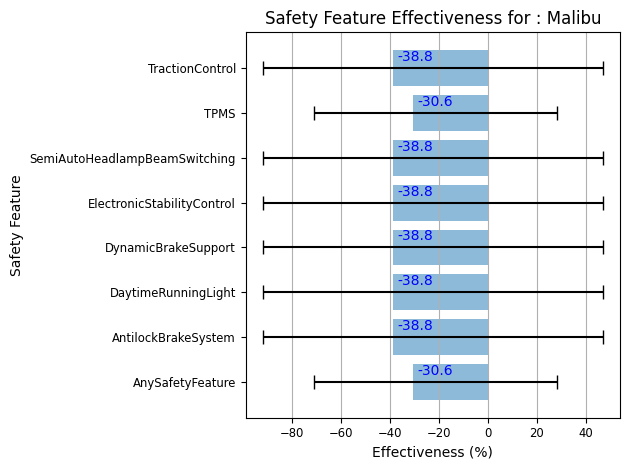

                                      E    DElow    DEhigh        R    SF    SN    NF    NN
-----------------------------  --------  -------  --------  -------  ----  ----  ----  ----
AnySafetyFeature               -30.5977  40.4728   58.648   1.30598   299   100    87    38
AntilockBrakeSystem            -38.8272  53.0178   85.7752  1.38827    63    17   323   121
DaytimeRunningLight            -38.8272  53.0178   85.7752  1.38827    63    17   323   121
DynamicBrakeSupport            -38.8272  53.0178   85.7752  1.38827    63    17   323   121
ElectronicStabilityControl     -38.8272  53.0178   85.7752  1.38827    63    17   323   121
SemiAutoHeadlampBeamSwitching  -38.8272  53.0178   85.7752  1.38827    63    17   323   121
TPMS                           -30.5977  40.4728   58.648   1.30598   299   100    87    38
TractionControl                -38.8272  53.0178   85.7752  1.38827    63    17   323   121


Cascadia SIZE:  466 --------------------
E    DElow    DEhigh    R    SF    SN

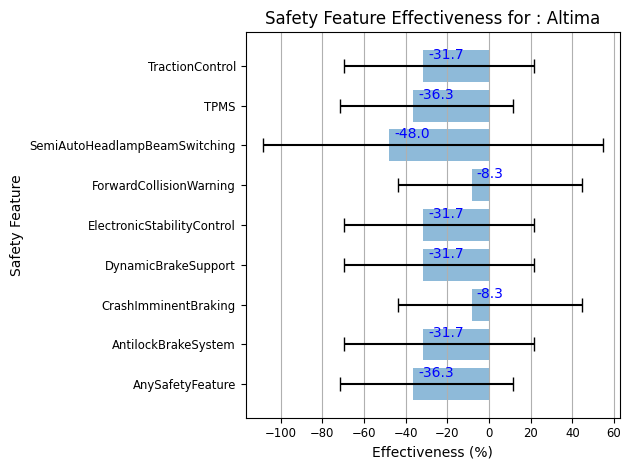

                                       E    DElow    DEhigh        R    SF    SN    NF    NN
-----------------------------  ---------  -------  --------  -------  ----  ----  ----  ----
AnySafetyFeature               -36.2633   35.4359   47.8898  1.36263   464   158   125    58
AntilockBrakeSystem            -31.6561   37.8467   53.1158  1.31656   126    37   463   179
CrashImminentBraking            -8.26211  35.5311   52.8889  1.08262    76    26   513   190
DynamicBrakeSupport            -31.6561   37.8467   53.1158  1.31656   126    37   463   179
ElectronicStabilityControl     -31.6561   37.8467   53.1158  1.31656   126    37   463   179
ForwardCollisionWarning         -8.26211  35.5311   52.8889  1.08262    76    26   513   190
SemiAutoHeadlampBeamSwitching  -48.0269   60.6481  102.743   1.48027    51    13   538   203
TPMS                           -36.2633   35.4359   47.8898  1.36263   464   158   125    58
TractionControl                -31.6561   37.8467   53.1158  1.31656  

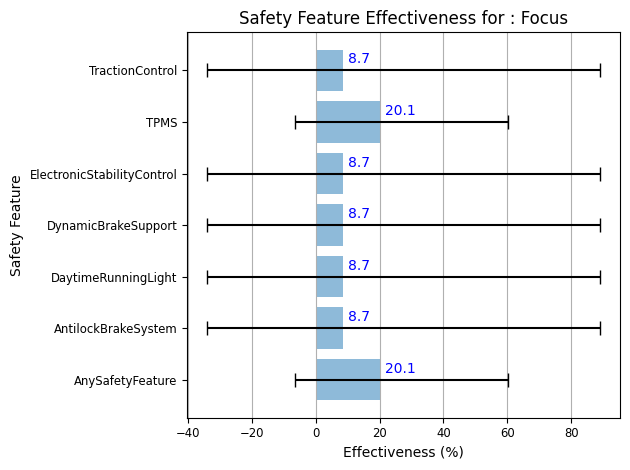

                                   E    DElow    DEhigh         R    SF    SN    NF    NN
--------------------------  --------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature            20.0995   26.6504   39.9883  0.799005   227    77   107    29
AntilockBrakeSystem          8.72131  42.7276   80.3301  0.912787    29    10   305    96
DaytimeRunningLight          8.72131  42.7276   80.3301  0.912787    29    10   305    96
DynamicBrakeSupport          8.72131  42.7276   80.3301  0.912787    29    10   305    96
ElectronicStabilityControl   8.72131  42.7276   80.3301  0.912787    29    10   305    96
TPMS                        20.0995   26.6504   39.9883  0.799005   227    77   107    29
TractionControl              8.72131  42.7276   80.3301  0.912787    29    10   305    96


Grand Cherokee SIZE:  527 --------------------


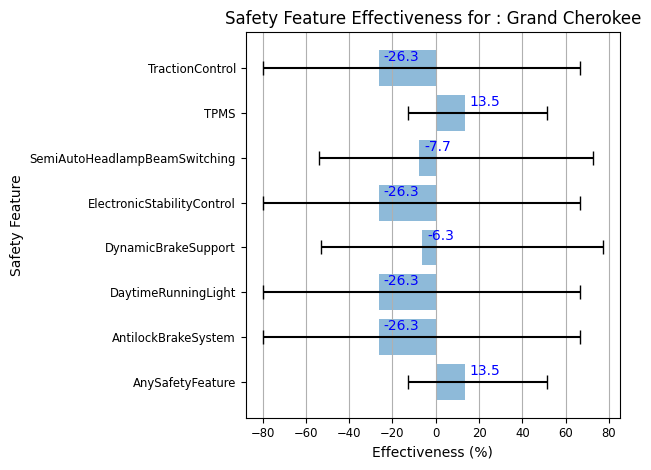

                                       E    DElow    DEhigh         R    SF    SN    NF    NN
-----------------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                13.4752   26.4245   38.0425  0.865248   183    47   243    54
AntilockBrakeSystem            -26.3278   53.6162   93.1519  1.26328     62    12   364    89
DaytimeRunningLight            -26.3278   53.6162   93.1519  1.26328     62    12   364    89
DynamicBrakeSupport             -6.34193  46.8022   83.5917  1.06342     49    11   377    90
ElectronicStabilityControl     -26.3278   53.6162   93.1519  1.26328     62    12   364    89
SemiAutoHeadlampBeamSwitching   -7.66129  46.0426   80.4464  1.07661     54    12   372    89
TPMS                            13.4752   26.4245   38.0425  0.865248   183    47   243    54
TractionControl                -26.3278   53.6162   93.1519  1.26328     62    12   364    89


Corolla SIZE:  704 --------------------


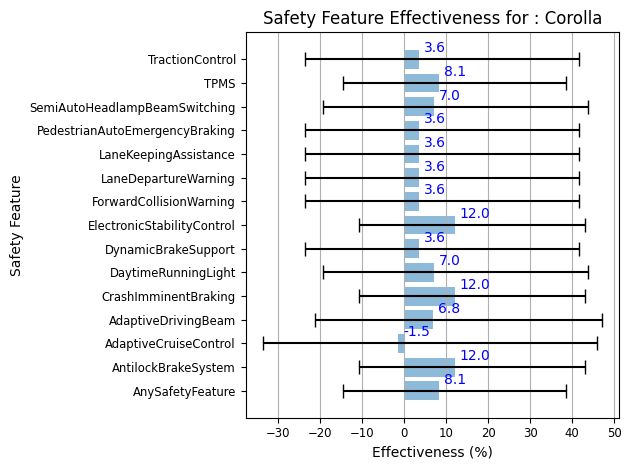

                                       E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  --------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                 8.14937  22.8653   30.444   0.918506   318   131   185    70
AntilockBrakeSystem             12.0355   22.8943   30.9495  0.879645   137    60   366   141
AdaptiveCruiseControl           -1.45199  32.3151   47.4195  1.01452     76    30   427   171
AdaptiveDrivingBeam              6.79825  28.1308   40.2921  0.932018    85    36   418   165
CrashImminentBraking            12.0355   22.8943   30.9495  0.879645   137    60   366   141
DaytimeRunningLight              6.99476  26.339    36.7453  0.930052   104    44   399   157
DynamicBrakeSupport              3.58701  27.234    37.9554  0.96413    107    44   396   157
ElectronicStabilityControl      12.0355   22.8943   30.9495  0.879645   137    60   366   141
ForwardCollisionWarning          3.58701  27.234    37.9554 

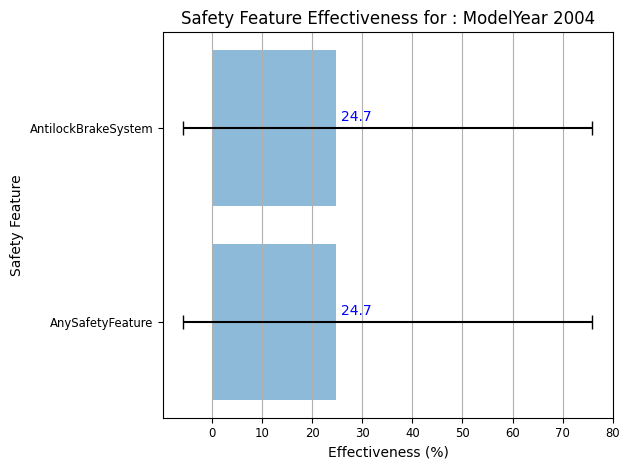

                           E    DElow    DEhigh         R    SF    SN    NF    NN
-------------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature     24.7452  30.4725   51.2078  0.752548    39    14  1514   409
AntilockBrakeSystem  24.7452  30.4725   51.2078  0.752548    39    14  1514   409


2005 SIZE:  2127 --------------------


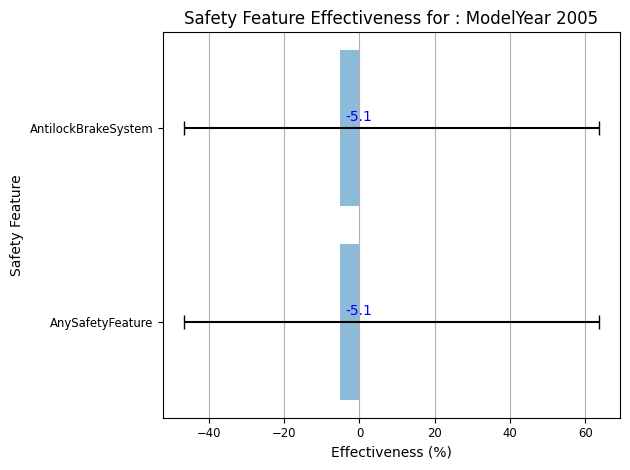

                            E    DElow    DEhigh        R    SF    SN    NF    NN
-------------------  --------  -------  --------  -------  ----  ----  ----  ----
AnySafetyFeature     -5.08156  41.5575   68.7443  1.05082    50    14  1594   469
AntilockBrakeSystem  -5.08156  41.5575   68.7443  1.05082    50    14  1594   469


2006 SIZE:  2042 --------------------


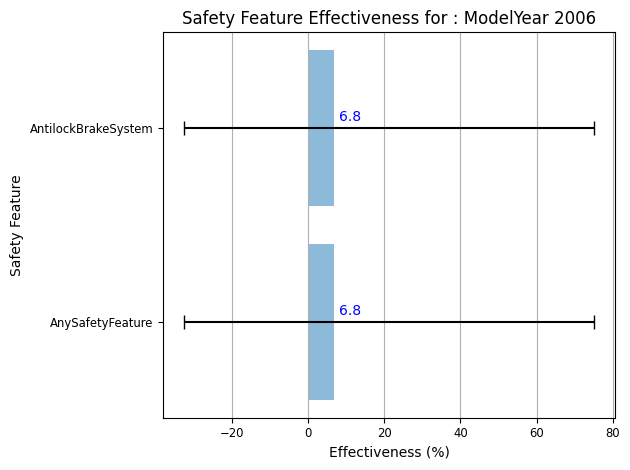

                           E    DElow    DEhigh         R    SF    SN    NF    NN
-------------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature     6.79012  39.4372   68.3607  0.932099    38    12  1539   453
AntilockBrakeSystem  6.79012  39.4372   68.3607  0.932099    38    12  1539   453


2007 SIZE:  2289 --------------------


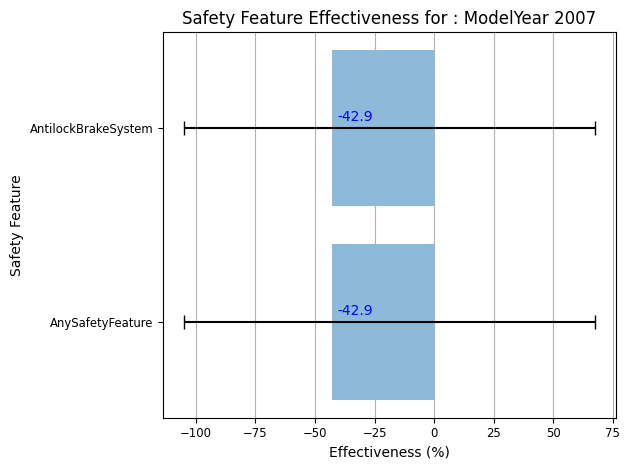

                            E    DElow    DEhigh        R    SF    SN    NF    NN
-------------------  --------  -------  --------  -------  ----  ----  ----  ----
AnySafetyFeature     -42.8735  62.2816   110.413  1.42873    52    10  1747   480
AntilockBrakeSystem  -42.8735  62.2816   110.413  1.42873    52    10  1747   480


2008 SIZE:  2051 --------------------


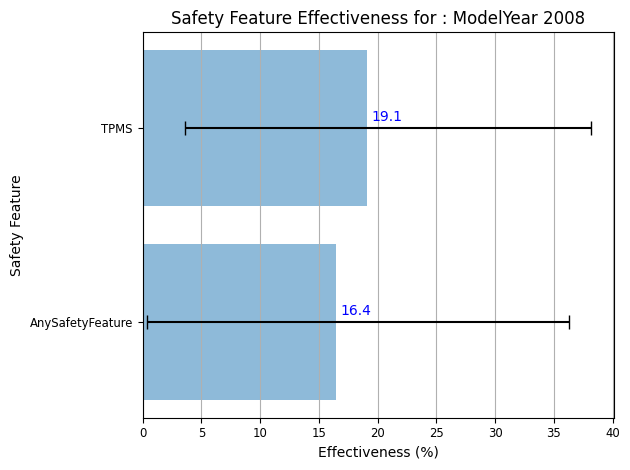

                        E    DElow    DEhigh         R    SF    SN    NF    NN
----------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature  16.4169  16.0501   19.8647  0.835831  1214   410   333    94
TPMS              19.0744  15.4561   19.105   0.809256  1202   409   345    95


2009 SIZE:  1283 --------------------


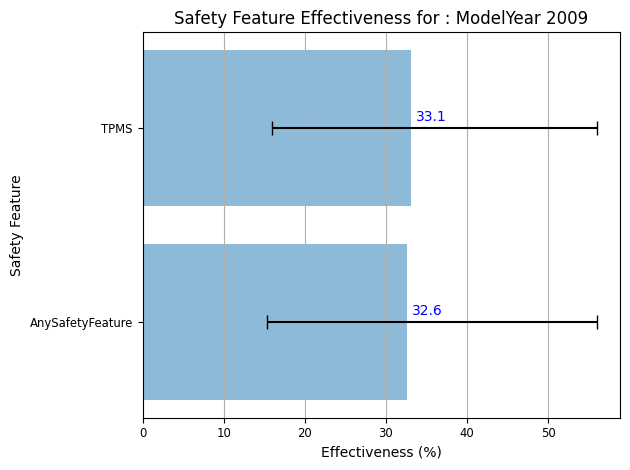

                        E    DElow    DEhigh         R    SF    SN    NF    NN
----------------  -------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature  32.6372  17.3595   23.3862  0.673628   780   271   188    44
TPMS              33.0743  17.1068   22.981   0.669257   775   270   193    45


2010 SIZE:  1422 --------------------


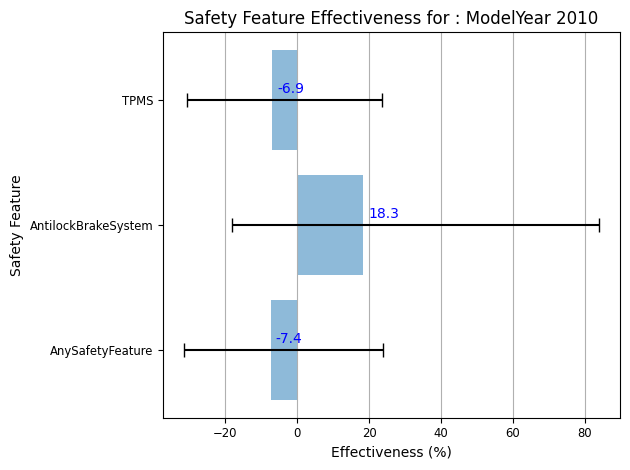

                            E    DElow    DEhigh         R    SF    SN    NF    NN
-------------------  --------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature     -7.3887   24.1544   31.164   1.07389    875   269   209    69
AntilockBrakeSystem  18.2852   36.4153   65.6888  0.817148    29    11  1055   327
TPMS                 -6.91111  23.7081   30.4635  1.06911    865   266   219    72


2011 SIZE:  1615 --------------------


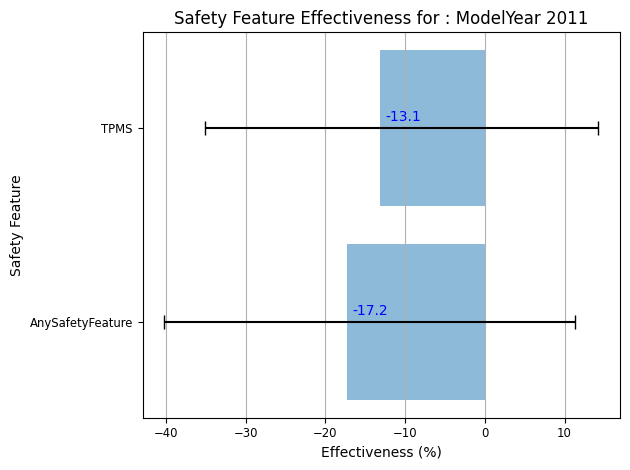

                         E    DElow    DEhigh        R    SF    SN    NF    NN
----------------  --------  -------  --------  -------  ----  ----  ----  ----
AnySafetyFeature  -17.2484   22.943   28.5247  1.17248   935   285   291   104
TPMS              -13.1191   22.027   27.3533  1.13119   924   284   302   105


2012 SIZE:  1786 --------------------


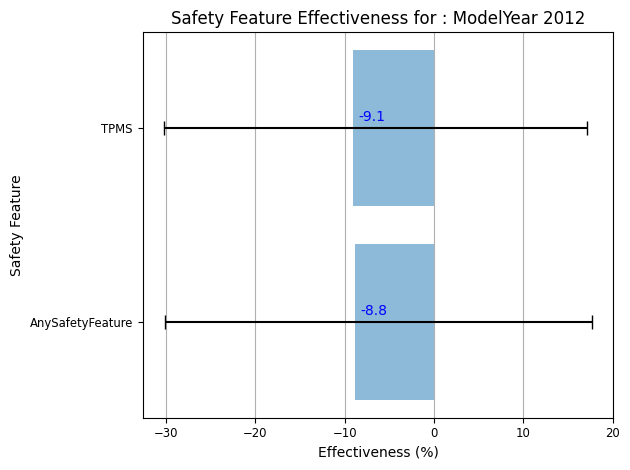

                        E    DElow    DEhigh        R    SF    SN    NF    NN
----------------  -------  -------  --------  -------  ----  ----  ----  ----
AnySafetyFeature  -8.8173  21.3072   26.4951  1.08817  1064   351   273    98
TPMS              -9.0686  21.1517   26.2405  1.09069  1056   348   281   101


2013 SIZE:  1958 --------------------


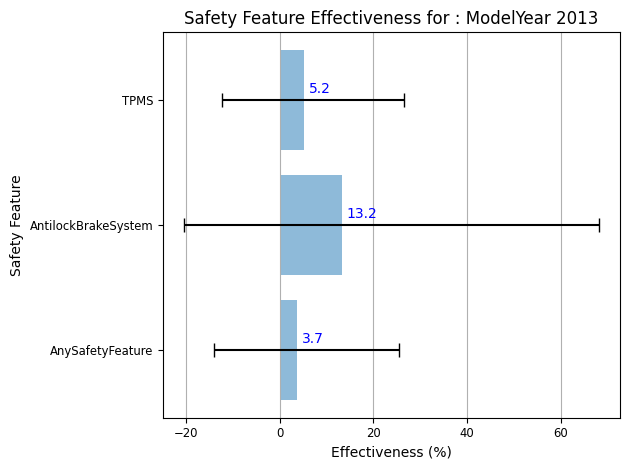

                            E    DElow    DEhigh         R    SF    SN    NF    NN
-------------------  --------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature      3.71715  17.7636   21.7823  0.962828  1125   386   336   111
AntilockBrakeSystem  13.1998   33.6829   55.042   0.868002    41    16  1420   481
TPMS                  5.1789   17.428    21.3526  0.948211  1118   385   343   112


2014 SIZE:  2050 --------------------


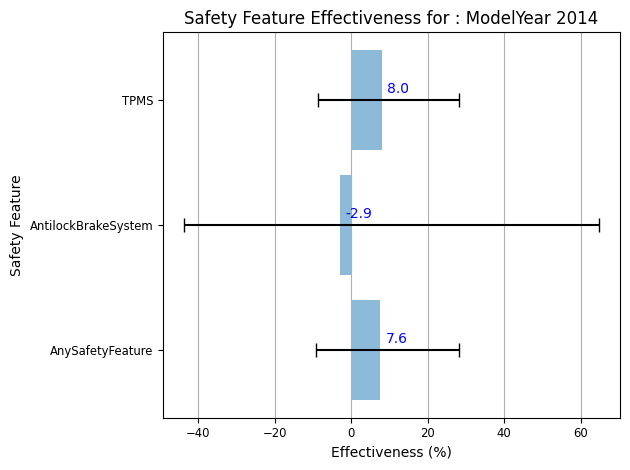

                            E    DElow    DEhigh         R    SF    SN    NF    NN
-------------------  --------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature      7.62094  16.8913   20.671   0.923791  1184   362   393   111
AntilockBrakeSystem  -2.92441  40.8545   67.745   1.02924     48    14  1529   459
TPMS                  7.96158  16.6448   20.3195  0.920384  1169   358   408   115


2015 SIZE:  2262 --------------------


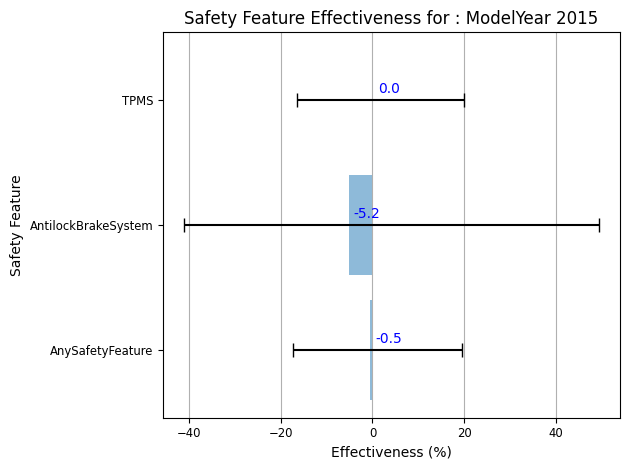

                              E    DElow    DEhigh        R    SF    SN    NF    NN
-------------------  ----------  -------  --------  -------  ----  ----  ----  ----
AnySafetyFeature     -0.531182   16.7315   20.0722  1.00531  1260   414   442   146
AntilockBrakeSystem  -5.17839    35.9437   54.6042  1.05178    67    21  1635   539
TPMS                  0.0440427  16.5318   19.8079  0.99956  1249   411   453   149


2016 SIZE:  2425 --------------------


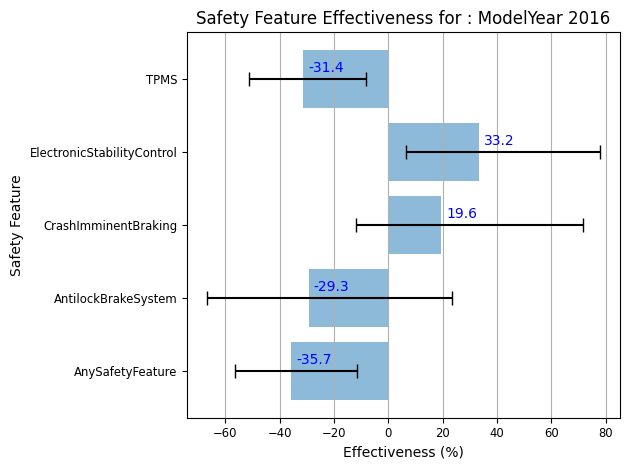

                                   E    DElow    DEhigh         R    SF    SN    NF    NN
--------------------------  --------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature            -35.6865  20.5688   24.2439  1.35686   1320   434   464   207
AntilockBrakeSystem         -29.302   37.488    52.7945  1.29302    110    31  1674   610
CrashImminentBraking         19.5509  31.5884   52.0103  0.804491    36    16  1748   625
ElectronicStabilityControl   33.1884  26.8281   44.8292  0.668116    30    16  1754   625
TPMS                        -31.4313  19.834    23.359   1.31431   1304   432   480   209


2017 SIZE:  2181 --------------------


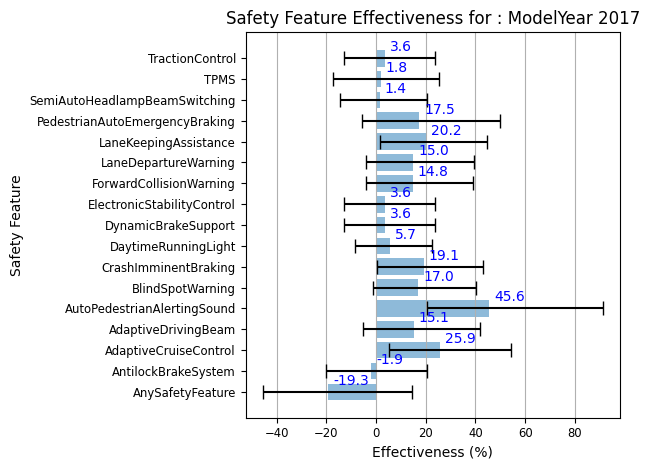

                                        E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                -19.2948   26.3158   33.764   1.19295   1449   493   170    69
AntilockBrakeSystem              -1.86365  18.2492   22.2322  1.01864   1284   444   335   118
AdaptiveCruiseControl            25.891    20.5168   28.3714  0.74109     87    40  1532   522
AdaptiveDrivingBeam              15.1375   20.2721   26.6347  0.848625   139    56  1480   506
AutoPedestrianAlertingSound      45.5729   24.858    45.7556  0.544271    19    12  1600   550
BlindSpotWarning                 16.9968   18.2271   23.356   0.830032   171    70  1448   492
CrashImminentBraking             19.1222   18.546    24.0642  0.808778   150    63  1469   499
DaytimeRunningLight               5.67248  14.2395   16.7713  0.943275   948   337   671   225
DynamicBrakeSupport               3.58889  16.5988

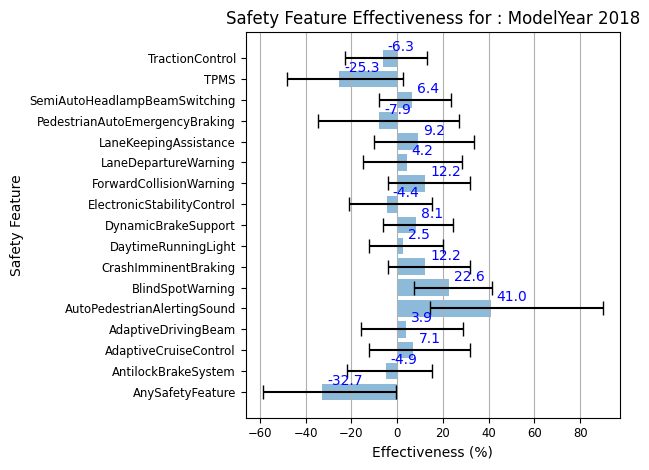

                                        E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  ---------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                -32.6932   26.053    32.4179  1.32693   1271   433   219    99
AntilockBrakeSystem              -4.91932  16.861    20.0895  1.04919    999   351   491   181
AdaptiveCruiseControl             7.14357  19.5083   24.6969  0.928564   205    78  1285   454
AdaptiveDrivingBeam               3.92014  19.76     24.876   0.960799   222    82  1268   450
AutoPedestrianAlertingSound      41.0431   26.7511   48.9715  0.589569    20    12  1470   520
BlindSpotWarning                 22.6132   15.1562   18.8475  0.773868   224    99  1266   433
CrashImminentBraking             12.2173   16.1045   19.7228  0.877827   293   116  1197   416
DaytimeRunningLight               2.4926   14.8866   17.5689  0.975074   744   269   746   263
DynamicBrakeSupport               8.08647  14.0342

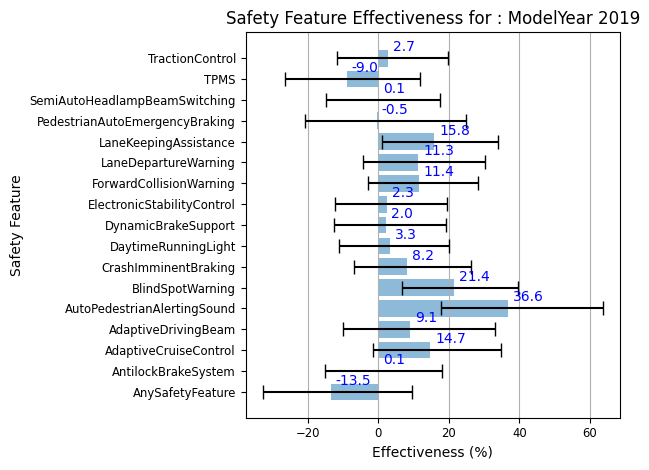

                                          E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  -----------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                -13.524      19.231    23.1531  1.13524   1242   434   363   144
AntilockBrakeSystem               0.0844258  15.204    17.9328  0.999156  1016   366   589   212
AdaptiveCruiseControl            14.7118     16.1641   19.944   0.852882   253   104  1352   474
AdaptiveDrivingBeam               9.05744    18.9605   23.9547  0.909426   202    79  1403   499
AutoPedestrianAlertingSound      36.6148     18.9543   27.0403  0.633852    63    35  1542   543
BlindSpotWarning                 21.3646     14.7631   18.1753  0.786354   248   109  1357   469
CrashImminentBraking              8.19908    15.1665   18.168   0.918009   404   155  1201   423
DaytimeRunningLight               3.30852    14.2983   16.7795  0.966915   878   321   727   257
DynamicBrakeSupport           

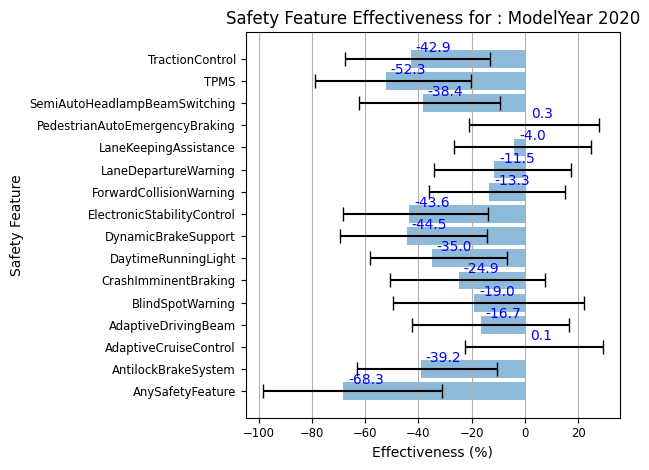

                                          E    DElow    DEhigh         R    SF    SN    NF    NN
------------------------------  -----------  -------  --------  --------  ----  ----  ----  ----
AnySafetyFeature                -68.2625     30.3191   36.9831  1.68262    848   262   302   157
AntilockBrakeSystem             -39.1716     23.8205   28.7395  1.39172    630   195   520   224
AdaptiveCruiseControl             0.0953811  22.6351   29.2658  0.999046   181    66   969   353
AdaptiveDrivingBeam             -16.6625     25.8546   33.2159  1.16662    212    68   938   351
BlindSpotWarning                -18.9662     30.5844   41.168   1.18966    144    45  1006   374
CrashImminentBraking            -24.8769     25.8653   32.6222  1.24877    268    82   882   337
DaytimeRunningLight             -34.988      23.3768   28.2731  1.34988    543   167   607   252
DynamicBrakeSupport             -44.4557     24.8738   30.0476  1.44456    588   176   562   243
ElectronicStabilityControl    

In [254]:
# dictionary to hold results
effectivenessRes = {}

# loop through 5 type of tests 
for i in range(0,5):
    if i==0:
        # 1. Any vehicle, any accident condition
        print("Overall Safety Feature Effectiveness",20*"-")
        effectivenessRes[i] = CalculateEffectiveness(farsAccVehMergeLight,"Overall Safety Feature Effectiveness")
        print(tabulate(effectivenessRes[i],headers="keys"))
        print()
        print()
    elif i==1:
        # 2. Any vehicle, each accident condition
        print(100*"*")
        print()
        print(10*" Safety Feature Effectiveness Any vehicle, each accident condition",)
        print()
        print(100*"*")
        # initialize dictionary to hold results
        effectivenessRes[i]= {}
        for cond in roadConditionsToCheck:
            # initialize dictionary to hold results
            effectivenessRes[i][cond] = {}
            # VNUM_LAN is numerical
            if cond == "VNUM_LAN":
                cats = sorted(farsAccVehMergeLight["VNUM_LAN"].unique())
            else: # the others are FARS categorical
                cats = sorted(farsCategories[cond].keys())
            for option in cats:
                # features to skip
                if cond == "RUR_URB" and option in [6,9,8]:
                    continue
                elif cond == "FUNC_SYS" and option in [96,98,99]:
                    continue
                elif cond == "LGT_COND" and option in [7,8,9]:
                    continue
                elif cond == "WEATHER" and option in [8,98,99]:
                    continue
                elif cond == "VSURCOND" and option in [8,98,99]:
                    continue
                if cond == "VNUM_LAN":
                    title = "Safety Feature Effectiveness for : " + cond + " = " +str(option)
                else:
                    title = "Safety Feature Effectiveness for : " + cond + " = " + farsCategories[cond][option]
                roadConditionDf = farsAccVehMergeLight[farsAccVehMergeLight[cond]==option]
                print(cond,option,"SIZE: ",len(roadConditionDf),20*"-")
                effectivenessRes[i][cond][option] = CalculateEffectiveness(roadConditionDf,title)
                print(tabulate(effectivenessRes[i][cond][option],headers="keys"))
                print()
                print()
    elif i==2:
        # 3. Any vehicle, each driver condition
        # initialize dictionary to hold results
        print(100*"*")
        print()
        print(10*" Safety Feature Effectiveness Any vehicle, each driver condition",)
        print()
        print(100*"*")
        effectivenessRes[i]= {}
        for cond in driverConditionsToCheck:
            # initialize dictionary to hold results
            effectivenessRes[i][cond] = {}
            # if cond is categorical then use categories, else it is numberic
            if cond in farsCategories.keys():
                cats = sorted(farsCategories[cond].keys())
                for option in cats:
                    if cond == "L_STATUS" and option in [7,9]:
                        continue
                    elif cond == "L_TYPE" and option in [6,9]:
                        continue
                    driverConditionDf = farsAccVehMergeLight[farsAccVehMergeLight[cond]==option]
                    print(cond,option,"SIZE: ",len(driverConditionDf),20*"-")
                    if len(driverConditionDf) == 0:
                        continue
                    title = "Safety Feature Effectiveness for : " + cond + " = " + farsCategories[cond][option]
                    effectivenessRes[i][cond][option] = CalculateEffectiveness(driverConditionDf,title)
                    print(tabulate(effectivenessRes[i][cond][option],headers="keys"))
                    print()
                    print()
            elif cond in ["PREV_ACC_OR_INF","PREV_ACC","PREV_DWI","PREV_SPD","PREV_OTH"]:
                # for these variables check two options 0 or 1 and more
                # no infrnactions/accident
                for option in [0,1]:
                    if option==0:
                        _boolIdx = farsAccVehMergeLight[cond]==0
                        title = "Safety Feature Effectiveness for : " + cond + " = 0"
                    else:
                        _boolIdx = farsAccVehMergeLight[cond]>0
                        title = "Safety Feature Effectiveness for : " + cond + " > 0"
                    driverConditionDf = farsAccVehMergeLight[_boolIdx]
                    print(cond,option,"SIZE: ",len(driverConditionDf),20*"-")
                    if len(driverConditionDf) == 0:
                        continue
                    effectivenessRes[i][cond][option] = CalculateEffectiveness(driverConditionDf,title)
                    print(tabulate(effectivenessRes[i][cond][option],headers="keys"))
                    print()
                    print()
        print()
    elif i==3:
        # 4. Top vehicles, any accident condition
        print(100*"*")
        print()
        print(10*" Safety Feature Effectiveness Top vehicles, any accident/driver condition",)
        print()
        print(100*"*")
        # initialize dictionary to hold results
        effectivenessRes[i]= {}
        for modelId in farsAccVehMergeLightTopMod["ModelId"].unique():
            modelConditionDf = farsAccVehMergeLight[farsAccVehMergeLight["ModelId"]==modelId]
            #modelConditionDf = farsAccVehMerge[farsAccVehMerge["ModelId"]==modelId]
            print(farsCategories["ModelId"][modelId],"SIZE: ",len(modelConditionDf),20*"-")
            if len(modelConditionDf) == 0:
                continue
            title = "Safety Feature Effectiveness for : " + farsCategories["ModelId"][modelId]
            effectivenessRes[i][modelId] = CalculateEffectiveness(modelConditionDf,title)
            print(tabulate(effectivenessRes[i][modelId],headers="keys"))
            print()
            print()
    elif i==4:
        # 5. Effectivenes for each Model Year
        print(100*"*")
        print()
        print(10*" Safety Feature Effectiveness for vehicle Model Years any accident/driver condition",)
        print()
        print(100*"*")
        # initialize dictionary to hold results
        effectivenessRes[i]= {}
        for modelYear in farsAccVehMergeLight["ModelYear"].drop_duplicates().sort_values():
            modelYearDf = farsAccVehMergeLight[farsAccVehMergeLight["ModelYear"]==modelYear]
            print(modelYear,"SIZE: ",len(modelYearDf),20*"-")
            if len(modelYearDf) == 0:
                continue
            title = "Safety Feature Effectiveness for : ModelYear " + str(modelYear)
            effectivenessRes[i][modelYear] = CalculateEffectiveness(modelYearDf,title)
            print(tabulate(effectivenessRes[i][modelYear],headers="keys"))
            print()
            print()

 


## Compare overall effectiveness of safety features between top vehicle models

                        E    DElow    DEhigh
--------------  ---------  -------  --------
Explorer         49.3303   15.1695   21.6515
Sierra           47.0429   17.585    26.3274
CR-V             35.3285   25.5673   42.2838
Accord           31.4424   13.9939   17.5828
F-150            29.2882   17.9341   24.0282
Focus            20.0995   26.6504   39.9883
Silverado        18.8096   19.4765   25.6231
Grand Cherokee   13.4752   26.4245   38.0425
F-250             8.99471  35.0272   56.9448
Corolla           8.14937  22.8653   30.444
Impala            4.73225  28.0648   39.785
Civic            -1.35898  21.9083   27.9494
Camry           -25.4545   26.2343   33.1707
Malibu          -30.5977   40.4728   58.648
Altima          -36.2633   35.4359   47.8898


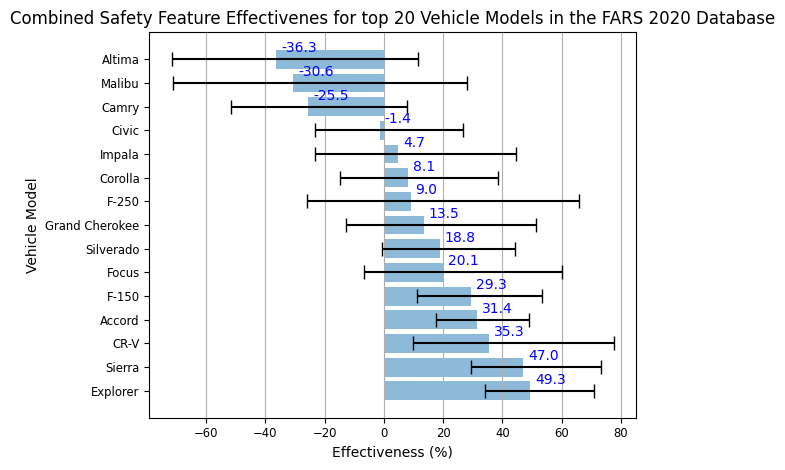

In [116]:
effectTopVeh      = pd.DataFrame(columns=["E","DElow", "DEhigh"])

# populate E values
for modelId in effectivenessRes[3].keys():
    if len(effectivenessRes[3][modelId]) == 0:
        #effectTopVeh.loc[farsCategories["ModelId"][modelId]] = np.array([np.nan,np.nan,np.nan])
        continue
    effectTopVeh.loc[farsCategories["ModelId"][modelId]] = effectivenessRes[3][modelId].loc["AnySafetyFeature"]

effectTopVeh.sort_values(by="E",ascending=False,inplace=True)

print(tabulate(effectTopVeh,headers="keys"))

# plot barh graph
fig, ax = plt.subplots()
bars = ax.barh(effectTopVeh.index, effectTopVeh.E.values, xerr = effectTopVeh[["DElow", "DEhigh"]].transpose().values, align='center', alpha=0.5, ecolor='black', capsize=5)
ax.set_xlabel("Effectiveness (%)")
ax.set_ylabel("Vehicle Model")
ax.set_title("Combined Safety Feature Effectivenes for top 20 Vehicle Models in the FARS 2020 Database")
trans_offset = mtransforms.offset_copy(ax.transData, fig=fig,x=0.05, y=+0.07, units='inches')
ax.tick_params(labelsize="small")
for i in range(len(effectTopVeh)):
    plt.text(x= effectTopVeh.E[i],y= i,s= np.round(effectTopVeh.E[i],1), c='b', transform=trans_offset)
ax.xaxis.grid(True)
plt.tight_layout()
plt.show()